# 2. Regression Task
##### Name: _R.M. Nipuna Upeksha_
##### IIT ID: _20230106_
##### RGU ID: _2322823_

## 1.1 Introduction
1. Clearly define the data mining problem and objectives.
2. Formulates the problem in a way suitable for data mining techniques.

For the regression task, the following dataset was chosen from Kaggle. https://www.kaggle.com/datasets/gauravduttakiit/predict-the-house-prices-king-county. Following are the columns in the dataset.

- `id` → ID of the record
- `date` → Date added
- `price` → The price of the house
- `bedrooms` → Number of bedrooms
- `bathrooms` → Number of bathrooms
- `sqft_living` → Square footage of the house
- `sqft_lot` → Square footage of the lot
- `floors` → Number of floors/level
- `waterfront` → 1 = Waterfront view, 0 = No waterfront view
- `view` → 1 = House been viewed, 0 = House has not been viewed
- `condition` → 1 indicates worn-out property and 5 is excellent
- `grade` → Overall grade given to the housing unit, based on the King County Grading System, 1 = poor, 13 = excellent
- `sqft_above` → Square footage of house apart from the basement
- `sqft_basement` → Square footage of the basement
- `yr_built` → Built year of the house
- `yr_renovated` → Renovated year of the house
- `zipcode` → Zipcode
- `lat` → Latitude coordination
- `long` → Longitude coordination
- `sqft_living15` → Square footage of the house in 2015
- `sqft_lot15` → Square footage of the lot in 2015 (implies some renovations)

### 1.1.1 Data Mining Problem and Objectives
The data mining problem is to <span style='background-color: #FFFF6E;'>develop a predictive model to estimate house prices based on various features provided in the dataset</span>. 

The objective is to <span style='background-color: #FFFF6E;'>create a robust regression model that accurately predicts the selling prices of houses in the King County area, using attributes such as the number of bedrooms, bathrooms, square footage of living space, lot size, number of floors, waterfront status, view, house condition, grade, square footage above and below ground, year built, year renovated, and other relevant factors.</span>

### 1.1.2 Problem Formulation with Data Mining Techniques

We can divide the problem formulation and necessary steps that can be taken to solve it into the following steps.

**Description**

The primary goal is to analyze and understand the relationships between these features and house prices. By doing so, we can determine to build a model that can provide accurate price estimates for new or existing houses in the area. This predictive model can be utilized by real estate agents, buyers, and sellers to make informed decisions about pricing, investment, and market trends in the King County housing market. Additionally, insights gained from the analysis can help identify key factors that influence house prices, aiding in future development and investment strategies.

In summary, the problem statement for data mining is <span style='background-color: #FFFF6E;'>to develop a regression model that utilizes the provided dataset's features to forecast house prices accurately, enabling informed decision-making in the real-estate market.</span>

**Methodology**
1. Data Pre-processing\
(a) Handling NA/missing values if any.\
(b) Handling outliers.\
(c) Feature scaling for uniformity.\
(d) Encoding categorical variables, if present.
3. Exploratory Data Analysis(EDA)\
(a) Understanding the data and feature distribution.
4. Feature Selection\
(a) Identifying relevant features for regression.\
(b) Removing redundant or less impactful features.
6. Regression Algorithm\
(a) Utilizing regression algorithms like linear, lasso, and ridge regression.\
(b) Predicting the house prices based on those regression models.

## 1.2 Pre-process the Dataset
1. Handle missing values and outliers if any.
2. Produce Q-Q plots and histograms of the features and apply the transformations if required.
3. If it is required, apply suitable feature coding techniques.
4. Scale and/or standardize the features and produce relevant graphs to show the scaling/standardizing effect.
5. If required, apply suitable feature discretization techniques.

Before applying the algorithms to our dataset, we need to pre-process the dataset to remove NA/missing values, duplications, and outliers.

Let's import the necessary libraries and our dataset first.

The following code is used to ignore the warnings that may pop up in the libraries.

```python
import warnings
warnings . filterwarnings ("ignore" , category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
```

In [1]:
# Import libraries
# Data structures
import pandas as pd
import numpy as np

# Data processing
import scipy.stats as stats
from sklearn.preprocessing import FunctionTransformer, MinMaxScaler, KBinsDiscretizer, PolynomialFeatures
from scipy.sparse import csr_matrix
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, KFold
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import RFE

# Visualization and analysis
import matplotlib.pyplot as plt
from yellowbrick.regressor import PredictionError, ResidualsPlot
import seaborn as sns

# Warnings
import warnings
warnings . filterwarnings ("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

Next let's import the dataset as a `Pandas` data frame.

In [2]:
# Constants
# The dataset
KING_COUNTY_HOUSE_PRICES_DATASET = './datasets/kc_house_data.csv'

In [3]:
# Read the dataset
df = pd.read_csv(KING_COUNTY_HOUSE_PRICES_DATASET)

Let's check the number of records and features in the dataset. Also let's print the first 10 records to check the data in our dataset.

In [4]:
# Count the number of records in the data frame
number_of_records = len(df.index)
print(f'Number of records in the dataset: {number_of_records}')

# Count the number of features in the data frame
number_of_features = len(df.columns)
print(f'Number of features in the dataset: {number_of_features}')

# Show first 10 records
df.head(10)

Number of records in the dataset: 21613
Number of features in the dataset: 21


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503
5,7237550310,20140512T000000,1225000.0,4,4.50,5420,101930,1.0,0,0,...,11,3890.0,1530,2001,0,98053,47.6561,-122.005,4760,101930
6,1321400060,20140627T000000,257500.0,3,2.25,1715,6819,2.0,0,0,...,7,1715.0,0,1995,0,98003,47.3097,-122.327,2238,6819
7,2008000270,20150115T000000,291850.0,3,1.50,1060,9711,1.0,0,0,...,7,1060.0,0,1963,0,98198,47.4095,-122.315,1650,9711
8,2414600126,20150415T000000,229500.0,3,1.00,1780,7470,1.0,0,0,...,7,1050.0,730,1960,0,98146,47.5123,-122.337,1780,8113
9,3793500160,20150312T000000,323000.0,3,2.50,1890,6560,2.0,0,0,...,7,1890.0,0,2003,0,98038,47.3684,-122.031,2390,7570


To get a general idea about the dataset, we can use the `df.describe()` function, which will provide the metrics like `mean`, `count`, and `standard deviation` of the dataset.

In [5]:
# Get a general idea about the dataset
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21611.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.396095,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.128162,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


The following code also provide a general idea about the dataset. It provides information on the data types in the dataset and the non-null data count.

In [6]:
# Get a general idea about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21611 non-null  float64
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

### 1.2.1 Removing Duplicated Records, Missing Values, and Outliers from the Dataset

The following code snippets show how you can remove the duplicate records, and process the missing values and outliers from the dataset.

#### Step 1 - Removing Duplicated Records

Let's first look at the data frame and remove the duplicate records if present. To check whether we have duplicate records we can use `df.duplicated().sum()` function.

First, let's check the dataset for any duplicated values. Since there can be duplicated values in the features <span style='background-color: #FFFF6E;'>bedrooms, bathrooms, and other features that contain simple integer values</span> we need to select a unique combination of features to check for the duplicated records. Here, the following features are selected to identify the duplicates.

- `sqft_living`
- `sqft_lot`
- `sqft_above`
- `sqft_basement`
- `lat`
- `long`
- `sqft_living15`
- `sqft_lot15`
- `zipcode`

After identifying the duplicates we can remove them to make sure there are unique records are present in the data frame.

In [7]:
# Get a copy of the df data frame
df1 = df.copy()

# Drop the duplicates
df1 = df1.drop_duplicates(subset=['sqft_living','sqft_lot','sqft_above','sqft_basement','lat','long','sqft_living15','sqft_lot15','zipcode'])

# Reset index after removing the duplicates
df1 = df1.reset_index(drop=True)

# Count the number of records in the duplicates removed data frame
number_of_records = len(df1.index)
print(f'Number of records in the dataset after removing duplicates: {number_of_records}')

# Count the number of features in the duplicates removed data frame
number_of_features = len(df1.columns)
print(f'Number of features in the dataset after removing duplicates: {number_of_features}')

# Show first 10 records
df1.head(10)

Number of records in the dataset after removing duplicates: 21423
Number of features in the dataset after removing duplicates: 21


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503
5,7237550310,20140512T000000,1225000.0,4,4.50,5420,101930,1.0,0,0,...,11,3890.0,1530,2001,0,98053,47.6561,-122.005,4760,101930
6,1321400060,20140627T000000,257500.0,3,2.25,1715,6819,2.0,0,0,...,7,1715.0,0,1995,0,98003,47.3097,-122.327,2238,6819
7,2008000270,20150115T000000,291850.0,3,1.50,1060,9711,1.0,0,0,...,7,1060.0,0,1963,0,98198,47.4095,-122.315,1650,9711
8,2414600126,20150415T000000,229500.0,3,1.00,1780,7470,1.0,0,0,...,7,1050.0,730,1960,0,98146,47.5123,-122.337,1780,8113
9,3793500160,20150312T000000,323000.0,3,2.50,1890,6560,2.0,0,0,...,7,1890.0,0,2003,0,98038,47.3684,-122.031,2390,7570


#### Step 2 - Handling Missing Values

Since there are no duplications in the dataset, next we need to check for the missing values(NA/null values). To get an idea about whether we have missing values, we can iterate the data rows and check for the unique values in each column.

In [8]:
# Checking the unique data in the dataset
for col_name in df1:
    print(f'==========={col_name}===========')
    print(df1[col_name].unique())
    print('\n')

===========id===========
[7129300520 6414100192 5631500400 ... 1523300141  291310100 1523300157]


===========date===========
['20141013T000000' '20141209T000000' '20150225T000000' '20150218T000000'
 '20140512T000000' '20140627T000000' '20150115T000000' '20150415T000000'
 '20150312T000000' '20150403T000000' '20140527T000000' '20140528T000000'
 '20141007T000000' '20150124T000000' '20140731T000000' '20140529T000000'
 '20141205T000000' '20150424T000000' '20140514T000000' '20140826T000000'
 '20140703T000000' '20140516T000000' '20141120T000000' '20141103T000000'
 '20140626T000000' '20141201T000000' '20140624T000000' '20150302T000000'
 '20141110T000000' '20141203T000000' '20140613T000000' '20141230T000000'
 '20150213T000000' '20140620T000000' '20140715T000000' '20140811T000000'
 '20140707T000000' '20141028T000000' '20140729T000000' '20140718T000000'
 '20150325T000000' '20140716T000000' '20150428T000000' '20150311T000000'
 '20140916T000000' '20150217T000000' '20141231T000000' '20150205T000000

As you can see, to check for missing values in each column, we have to check the data manually, and it is a laborious task. Therefore, what we can do first is not check for the unique values, but plot the missing values using the `Seaborn` library’s `heatmap()` function. This will give us an idea about whether we have missing values or not.

<Axes: >

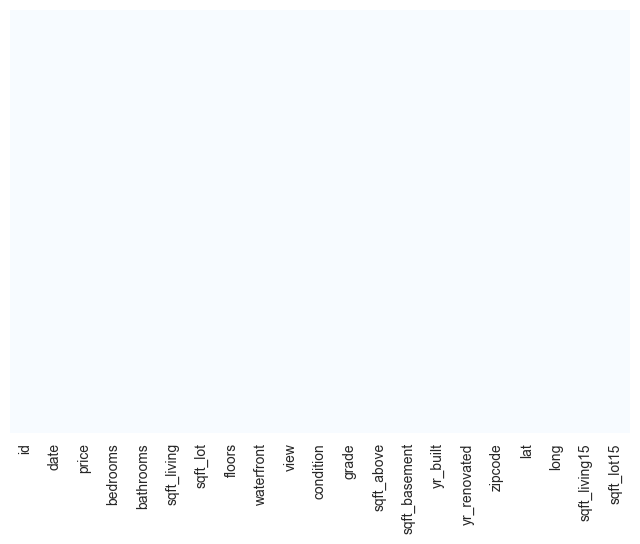

In [9]:
# View the heatmap to check null/NaN values
sns.heatmap(df1.isnull(), yticklabels=False, cbar=False, cmap="Blues")

Since we can see that there are missing values present in the dataset(because of the graph), next we need to check how many missing values are present in each column. To get that information you can use the below given options.
- `df.isnull().sum()`
- `df.info()`

In [10]:
# Similarly, check with df.isnull().sum() the missing values in the data frame
df1.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       2
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [11]:
# Similarly, check with df.info() the missing values in the data frame
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21423 entries, 0 to 21422
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21423 non-null  int64  
 1   date           21423 non-null  object 
 2   price          21423 non-null  float64
 3   bedrooms       21423 non-null  int64  
 4   bathrooms      21423 non-null  float64
 5   sqft_living    21423 non-null  int64  
 6   sqft_lot       21423 non-null  int64  
 7   floors         21423 non-null  float64
 8   waterfront     21423 non-null  int64  
 9   view           21423 non-null  int64  
 10  condition      21423 non-null  int64  
 11  grade          21423 non-null  int64  
 12  sqft_above     21421 non-null  float64
 13  sqft_basement  21423 non-null  int64  
 14  yr_built       21423 non-null  int64  
 15  yr_renovated   21423 non-null  int64  
 16  zipcode        21423 non-null  int64  
 17  lat            21423 non-null  float64
 18  long  

There are two options to handle missing data in a data set.

1. If the missing value count of a column is greater than 50% - 70%, then we need to <span style='background-color: #FFFF6E;'>remove</span> that column from the dataset.
2. If the missing value count of a column is less than 50% - 70%, then we need to <span style='background-color: #FFFF6E;'>impute</span> the missing values.

Since we only have 2 missing values from `sqft_above`. Therefore, we can simply <span style='background-color: #FFFF6E;'>replace(data imputation)</span> the missing values with the mean values of their respective columns.

In [12]:
# Fill up the missing elements in the 'sqft_above' with the mean of the 'sqft_above'
df1.loc[(df1['sqft_above'].isnull() == True), 'sqft_above'] = df1['sqft_above'].mean()

In [13]:
# Check again to verify whether the missing values have been filled or not after data imputation
df1.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In addition, we do not need the `id`, and `date` features from the data frame, since they do not provide information on the property. Therefore, we can drop them from our dataset.

In [14]:
# Copy the data frame
df2 = df1.copy()

# Drop the id and date columns
df2 = df2.drop(columns=['id','date'])

# Get the info regarding the dataset to confirm whether the id and date columns are removed
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21423 entries, 0 to 21422
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21423 non-null  float64
 1   bedrooms       21423 non-null  int64  
 2   bathrooms      21423 non-null  float64
 3   sqft_living    21423 non-null  int64  
 4   sqft_lot       21423 non-null  int64  
 5   floors         21423 non-null  float64
 6   waterfront     21423 non-null  int64  
 7   view           21423 non-null  int64  
 8   condition      21423 non-null  int64  
 9   grade          21423 non-null  int64  
 10  sqft_above     21423 non-null  float64
 11  sqft_basement  21423 non-null  int64  
 12  yr_built       21423 non-null  int64  
 13  yr_renovated   21423 non-null  int64  
 14  zipcode        21423 non-null  int64  
 15  lat            21423 non-null  float64
 16  long           21423 non-null  float64
 17  sqft_living15  21423 non-null  int64  
 18  sqft_l

Furthermore, if you look at the `yr_renovated` unique value set, you can notice that there is 0 included as a value there as well. <span style='background-color: #FFFF6E;'>The value 0 is included for houses that were not renovated. If you check how many records contain the `yr_renovated = 0` you will notice that there is a large number of houses like that.</span>

In [15]:
# Check number of houses that complies to yr_renovated == 0
non_renovated_count = len(df2[df2['yr_renovated']==0])
print(f'Number of houses that were not renovated:{non_renovated_count}')

non_renovated_percentage = (non_renovated_count/len(df2)) * 100
print(f'Percentage of number of houses that were not renovated:{non_renovated_percentage}')

Number of houses that were not renovated:20513
Percentage of number of houses that were not renovated:95.75222891285068


Since the value percentage of missing values is greater than 70%, we will remove this column from the dataset.

In [16]:
# Drop yr_renovated column
df2 = df2.drop(columns=['yr_renovated'])

# Check the dataset
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21423 entries, 0 to 21422
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21423 non-null  float64
 1   bedrooms       21423 non-null  int64  
 2   bathrooms      21423 non-null  float64
 3   sqft_living    21423 non-null  int64  
 4   sqft_lot       21423 non-null  int64  
 5   floors         21423 non-null  float64
 6   waterfront     21423 non-null  int64  
 7   view           21423 non-null  int64  
 8   condition      21423 non-null  int64  
 9   grade          21423 non-null  int64  
 10  sqft_above     21423 non-null  float64
 11  sqft_basement  21423 non-null  int64  
 12  yr_built       21423 non-null  int64  
 13  zipcode        21423 non-null  int64  
 14  lat            21423 non-null  float64
 15  long           21423 non-null  float64
 16  sqft_living15  21423 non-null  int64  
 17  sqft_lot15     21423 non-null  int64  
dtypes: flo

#### Step 3 - Removing/Capping Outliers

Now, what we need to do is check for the outliers in the dataset and remove them. There are a few ways that you can do to remove the outliers in a dataset.

1. **Z-Score** → Calculate the Z-score for each observation and remove the data points with a Z-Score beyond the threshold.
2. **Inter-quartile Range(IQR) Method** → Compute the IQR for the data and remove data points that fall below $Q_1 − 1.5 × IQR$ or above $Q_3 + 1.5 × IQR$ where is the $Q_1$ 25th percentile and $Q_3$ is the 75th percentile.
3. **Percentile Method** → Rather than using the 25th and 75th percentile, we can define custom ranges and use them.

##### <u>Using Percentile Method</u>

We want to check the outliers with numerical values. Therefore, we first need to remove the <span style='background-color: #FFFF6E;'>categorical values and other binary values</span> present in the data frame. To do that, we can copy the data frame using `df.copy()` and select a slice from that where we have the necessary numerical columns. The following code snippet shows how to get the results using the percentile method.

Before removing outliers the shape of price:(21423, 18)
After removing outliers the shape of price:(19269, 18)


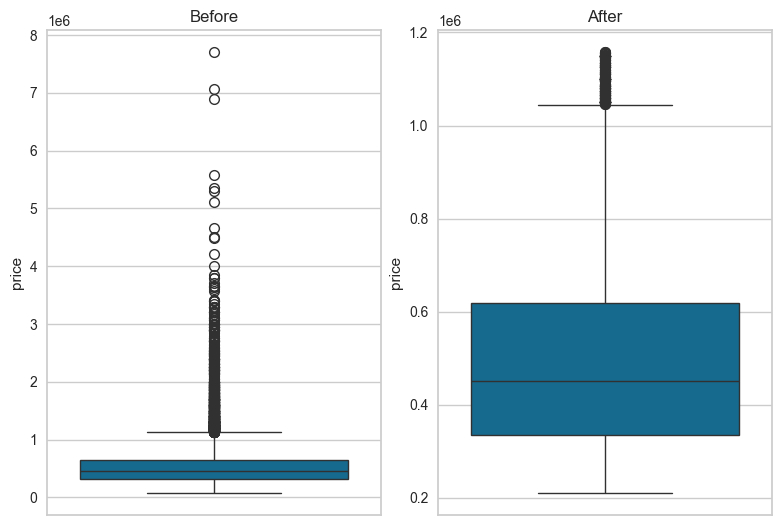

Before removing outliers the shape of bedrooms:(21423, 18)
After removing outliers the shape of bedrooms:(16573, 18)


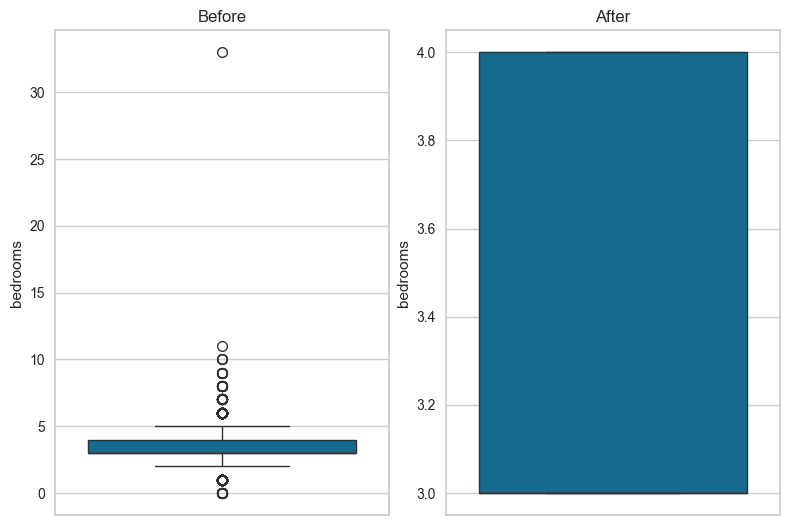

Before removing outliers the shape of bathrooms:(21423, 18)
After removing outliers the shape of bathrooms:(16261, 18)


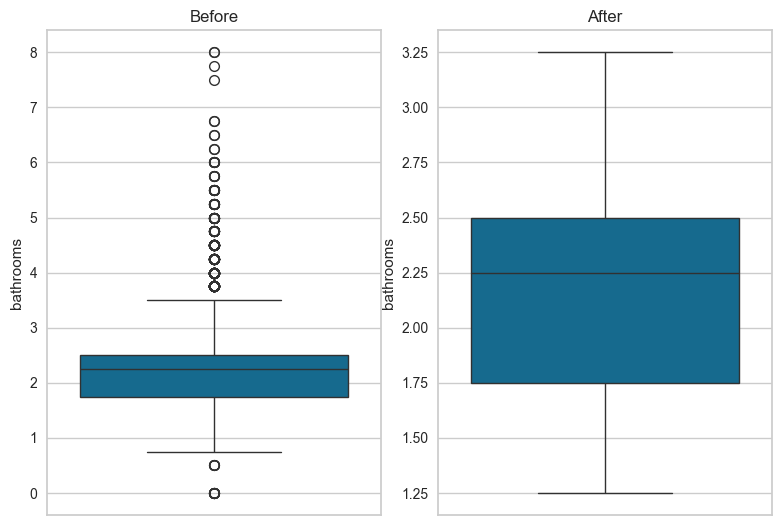

Before removing outliers the shape of sqft_living:(21423, 18)
After removing outliers the shape of sqft_living:(19235, 18)


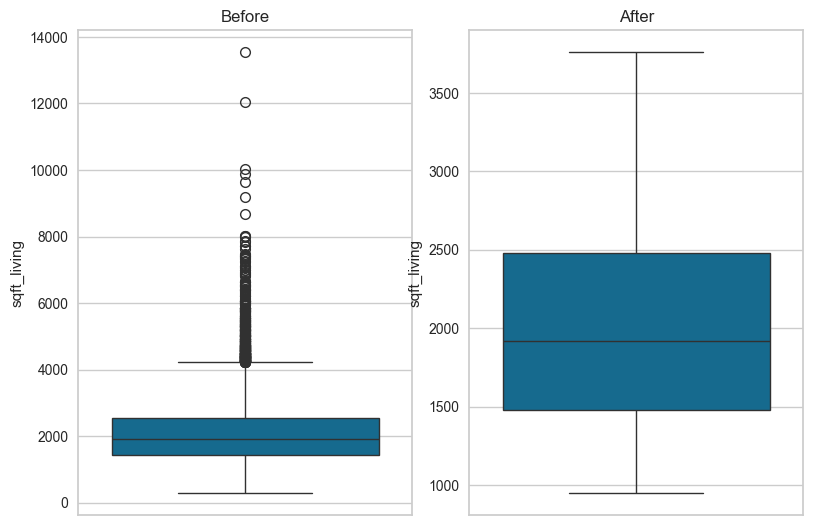

Before removing outliers the shape of sqft_lot:(21423, 18)
After removing outliers the shape of sqft_lot:(19278, 18)


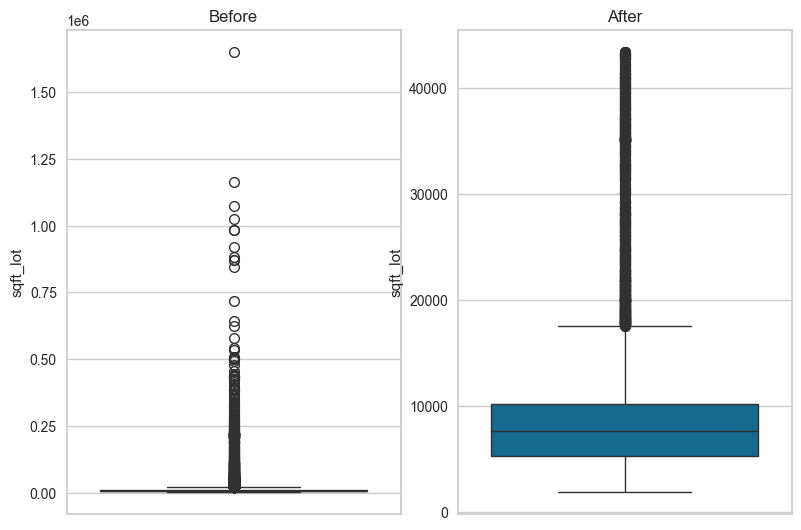

Before removing outliers the shape of floors:(21423, 18)
After removing outliers the shape of floors:(1888, 18)


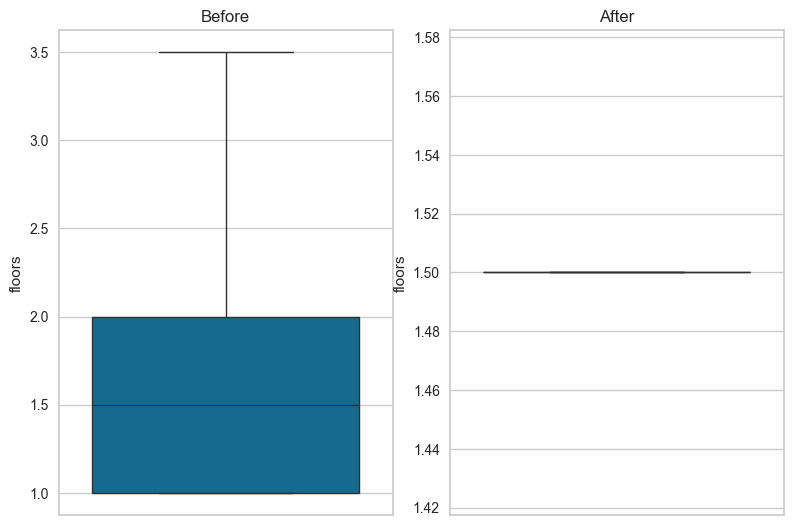

Before removing outliers the shape of condition:(21423, 18)
After removing outliers the shape of condition:(5643, 18)


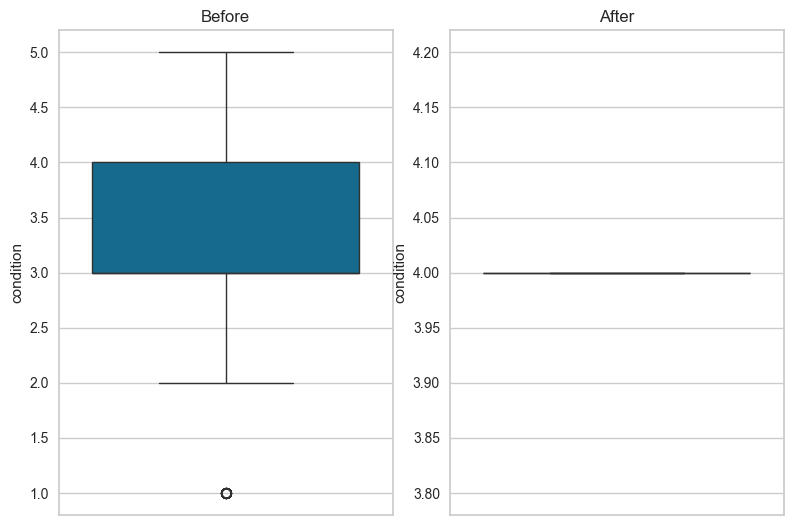

Before removing outliers the shape of grade:(21423, 18)
After removing outliers the shape of grade:(17533, 18)


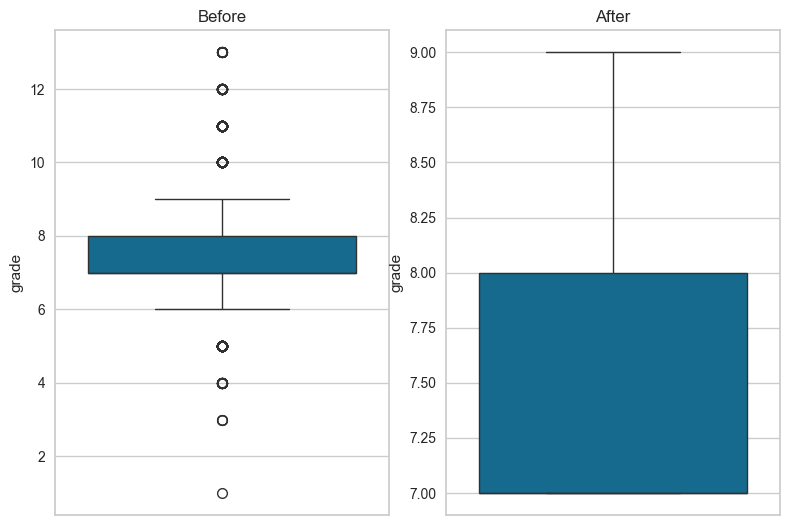

Before removing outliers the shape of sqft_above:(21423, 18)
After removing outliers the shape of sqft_above:(19240, 18)


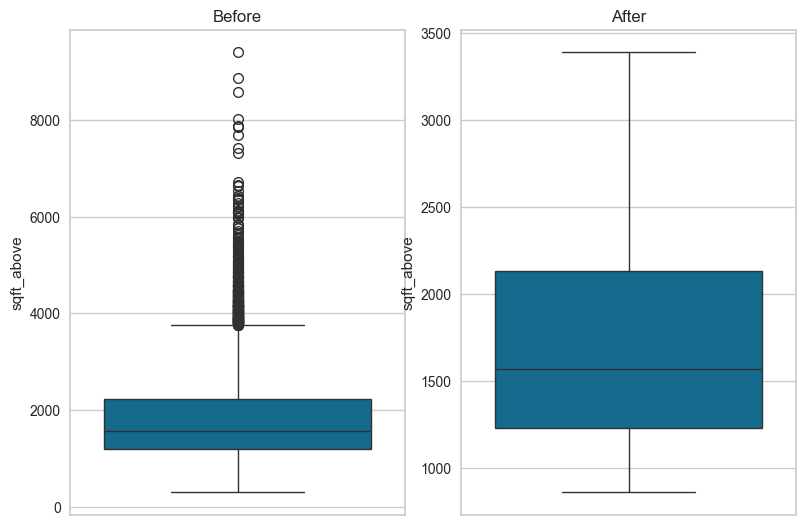

Before removing outliers the shape of sqft_basement:(21423, 18)
After removing outliers the shape of sqft_basement:(7329, 18)


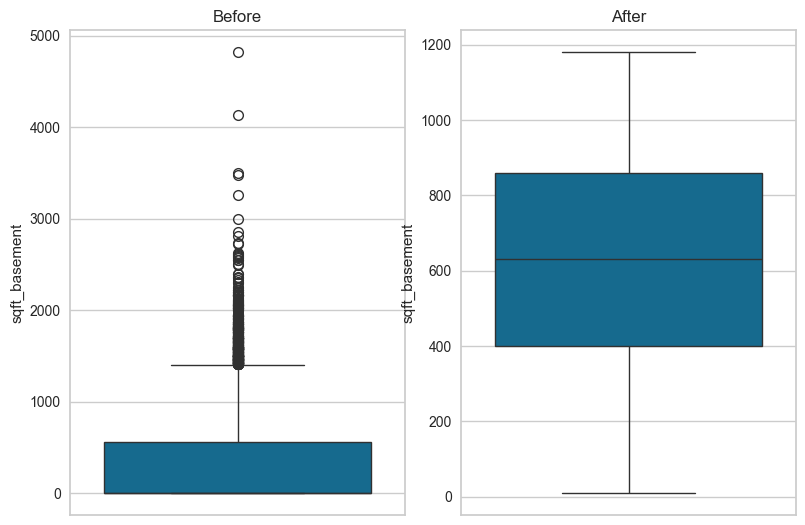

Before removing outliers the shape of yr_built:(21423, 18)
After removing outliers the shape of yr_built:(19237, 18)


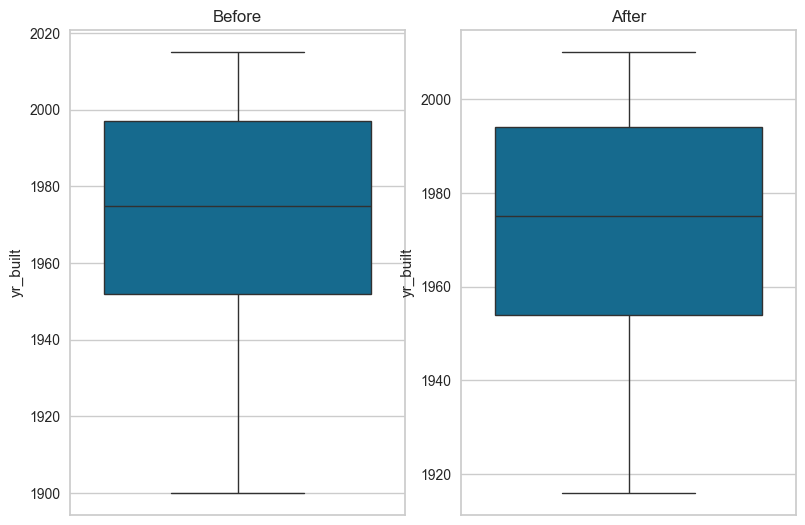

Before removing outliers the shape of zipcode:(21423, 18)
After removing outliers the shape of zipcode:(19038, 18)


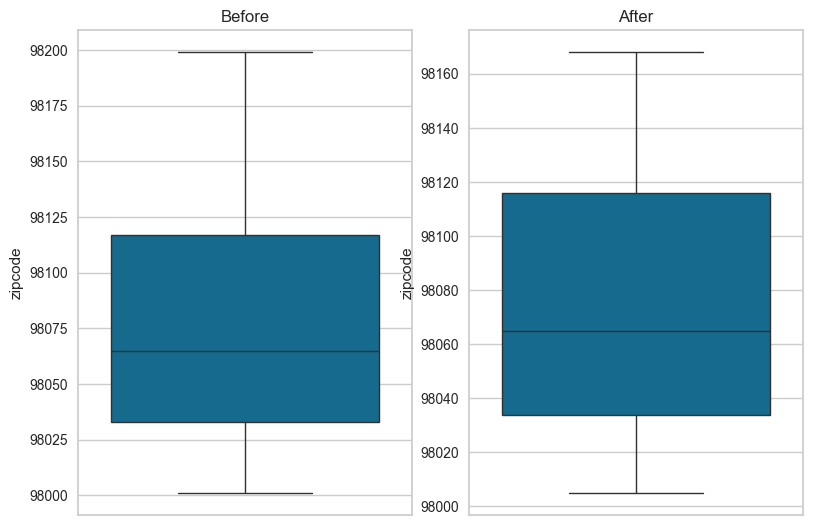

Before removing outliers the shape of lat:(21423, 18)
After removing outliers the shape of lat:(19277, 18)


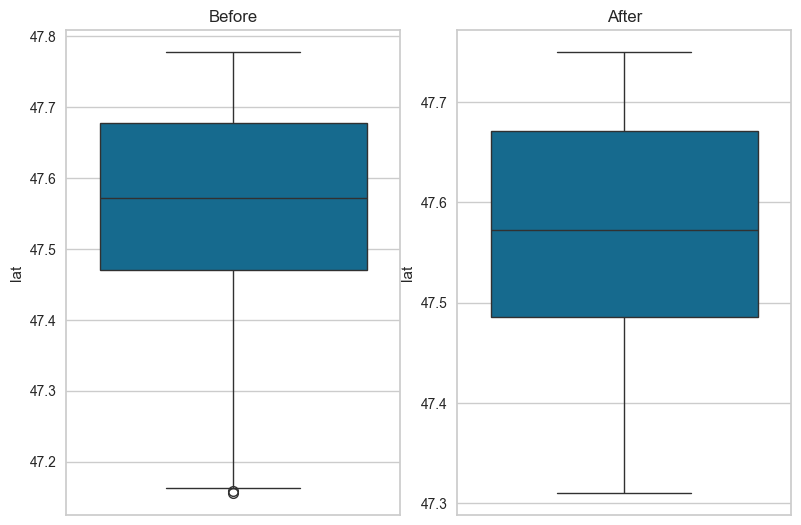

Before removing outliers the shape of long:(21423, 18)
After removing outliers the shape of long:(19217, 18)


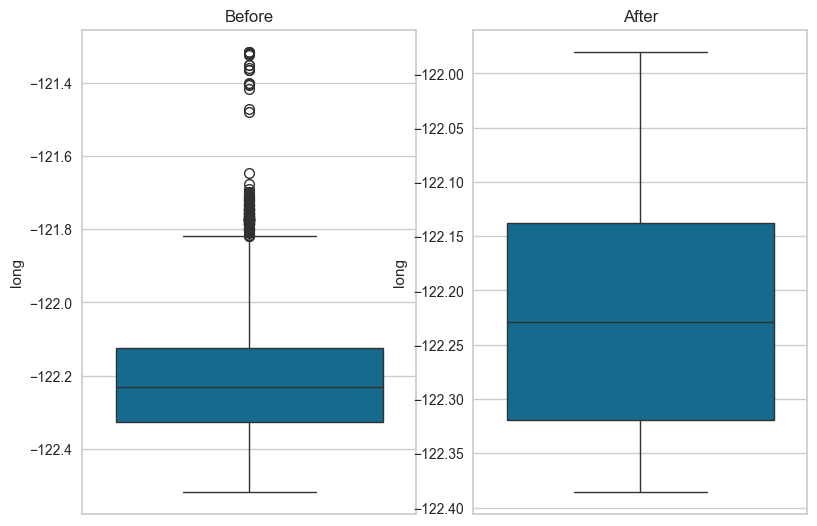

Before removing outliers the shape of sqft_living15:(21423, 18)
After removing outliers the shape of sqft_living15:(19247, 18)


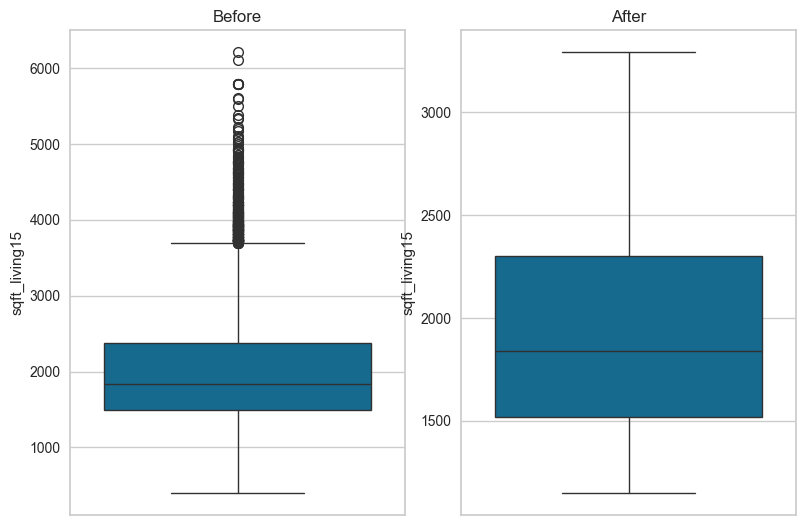

Before removing outliers the shape of sqft_lot15:(21423, 18)
After removing outliers the shape of sqft_lot15:(19279, 18)


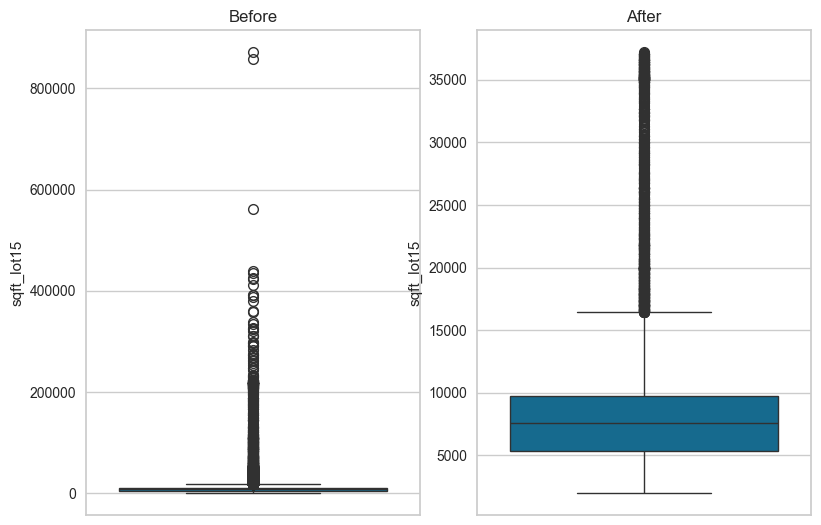

In [17]:
# Handling outliers using the percentile method
# Copy data frame
df3 = df2.copy()

# Get the numerical features
numerical_features = df3.dtypes!=object
numerical_fields =  df3.columns[numerical_features].tolist()

# Remove unwanted fields if they are present
UNWANTED_FIELDS = ['waterfront', 'view']
numerical_fields = [field for field in numerical_fields if field not in UNWANTED_FIELDS]

# Removing outliers using the percentile method
def remove_outliers_using_percentile_method(field):
    fig, axes = plt.subplots(1,2)
    plt.tight_layout()
    print(f'Before removing outliers the shape of {field}:{df2.shape}')
    
    # Max and min percentile
    max_percentile_val = df2[field].quantile(0.95)
    min_percentile_val = df2[field].quantile(0.05)
    
    # Remove the outliers
    df3 = df2[(df2[field] > min_percentile_val) & (df2[field] < max_percentile_val)]
    
    # Visualize
    print(f'After removing outliers the shape of {field}:{df3.shape}')
    sns.boxplot(df2[field], orient='v', ax=axes[0])
    axes[0].title.set_text('Before')
    sns.boxplot(df3[field], orient='v', ax=axes[1])
    axes[1].title.set_text('After')

    # Show plots
    plt.show()

for field in numerical_fields:
    remove_outliers_using_percentile_method(field)

It can be seen that if we use the `Percentile Method` there will be a huge loss in data. Therefore, we need to find an alternative option to handle the outliers. Now, let’s check what kind of results we can get from using the `Inter-quartile Range` method. 

##### <u>Inter-quartile Range Method</u>
The following code snippet is used to get the calculated `Inter-quartile Range` and get the necessary results. Next, let’s check the results we have obtained from the above code snippet.

Before removing outliers the shape of price:(21423, 18)
Q1: 322500.0, Q3: 645000.0
IQR: 322500.0
Lower limit: -161250.0, Upper limit: 1128750.0
After removing outliers the shape of price:(21423, 18)


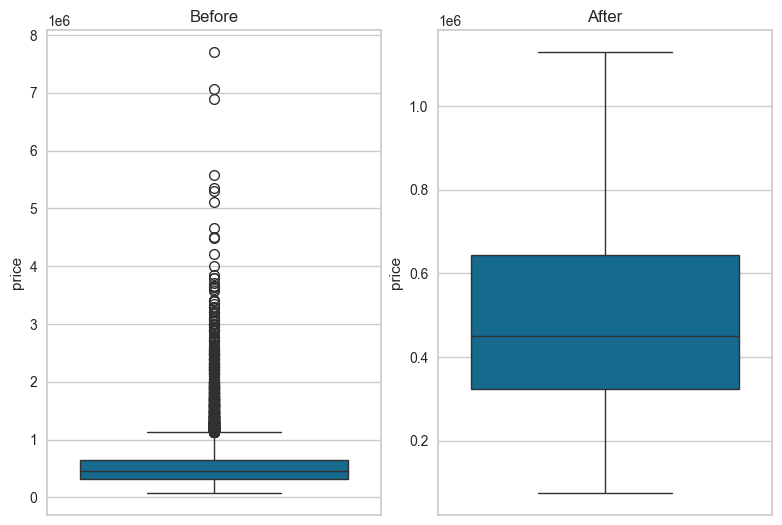

Before removing outliers the shape of bedrooms:(21423, 18)
Q1: 3.0, Q3: 4.0
IQR: 1.0
Lower limit: 1.5, Upper limit: 5.5
After removing outliers the shape of bedrooms:(21423, 18)


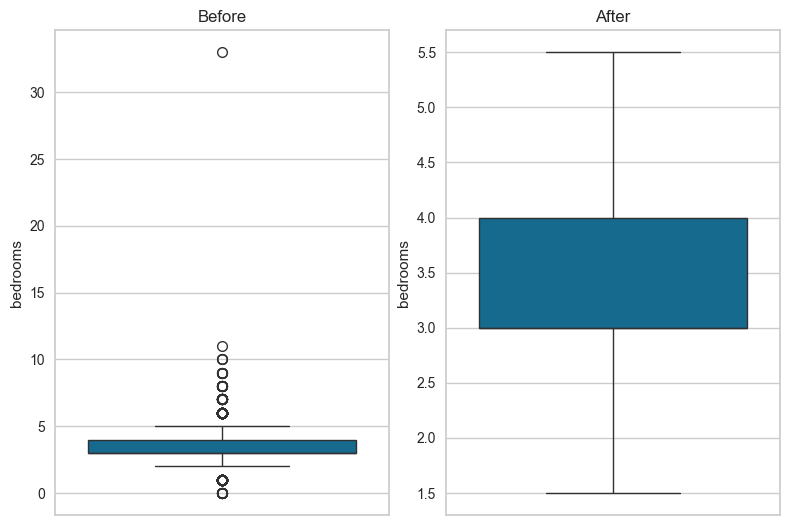

Before removing outliers the shape of bathrooms:(21423, 18)
Q1: 1.75, Q3: 2.5
IQR: 0.75
Lower limit: 0.625, Upper limit: 3.625
After removing outliers the shape of bathrooms:(21423, 18)


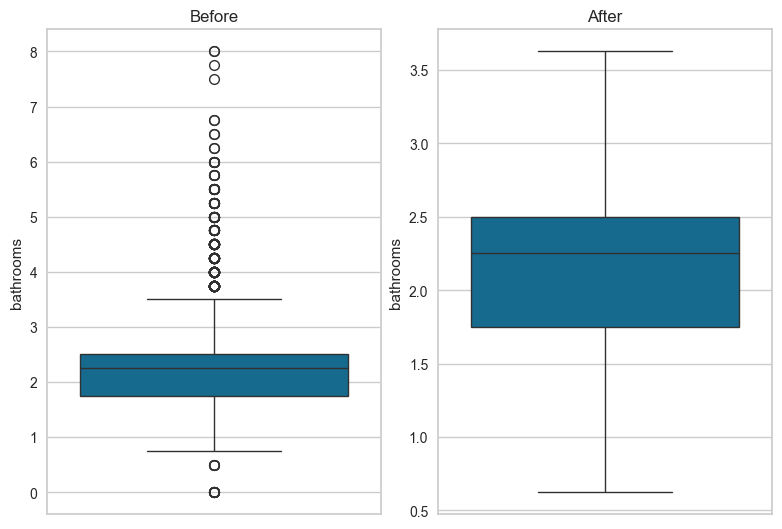

Before removing outliers the shape of sqft_living:(21423, 18)
Q1: 1430.0, Q3: 2550.0
IQR: 1120.0
Lower limit: -250.0, Upper limit: 4230.0
After removing outliers the shape of sqft_living:(21423, 18)


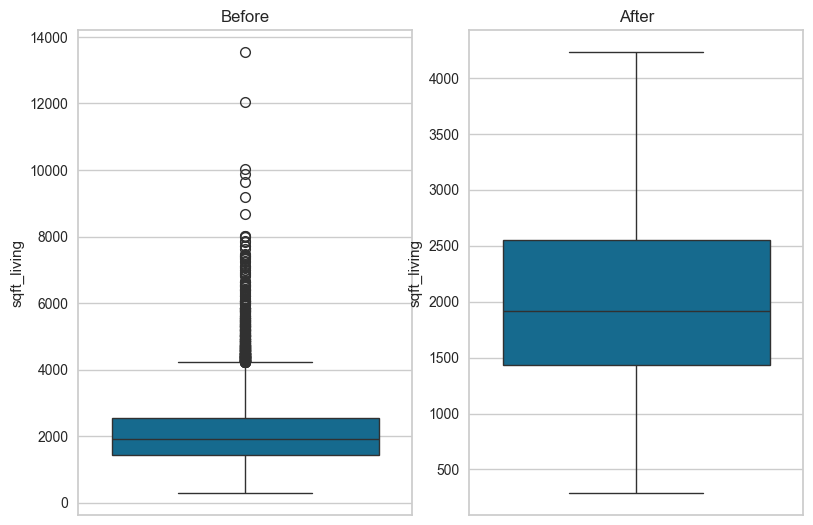

Before removing outliers the shape of sqft_lot:(21423, 18)
Q1: 5040.0, Q3: 10700.5
IQR: 5660.5
Lower limit: -3450.75, Upper limit: 19191.25
After removing outliers the shape of sqft_lot:(21423, 18)


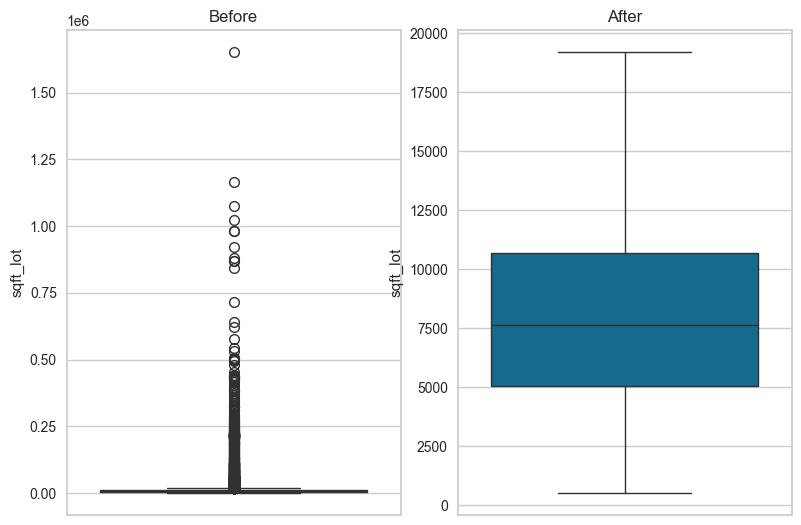

Before removing outliers the shape of floors:(21423, 18)
Q1: 1.0, Q3: 2.0
IQR: 1.0
Lower limit: -0.5, Upper limit: 3.5
After removing outliers the shape of floors:(21423, 18)


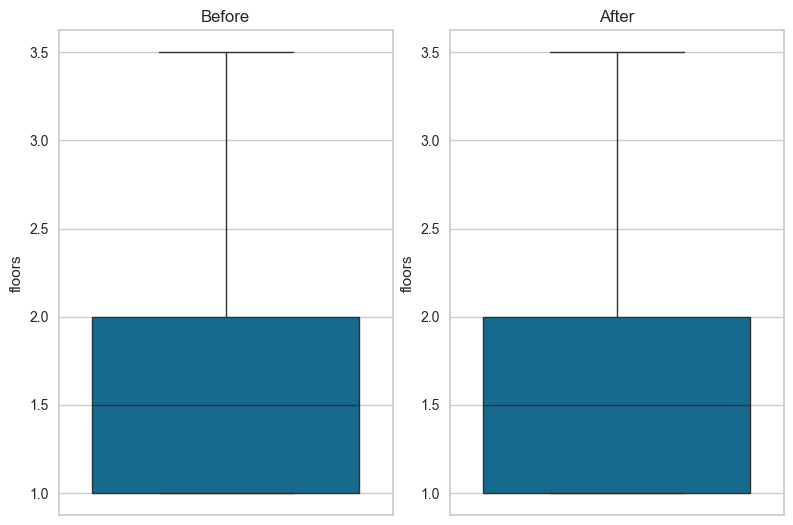

Before removing outliers the shape of condition:(21423, 18)
Q1: 3.0, Q3: 4.0
IQR: 1.0
Lower limit: 1.5, Upper limit: 5.5
After removing outliers the shape of condition:(21423, 18)


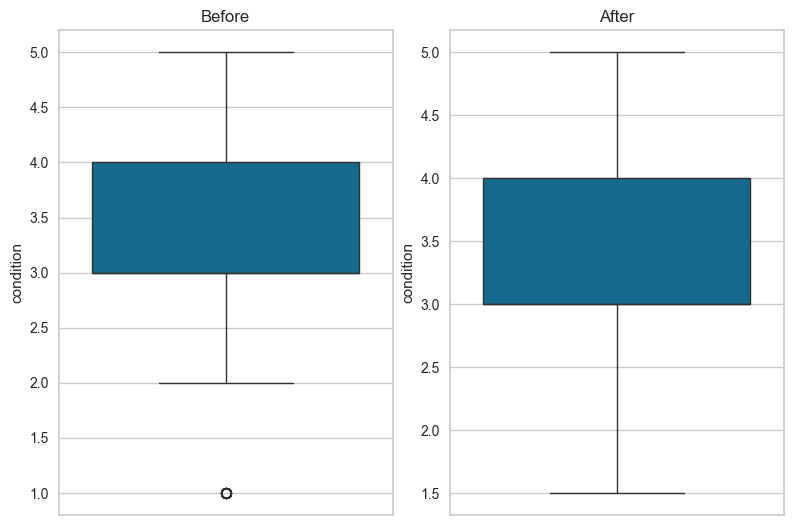

Before removing outliers the shape of grade:(21423, 18)
Q1: 7.0, Q3: 8.0
IQR: 1.0
Lower limit: 5.5, Upper limit: 9.5
After removing outliers the shape of grade:(21423, 18)


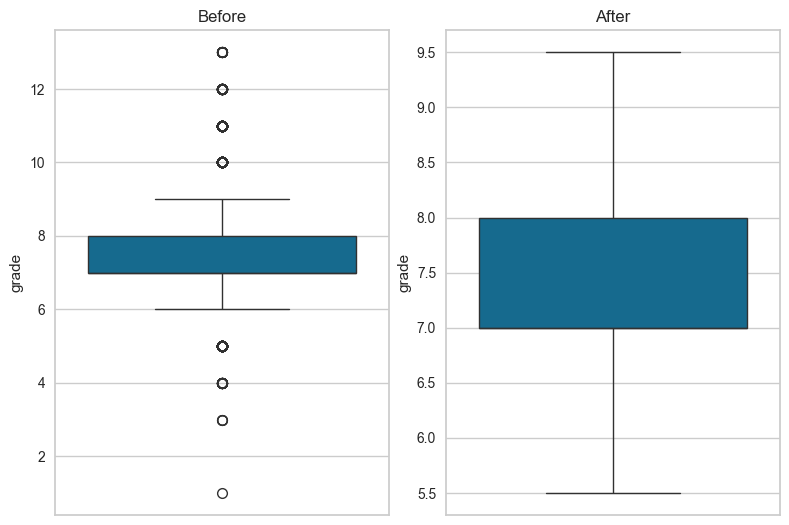

Before removing outliers the shape of sqft_above:(21423, 18)
Q1: 1200.0, Q3: 2220.0
IQR: 1020.0
Lower limit: -330.0, Upper limit: 3750.0
After removing outliers the shape of sqft_above:(21423, 18)


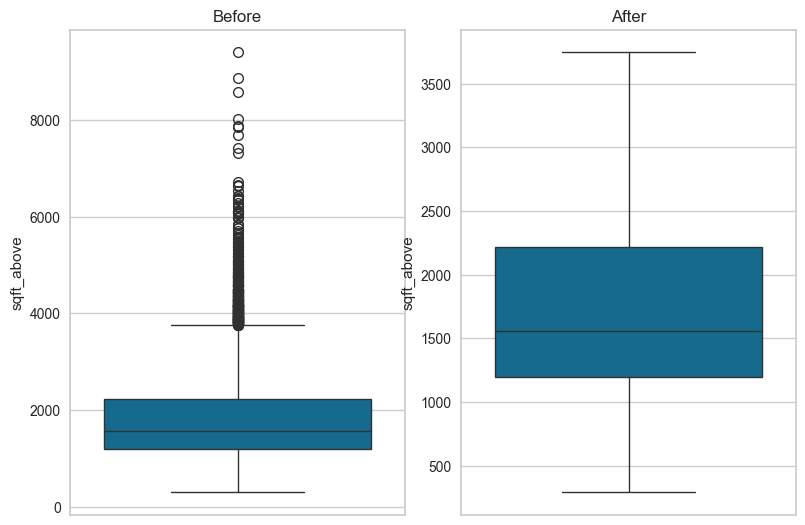

Before removing outliers the shape of sqft_basement:(21423, 18)
Q1: 0.0, Q3: 560.0
IQR: 560.0
Lower limit: -840.0, Upper limit: 1400.0
After removing outliers the shape of sqft_basement:(21423, 18)


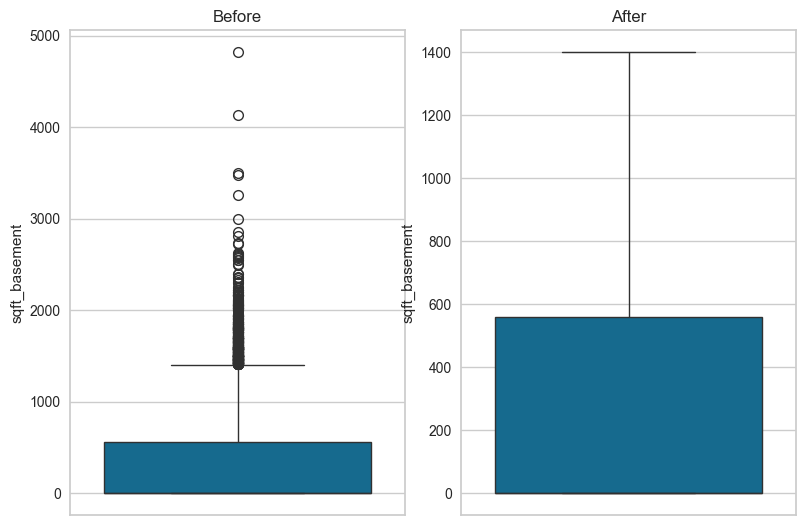

Before removing outliers the shape of yr_built:(21423, 18)
Q1: 1952.0, Q3: 1997.0
IQR: 45.0
Lower limit: 1884.5, Upper limit: 2064.5
After removing outliers the shape of yr_built:(21423, 18)


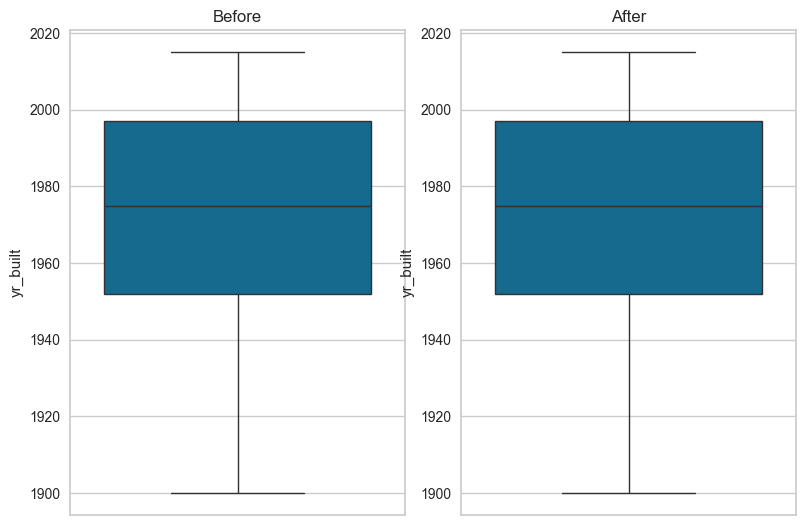

Before removing outliers the shape of zipcode:(21423, 18)
Q1: 98033.0, Q3: 98117.0
IQR: 84.0
Lower limit: 97907.0, Upper limit: 98243.0
After removing outliers the shape of zipcode:(21423, 18)


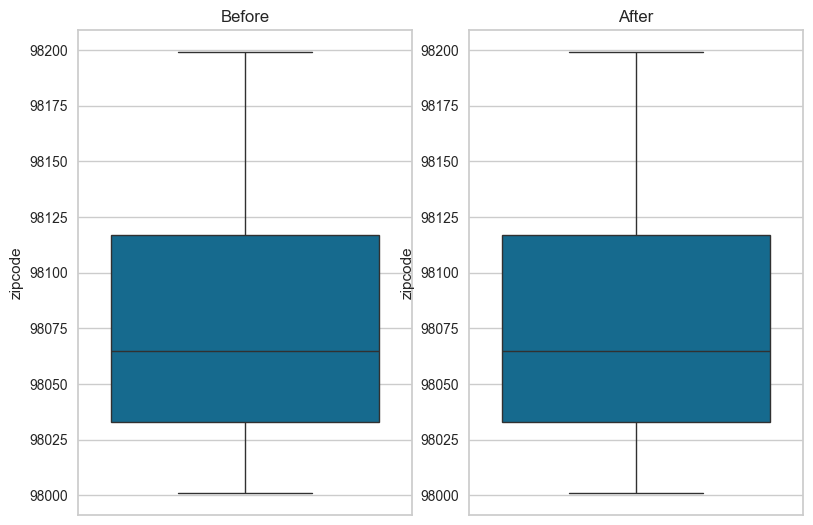

Before removing outliers the shape of lat:(21423, 18)
Q1: 47.4711, Q3: 47.67805
IQR: 0.20694999999999908
Lower limit: 47.160675, Upper limit: 47.988474999999994
After removing outliers the shape of lat:(21423, 18)


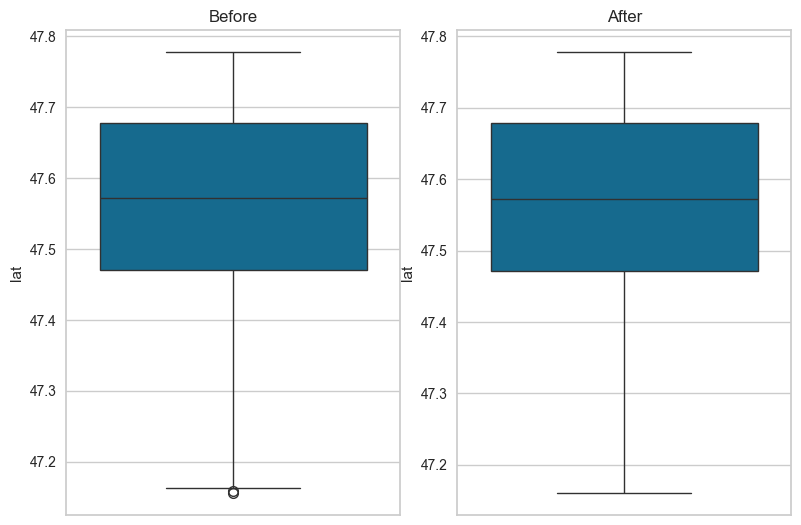

Before removing outliers the shape of long:(21423, 18)
Q1: -122.328, Q3: -122.1245
IQR: 0.20350000000000534
Lower limit: -122.63325, Upper limit: -121.81924999999998
After removing outliers the shape of long:(21423, 18)


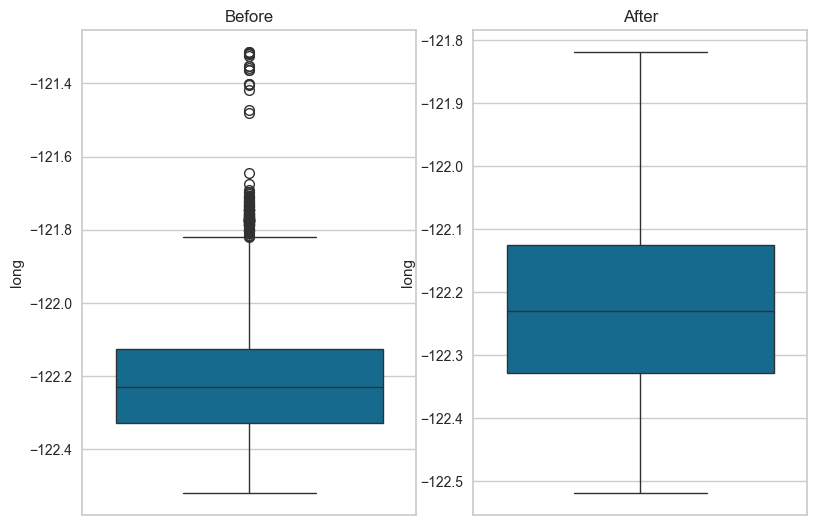

Before removing outliers the shape of sqft_living15:(21423, 18)
Q1: 1490.0, Q3: 2370.0
IQR: 880.0
Lower limit: 170.0, Upper limit: 3690.0
After removing outliers the shape of sqft_living15:(21423, 18)


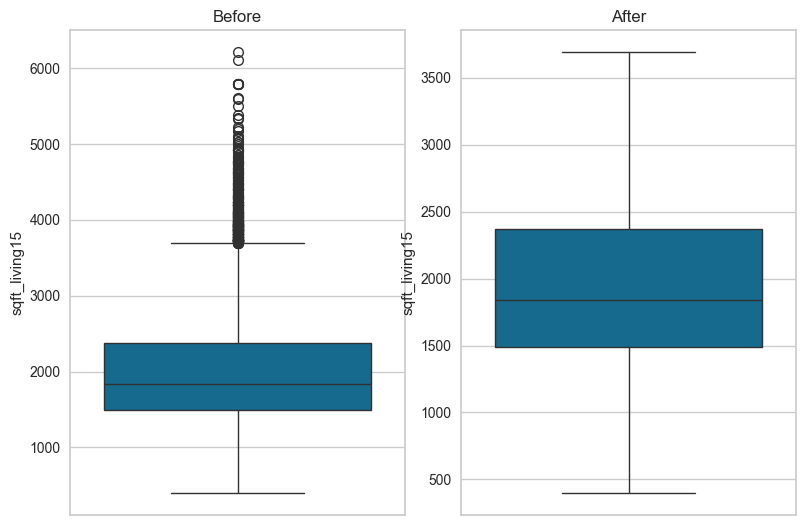

Before removing outliers the shape of sqft_lot15:(21423, 18)
Q1: 5100.0, Q3: 10089.5
IQR: 4989.5
Lower limit: -2384.25, Upper limit: 17573.75
After removing outliers the shape of sqft_lot15:(21423, 18)


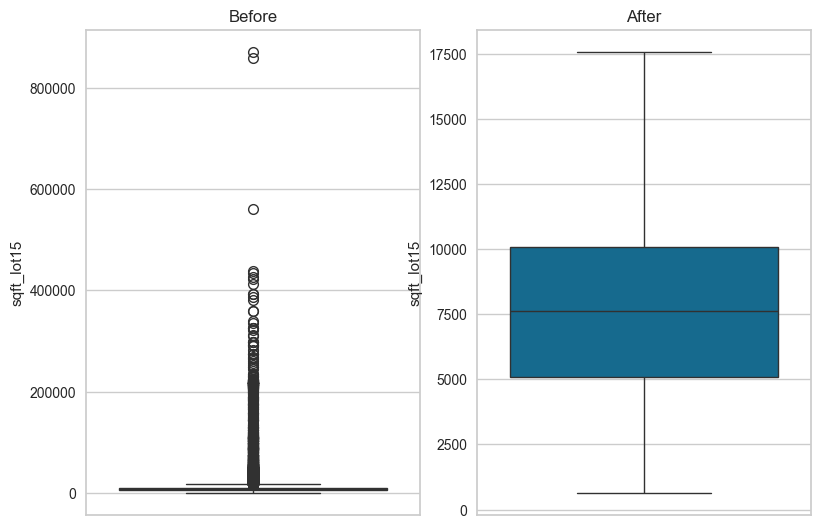

In [18]:
# Handling outliers using the IQR method
# Copy data frame
df4= df2.copy()

# Removing outliers using the IQR method
def remove_outliers_using_iqr_method(field):
    fig, axes = plt.subplots(1,2)
    plt.tight_layout()
    print(f'Before removing outliers the shape of {field}:{df2.shape}')
    sns.boxplot(df2[field], orient='v', ax=axes[0])
    axes[0].title.set_text('Before')

    # Calculating the IQR
    q1 = df2[field].quantile(0.25)
    q3 = df2[field].quantile(0.75)
    print(f'Q1: {q1}, Q3: {q3}')
    iqr = q3 - q1
    print(f'IQR: {iqr}')
    lower_limit = q1 - 1.5 * iqr
    upper_limit = q3 + 1.5 * iqr
    print(f'Lower limit: {lower_limit}, Upper limit: {upper_limit}')
    df4[field] = np.where(df4[field] > upper_limit, upper_limit, df4[field])
    df4[field] = np.where(df4[field] < lower_limit, lower_limit, df4[field])
    print(f'After removing outliers the shape of {field}:{df4.shape}')
    sns.boxplot(df4[field], orient='v', ax=axes[1])
    axes[1].title.set_text('After')

    # Show plots
    plt.show()

for field in numerical_fields:
    remove_outliers_using_iqr_method(field)

Comparing the graphs produced by the two methods, you can observe that using the IQR method is better than using the percentile method for the outliers.

### 1.2.2 Producing Q-Q Plots, Histograms, and Applying Necessary Transformations

First, we need to produce Q-Q plots and histograms to check whether the data distribution in the dataset is normal or not.

#### Step 1 - Q-Q Plots
Q-Q(Quantile-Quantile) plots are typically used to assess whether a given dataset follows a particular distribution or not. It usually checks whether a dataset follows a normal(Gaussian) distribution and based on the exploratory data extracted from it, we can transform the data and normalize the dataset for more accurate results.
The following code snippet is used to make Q-Q plots for the dataset.

Before checking the skewness or the distribution, first take the target value(`price`) of our dataset to another data frame. Also, take out the `waterfront` and `view` values to a separate data frame since they are labeled 0 and 1.

In [19]:
# Before checking skewness or the distribution, let's get the target value to one data frame and the other variables to another data frame.
target_frame = df4['price']
target_frame = target_frame.to_frame()

# Check target values
target_frame.head()

,price
0,221900.0
1,538000.0
2,180000.0
3,604000.0
4,510000.0


In [20]:
# Get info about the dataframe
target_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21423 entries, 0 to 21422
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   price   21423 non-null  float64
dtypes: float64(1)
memory usage: 167.5 KB


In [21]:
# We need to add the waterfront and view data to a separate data frame since they are labels for boolean values true and false.
label_frame = df4[['waterfront','view']]

# Check the label_frame to view the waterfront and view values
label_frame.head()

,waterfront,view
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [22]:
label_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21423 entries, 0 to 21422
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   waterfront  21423 non-null  int64
 1   view        21423 non-null  int64
dtypes: int64(2)
memory usage: 334.9 KB


In [23]:
# Drop the target, waterfront and view columns and use the other data for q-q plots, histograms
df4 = df4.drop(columns=['price','waterfront','view'], axis=1)

# Check data frame values
df4.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,3.0,1.00,1180.0,5650.0,1.0,3.0,7.0,1180.0,0.0,1955.0,98178.0,47.5112,-122.257,1340.0,5650.0
1,3.0,2.25,2570.0,7242.0,2.0,3.0,7.0,2170.0,400.0,1951.0,98125.0,47.7210,-122.319,1690.0,7639.0
2,2.0,1.00,770.0,10000.0,1.0,3.0,6.0,770.0,0.0,1933.0,98028.0,47.7379,-122.233,2720.0,8062.0
3,4.0,3.00,1960.0,5000.0,1.0,5.0,7.0,1050.0,910.0,1965.0,98136.0,47.5208,-122.393,1360.0,5000.0
4,3.0,2.00,1680.0,8080.0,1.0,3.0,8.0,1680.0,0.0,1987.0,98074.0,47.6168,-122.045,1800.0,7503.0


In [24]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21423 entries, 0 to 21422
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       21423 non-null  float64
 1   bathrooms      21423 non-null  float64
 2   sqft_living    21423 non-null  float64
 3   sqft_lot       21423 non-null  float64
 4   floors         21423 non-null  float64
 5   condition      21423 non-null  float64
 6   grade          21423 non-null  float64
 7   sqft_above     21423 non-null  float64
 8   sqft_basement  21423 non-null  float64
 9   yr_built       21423 non-null  float64
 10  zipcode        21423 non-null  float64
 11  lat            21423 non-null  float64
 12  long           21423 non-null  float64
 13  sqft_living15  21423 non-null  float64
 14  sqft_lot15     21423 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


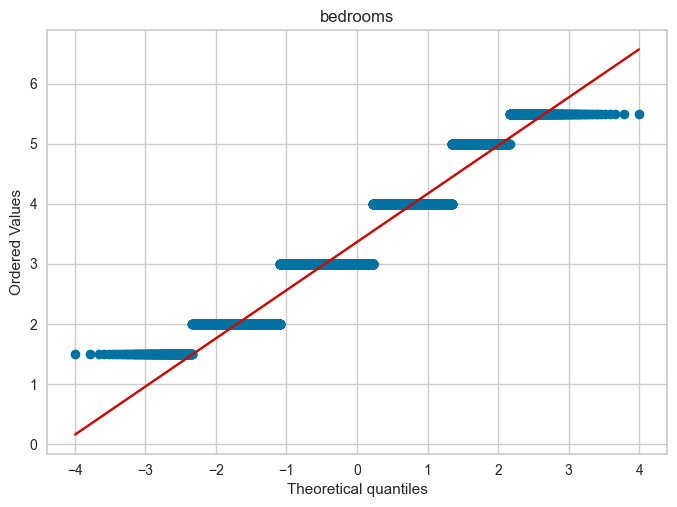

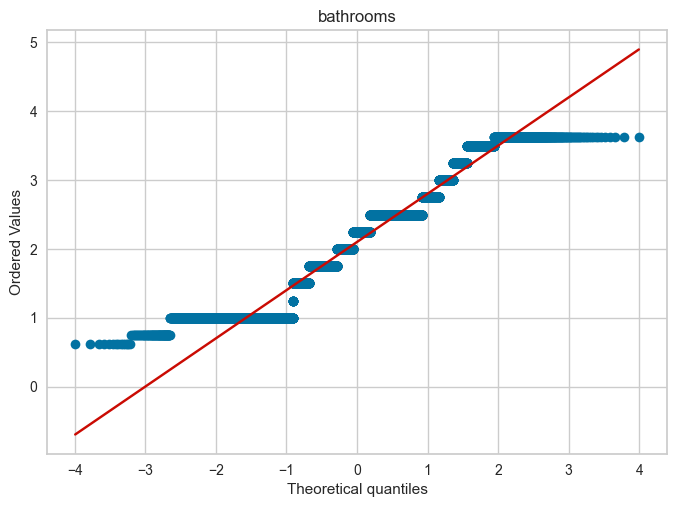

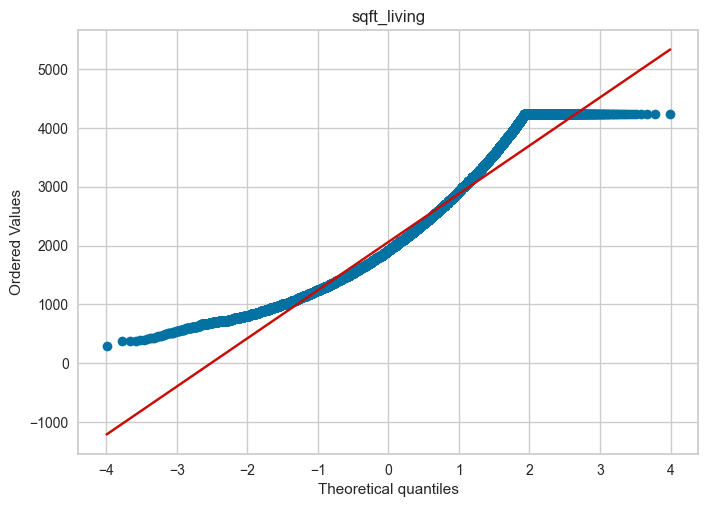

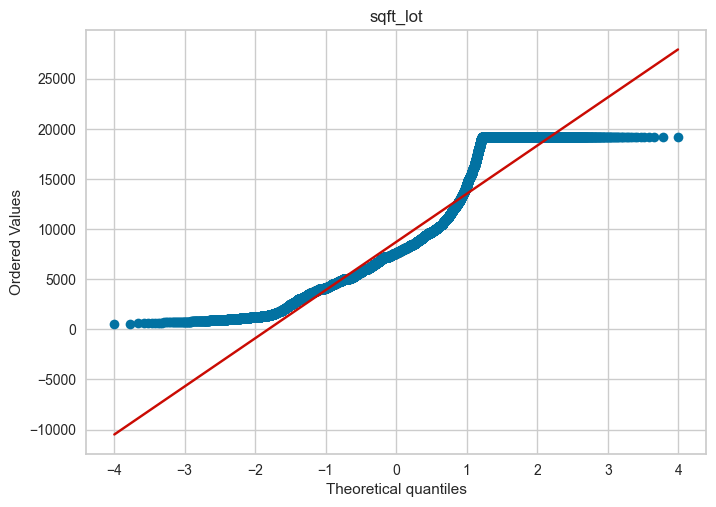

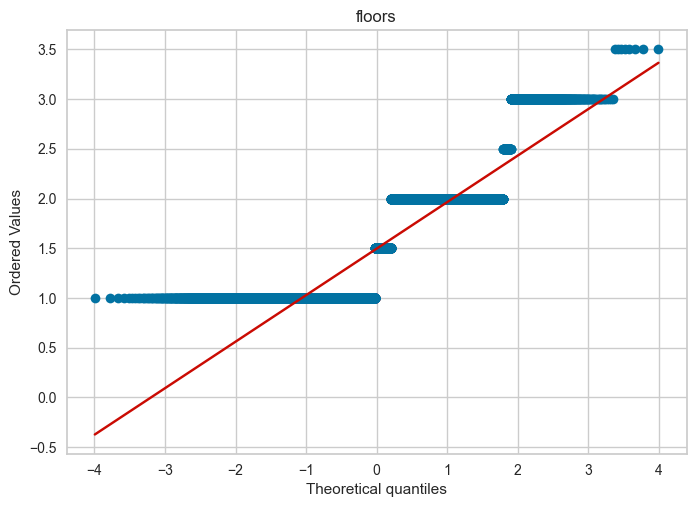

...

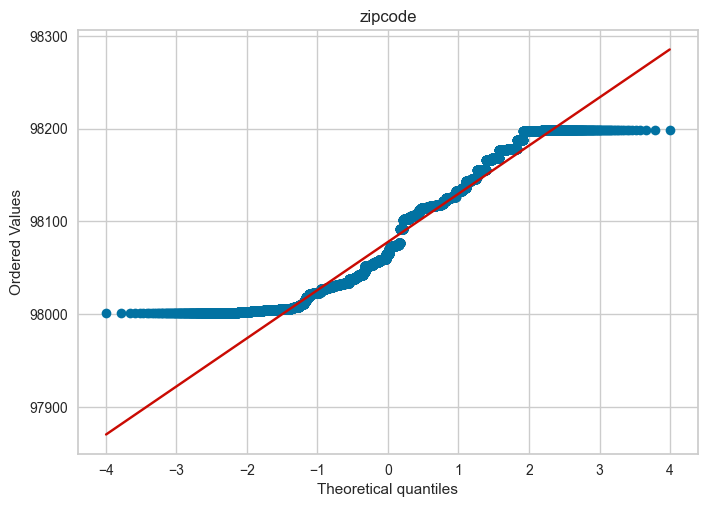

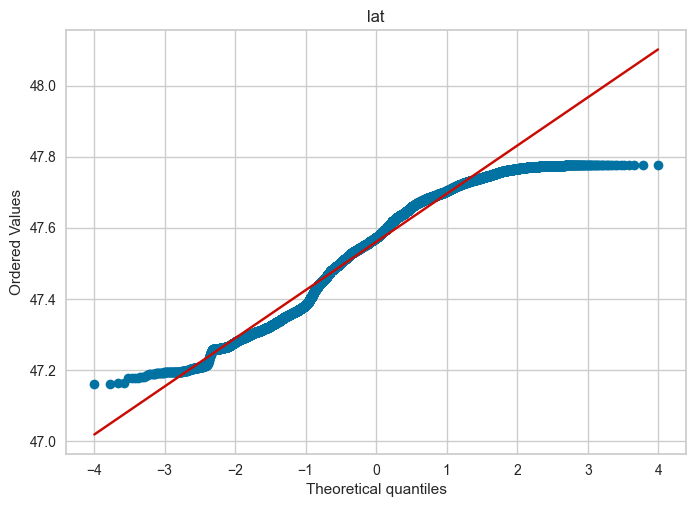

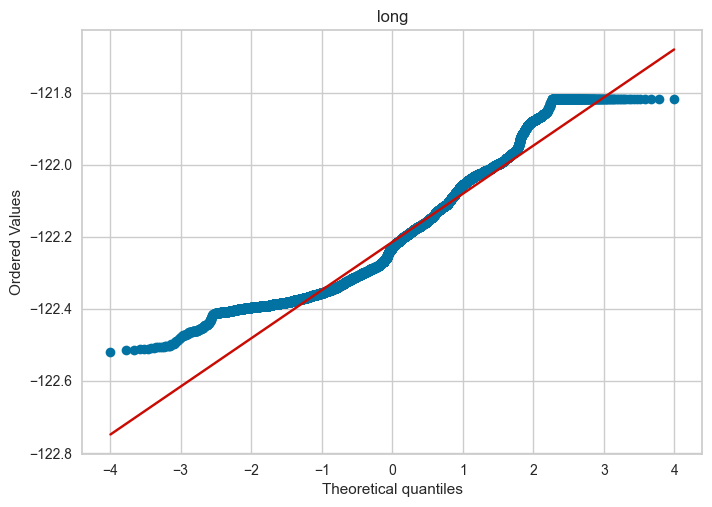

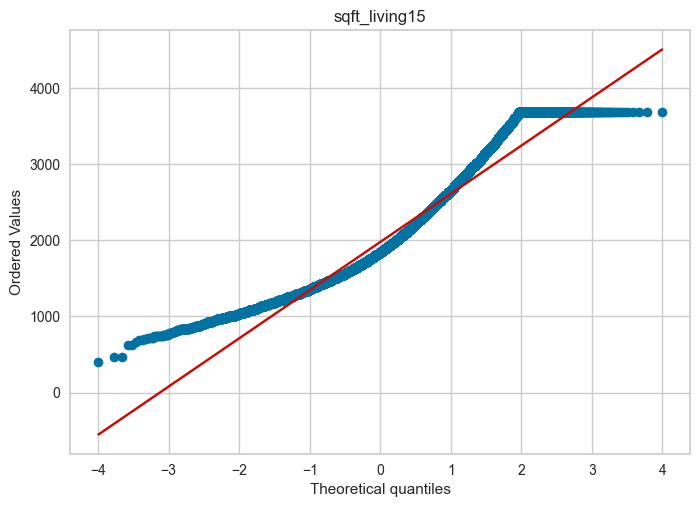

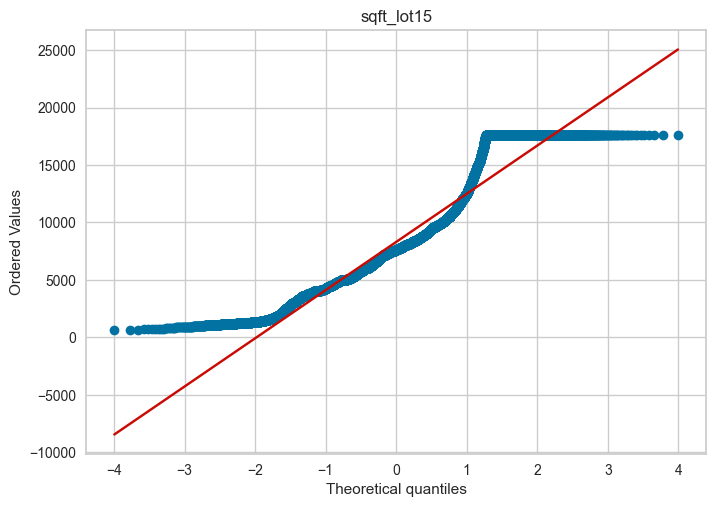

In [25]:
# We are using the dataset where we don't have any outliers
def draw_qq_plot(dataFrame,field):
    # create and show the plow
    stats.probplot(dataFrame[field], dist="norm", plot=plt)
    plt.title(field)
    plt.show()

# Drop price from numerical_fields and create a new variable to be used for q-q plots and histograms
numerical_fields_updated = [item for item in numerical_fields if item != 'price']

# Draw q-q plots
for field in numerical_fields_updated:
    draw_qq_plot(df4, field)

As you can see most of the Q-Q plot data are above the 45-degree line, which indicates that there is normal distribution in the dataset. Now, let’s check the histograms to see whether there are any skewed columns in the dataset.

#### Step 2 - Histograms
Histograms allow us to check the data distribution. And using them we can find out whether a dataset is right-skewed or left-skewed.
The following code is used to plot the histograms.

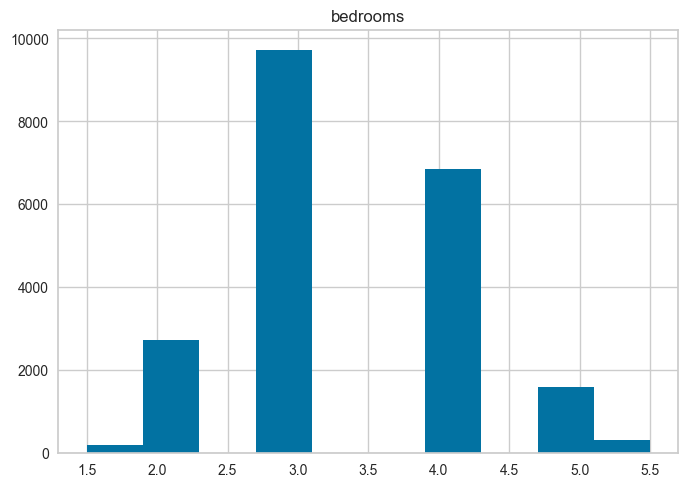

<Figure size 800x550 with 0 Axes>

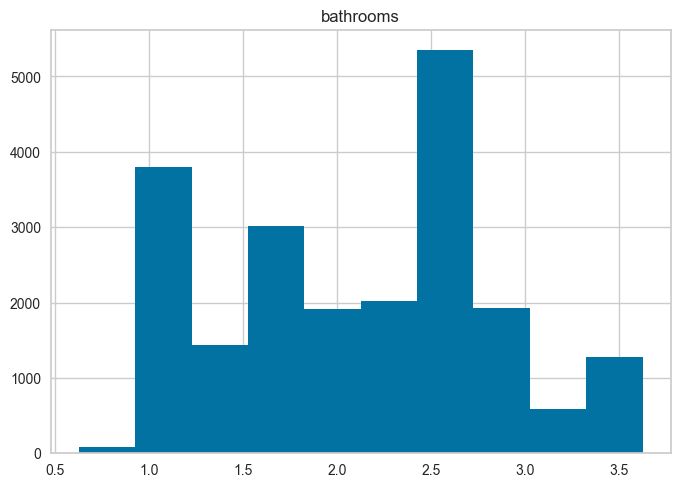

<Figure size 800x550 with 0 Axes>

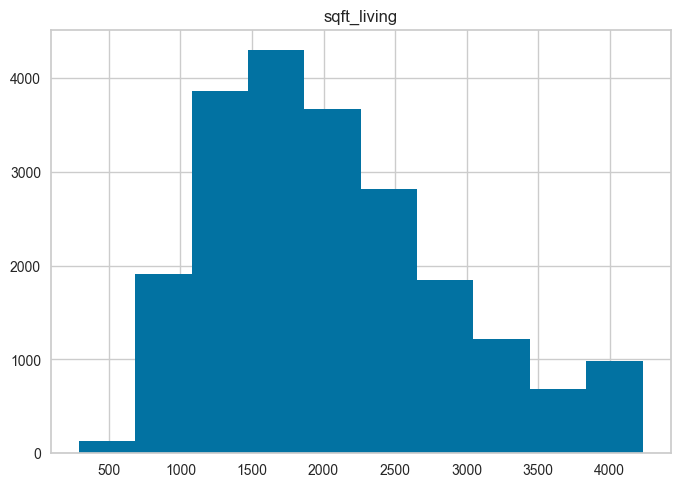

<Figure size 800x550 with 0 Axes>

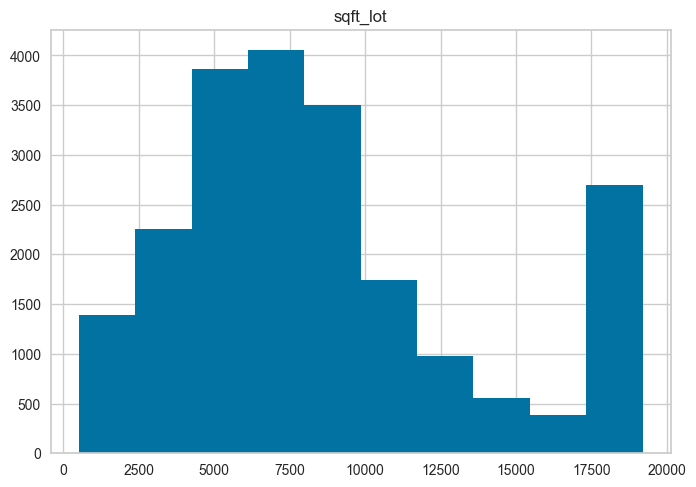

<Figure size 800x550 with 0 Axes>

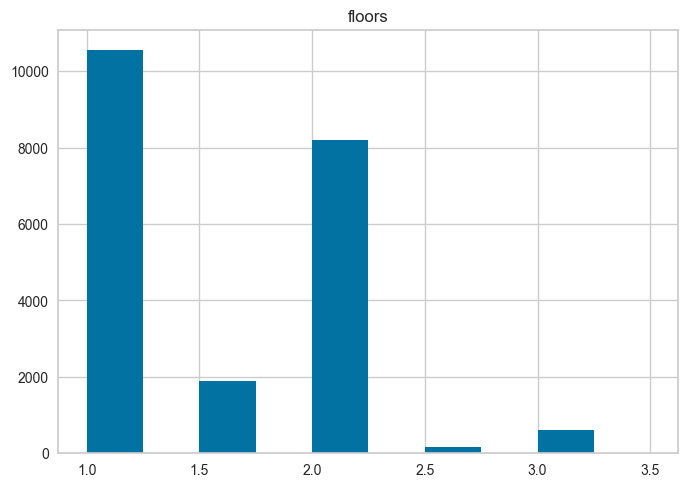

<Figure size 800x550 with 0 Axes>

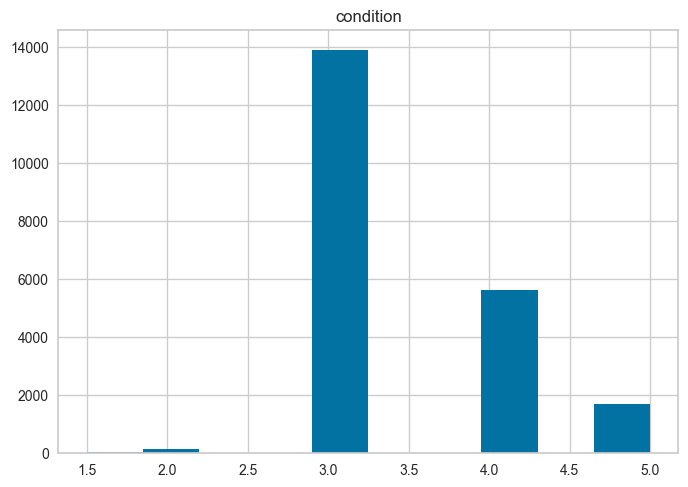

<Figure size 800x550 with 0 Axes>

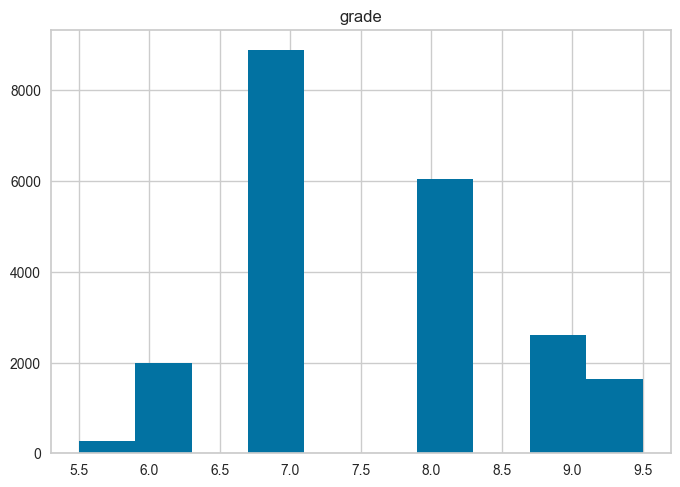

<Figure size 800x550 with 0 Axes>

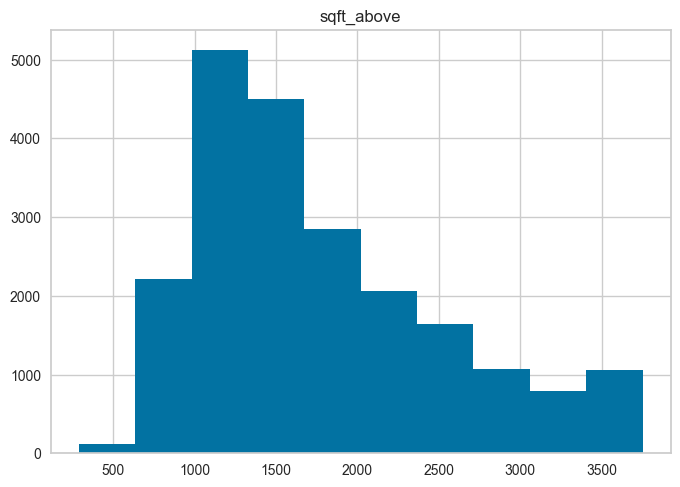

<Figure size 800x550 with 0 Axes>

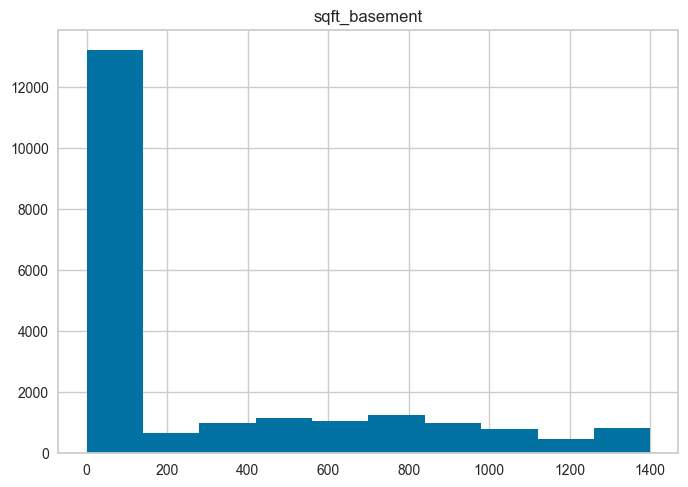

<Figure size 800x550 with 0 Axes>

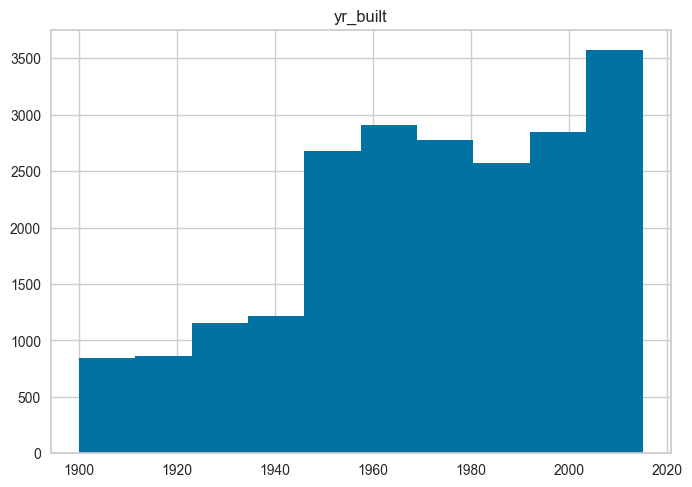

<Figure size 800x550 with 0 Axes>

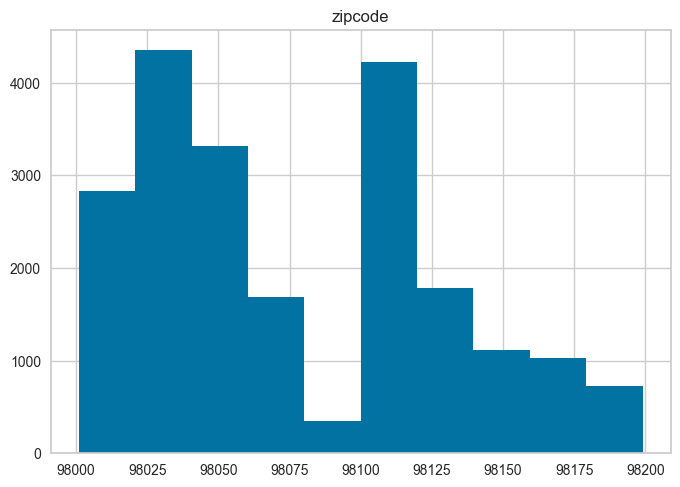

<Figure size 800x550 with 0 Axes>

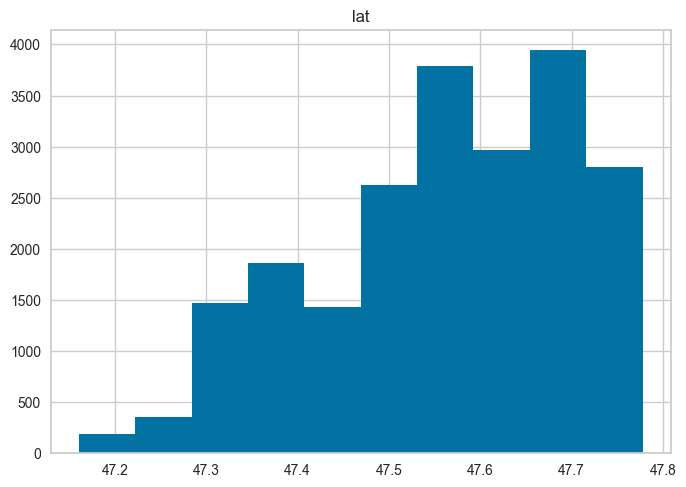

<Figure size 800x550 with 0 Axes>

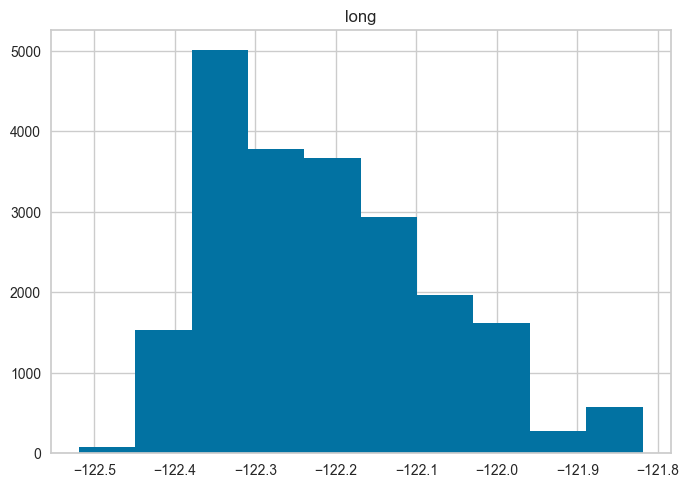

<Figure size 800x550 with 0 Axes>

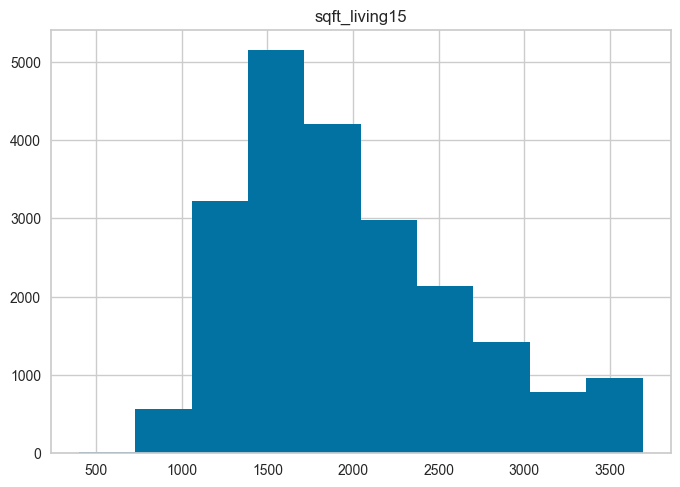

<Figure size 800x550 with 0 Axes>

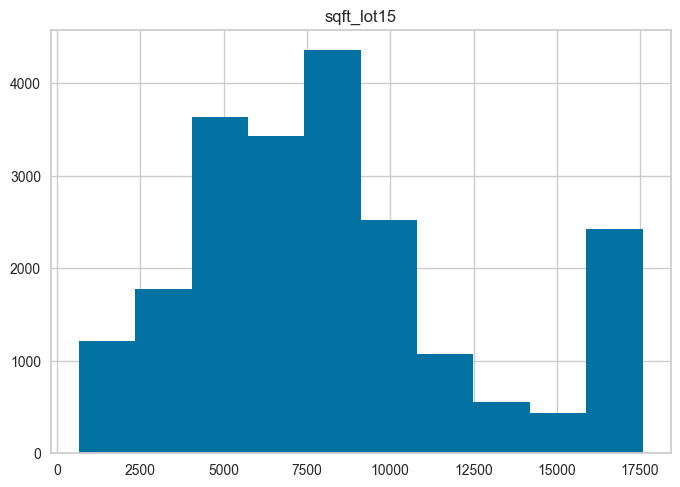

<Figure size 800x550 with 0 Axes>

In [26]:
# Generate histograms for the numerical fields
def draw_histogram(df, field):
    plt.hist(df[field], color='b')
    plt.title(field)
    plt.figure()
    plt.show()

# Draw histograms
for field in numerical_fields_updated:
    draw_histogram(df4, field)

Since it is hard to understand whether there is a skew or not in the dataset, we can use the `histplot()` function in the `Yellowbrick` library. 

#### Step 3 - Histplots
The function to get histplots is shown below.

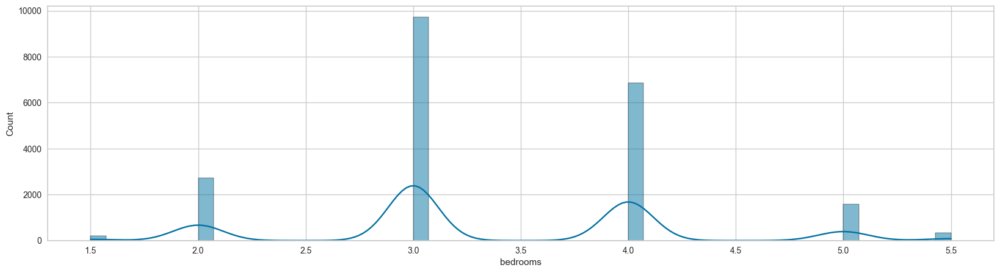

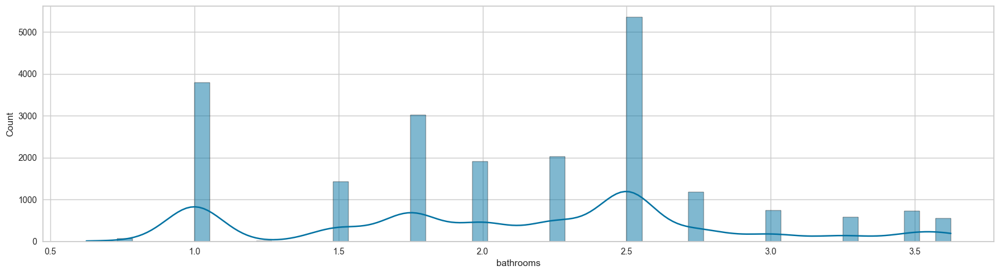

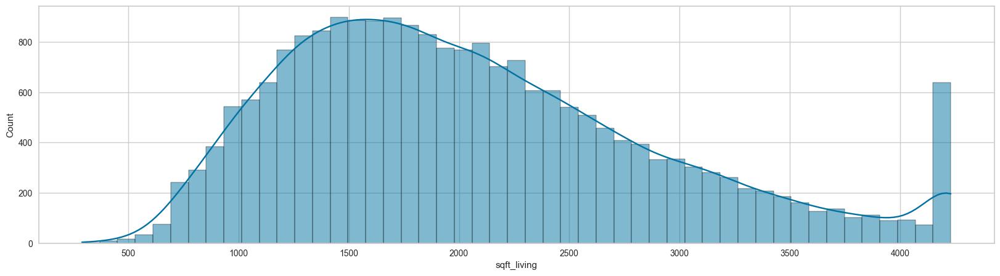

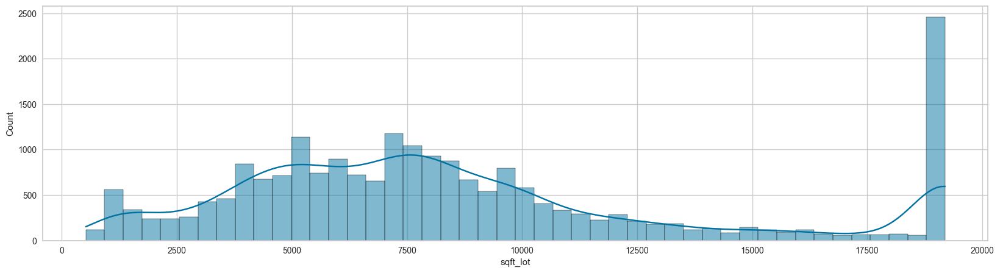

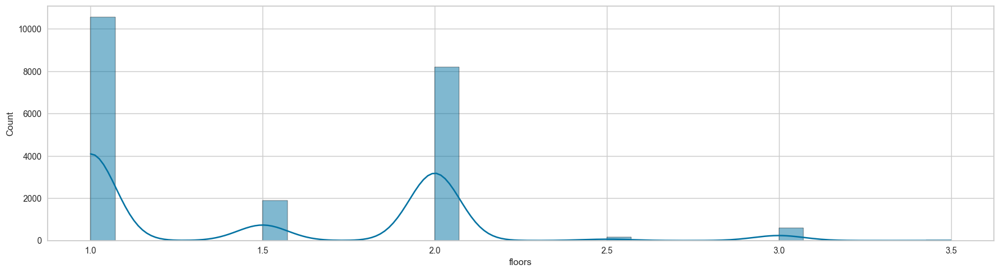

...

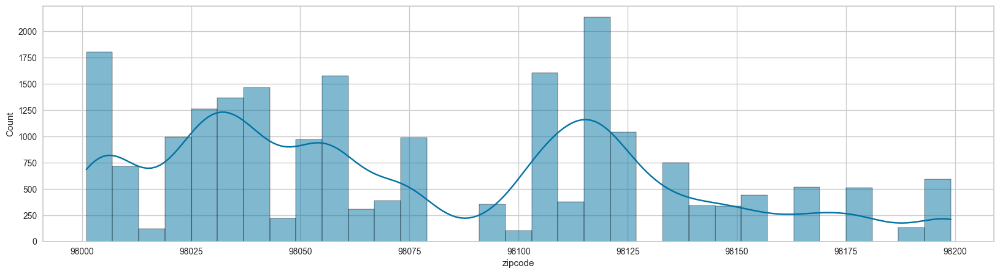

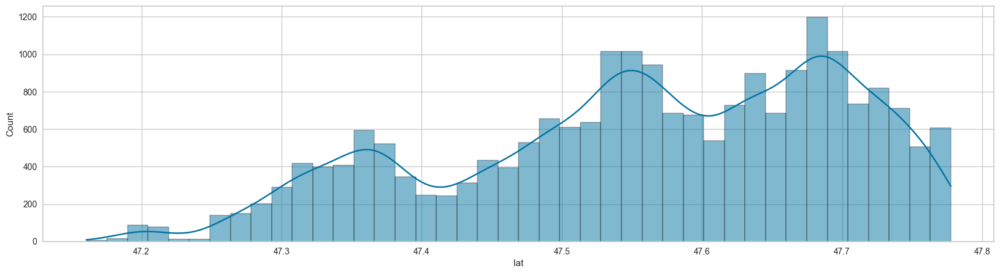

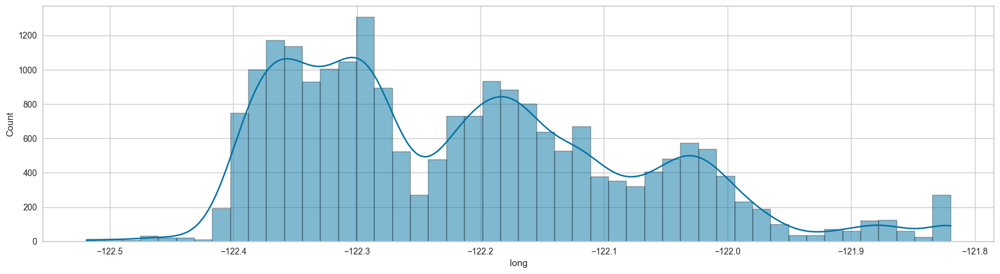

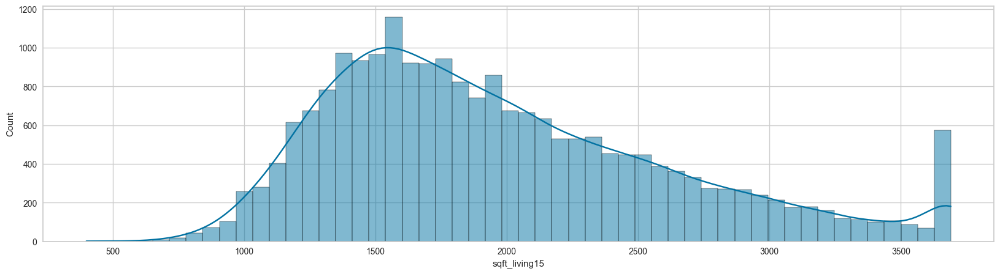

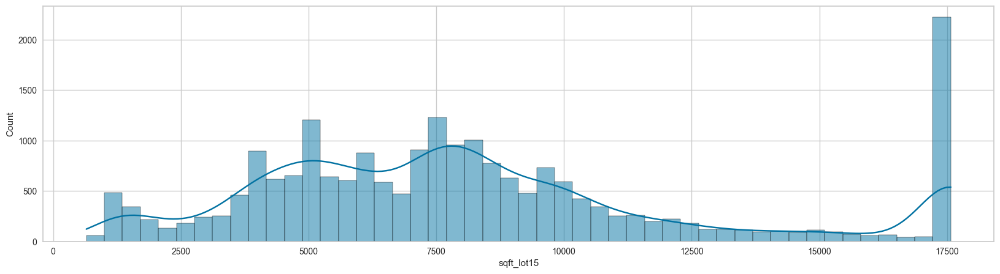

In [27]:
# Generate histplot to analyze more closely
def draw_histplots(df, field):
    plt.figure(figsize=(20,5))
    sns.histplot(df[field], kde=True)
    plt.show()

# Draw distplots
for field in numerical_fields_updated:
    draw_histplots(df4, field)

Based on the graphs we can notice that there are right-skewed and left-skewed data.\
**• Right-skewed data** → `sqft_living`, `sqft_lot`, `sqft_above`, `zipcode`, `long`, `sqft_living15`, `sqft_lot15`\
**• Left-skewed data** →  `yr_built`, `lat`

#### Step 4 - Applying Transformations

The following techniques are used to address the skewed data. 
1. Right Skewed Data →\
(a) Logarithmic Transformation\
(b) Square-root Transformation
3. Left Skewed Data →\
(a) Exponential Transformation
<span style='background-color: #FFADB0;'>The `Logarithmic Transformation` cannot be used with 0 and negative values.</span> Therefore, to address those values we can use the `Square-root Transformation` with a little tweak as shown below.

```python
FunctionTransformer(lambda x:np.sqrt(abs(x)), validate=True)
```

The following code explains how you can transform the necessary data.

In [28]:
# Columns identified via histograms
right_skewed = ['sqft_living', 'sqft_lot','sqft_above', 'zipcode', 'long', 'sqft_living15', 'sqft_lot15']
left_skewed = ['yr_built', 'lat']

additional_columns = ['bedrooms','bathrooms','condition','grade', 'sqft_basement', 'floors']

# Combine them and create a new list
identified_columns = right_skewed + left_skewed

In [29]:
# Copy the data frame
data = df4.copy()

# Create a function transformer object with square root transformation for right-skewed data
# We are using the square-root transformer here because the negative values cannot be calculated with np.log and for 0 it gives inf.
# Since long(longitude) values are negative in King County, we have to use the abs() function to transform them into positive values.
# If we want to use them with the square-root transformer.
square_root_transformer = FunctionTransformer(lambda x: np.sqrt(abs(x)), validate=True)

# Create a function transformer object with exponential/power transformation for left-skewed data
exponential_transformer = FunctionTransformer(lambda x: x ** 3, validate=True)

# Apply the transformations
data_new1 = square_root_transformer.transform(data[right_skewed])
data_new2 = exponential_transformer.transform(data[left_skewed])

# Create new data frames
df5_temp1 = pd.DataFrame(data_new1, columns=right_skewed)
df5_temp2 = pd.DataFrame(data_new2, columns=left_skewed)
df5_temp3 = df4[additional_columns]

# Concatenate the data frames
df5 = pd.concat([df5_temp1, df5_temp2, df5_temp3], join='outer', axis=1)
df5.head()

,sqft_living,sqft_lot,sqft_above,zipcode,long,sqft_living15,sqft_lot15,yr_built,lat,bedrooms,bathrooms,condition,grade,sqft_basement,floors
0,34.351128,75.166482,34.351128,313.333688,11.056989,36.606010,75.166482,7.472059e+09,107247.702877,3.0,1.00,3.0,7.0,0.0,1.0
1,50.695167,85.099941,46.583259,313.249102,11.059792,41.109610,87.401373,7.426288e+09,108674.739386,3.0,2.25,3.0,7.0,400.0,2.0
2,27.748874,100.000000,27.748874,313.094235,11.055903,52.153619,89.788641,7.222633e+09,108790.239078,2.0,1.00,3.0,6.0,0.0,1.0
3,44.271887,70.710678,32.403703,313.266660,11.063137,36.878178,70.710678,7.587307e+09,107312.726660,4.0,3.00,5.0,7.0,910.0,1.0
4,40.987803,89.888820,40.987803,313.167687,11.047398,42.426407,86.619859,7.845012e+09,107964.410613,3.0,2.00,3.0,8.0,0.0,1.0


#### Step 5 - Verifying

Let’s check the Q-Q plots again to see if the transformation applied properly for the transformed columns.

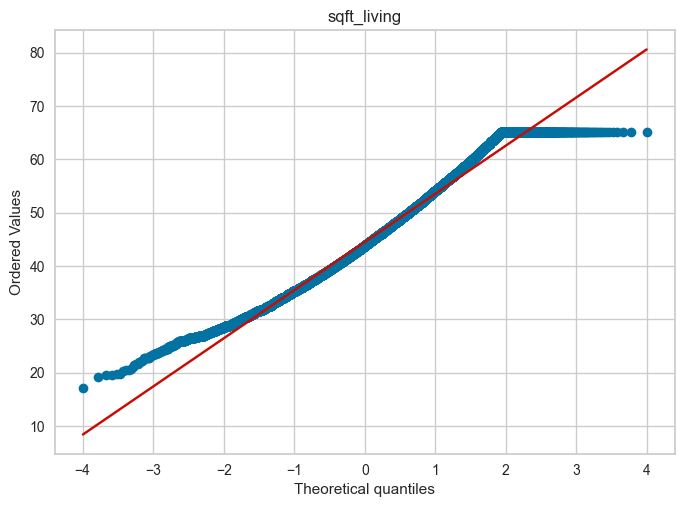

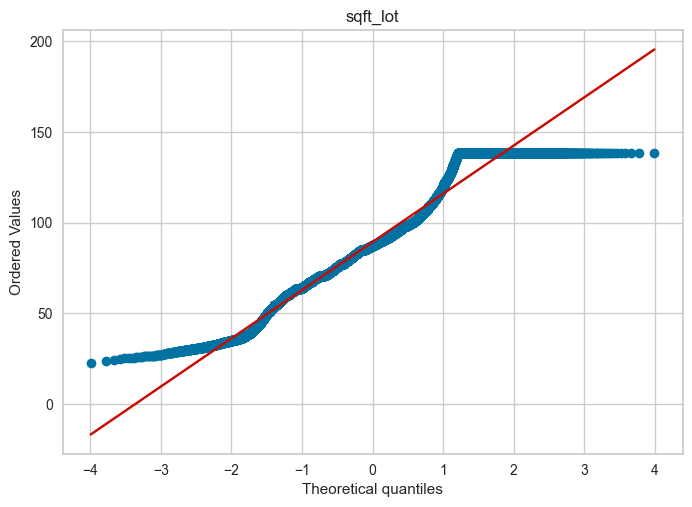

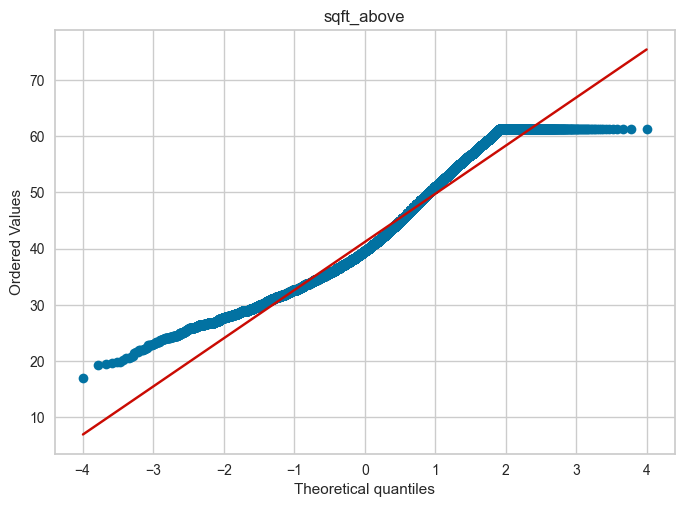

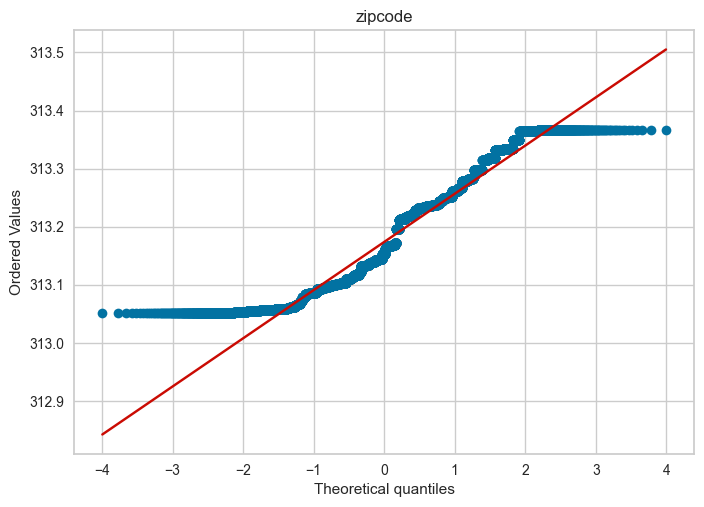

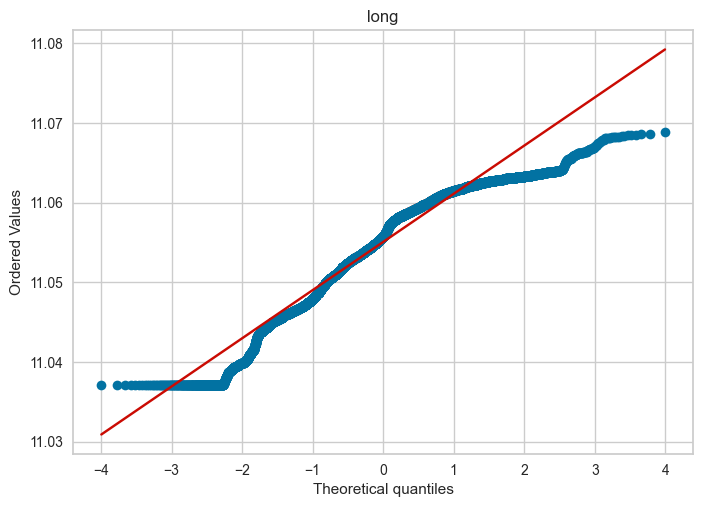

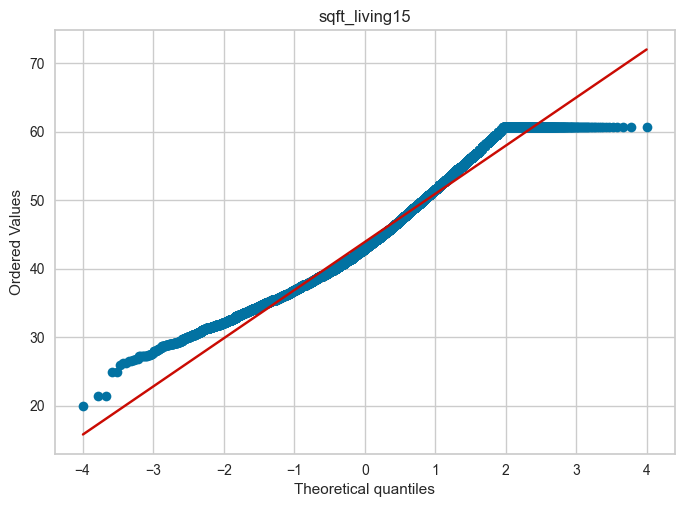

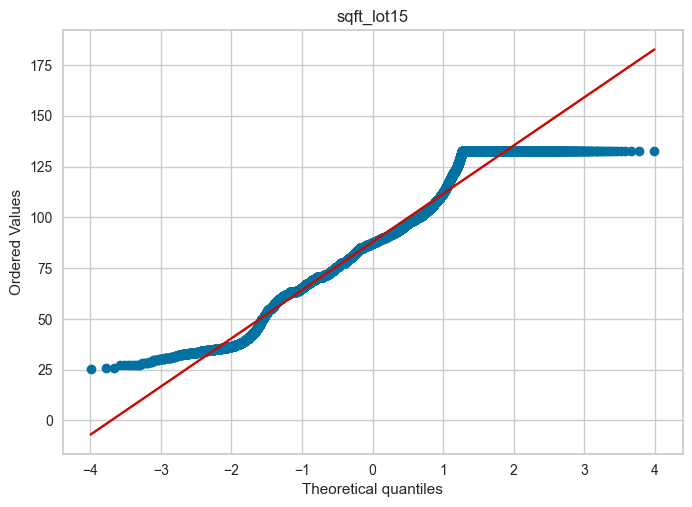

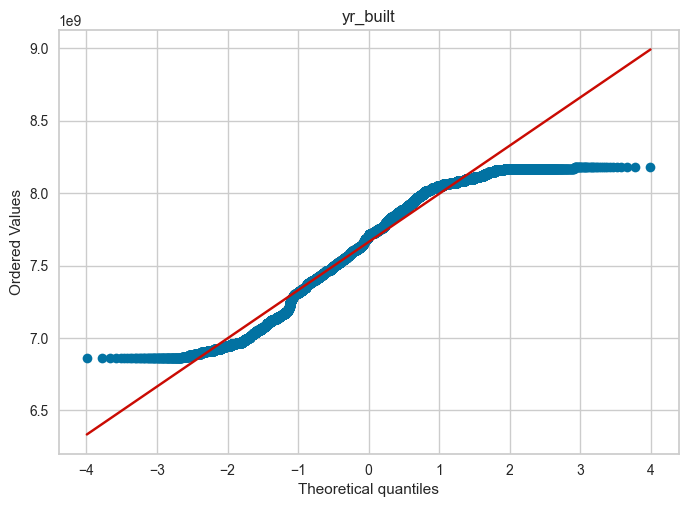

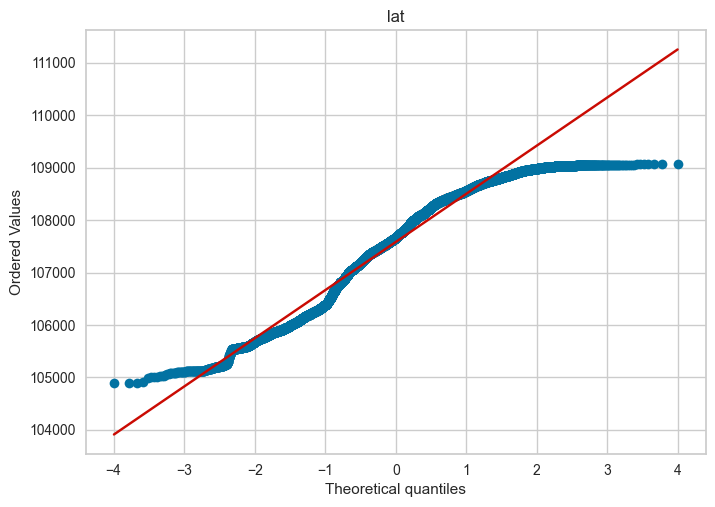

In [30]:
# Check the q-q plots for the transformed values
for field in identified_columns:
    draw_qq_plot(df5, field)

Similarly, let’s check the Histograms to see if the transformation applied properly for the transformed columns.

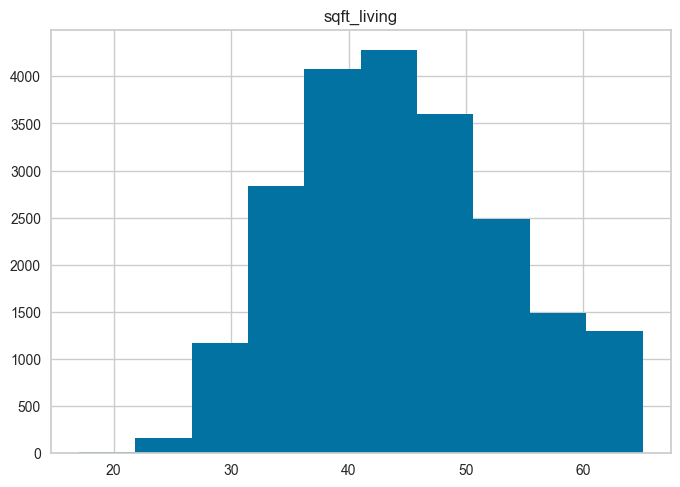

<Figure size 800x550 with 0 Axes>

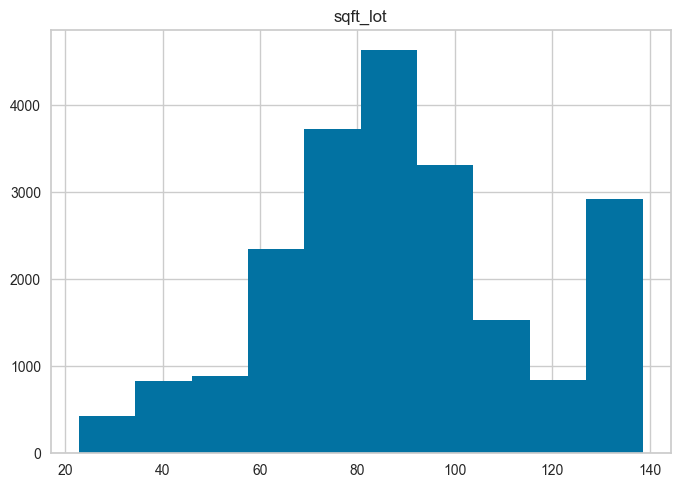

<Figure size 800x550 with 0 Axes>

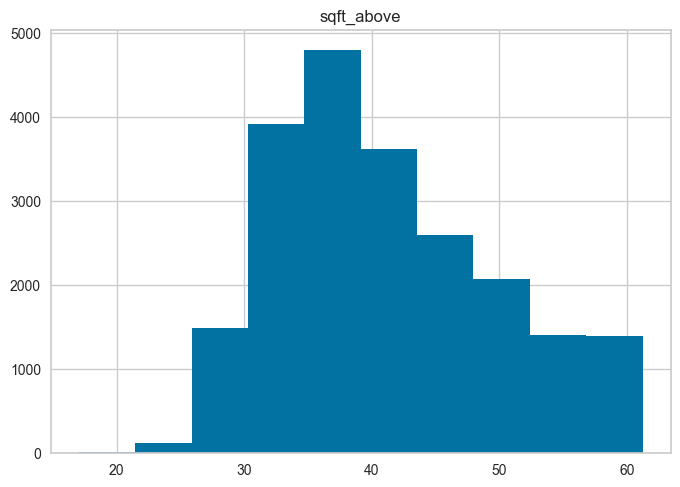

<Figure size 800x550 with 0 Axes>

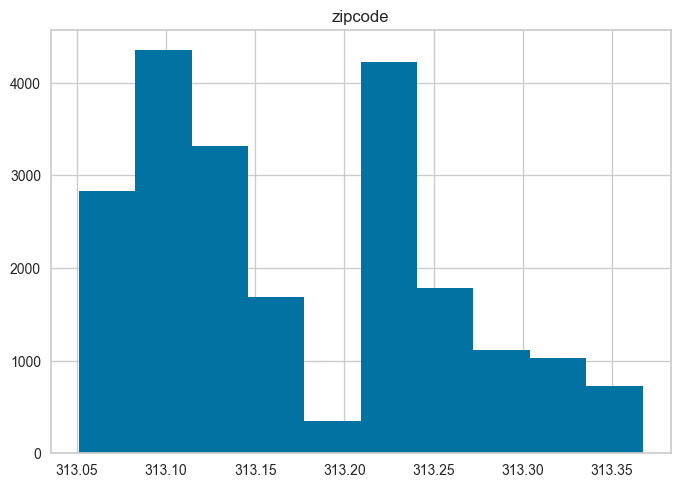

<Figure size 800x550 with 0 Axes>

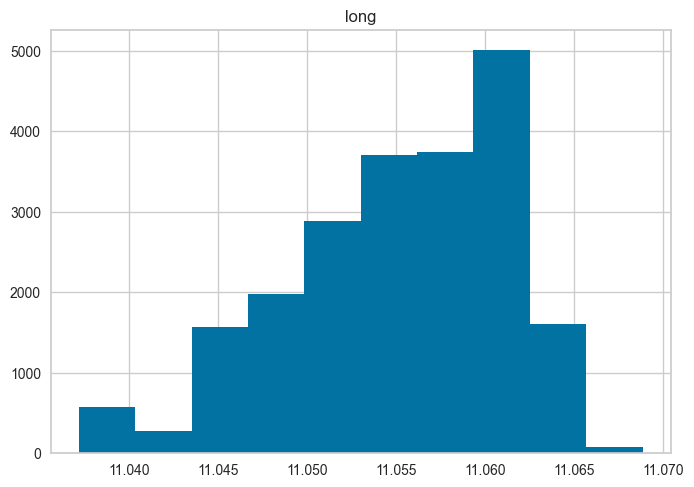

<Figure size 800x550 with 0 Axes>

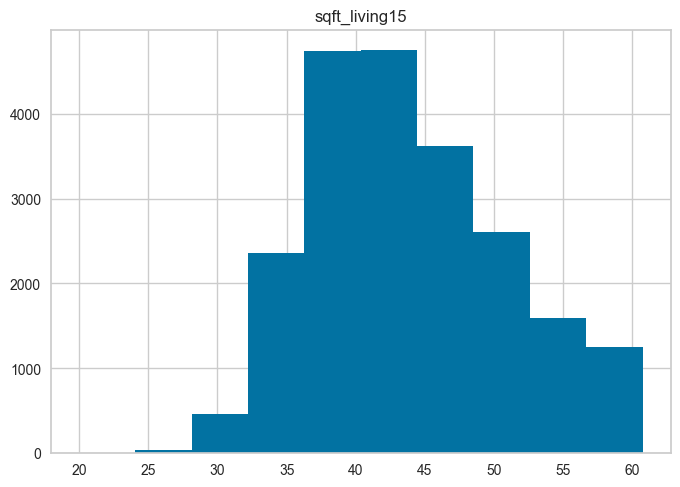

<Figure size 800x550 with 0 Axes>

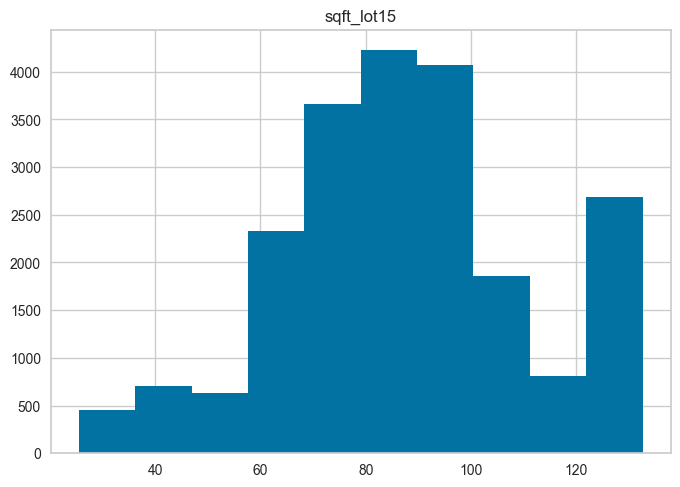

<Figure size 800x550 with 0 Axes>

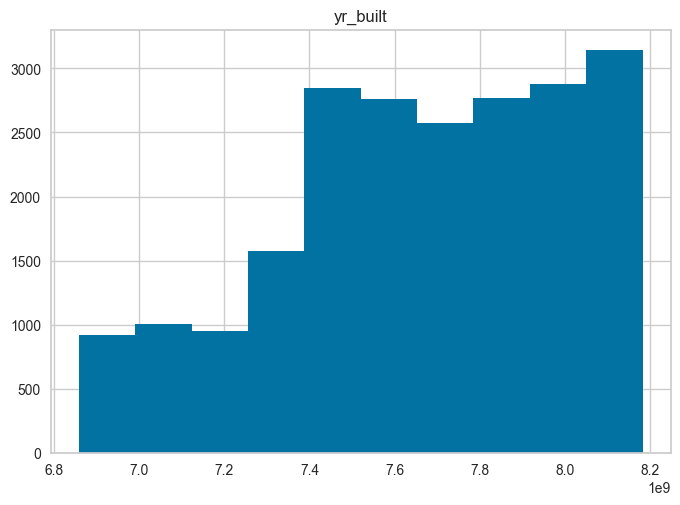

<Figure size 800x550 with 0 Axes>

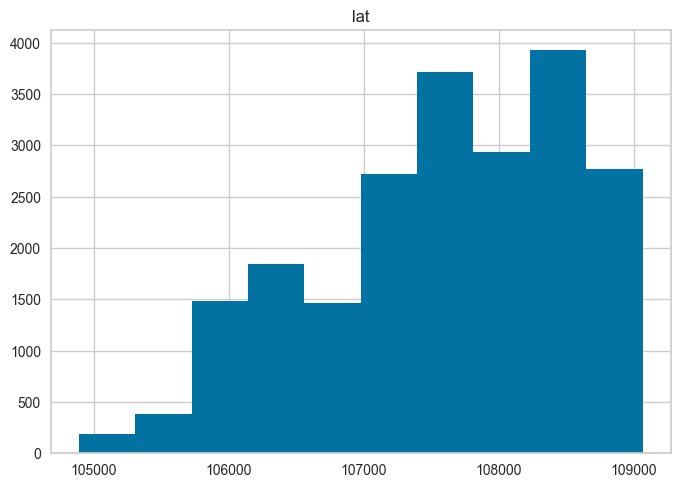

<Figure size 800x550 with 0 Axes>

In [31]:
# Check the histograms for the transformed values
for field in identified_columns:
    draw_histogram(df5, field)

Similarly, let’s check the Histplots to see if the transformation applied properly for the transformed columns.

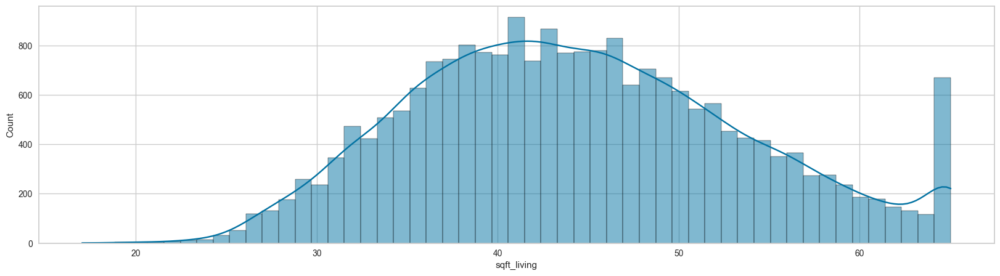

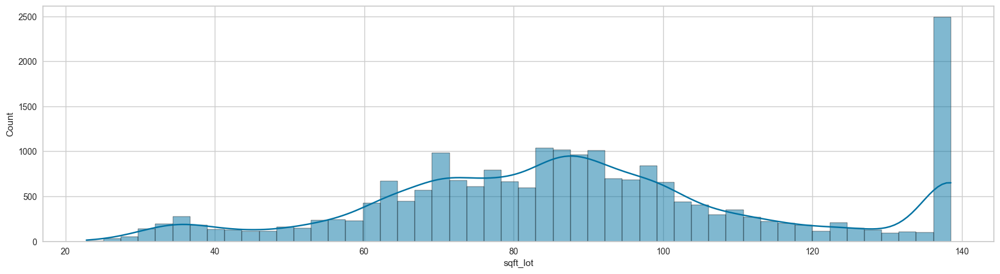

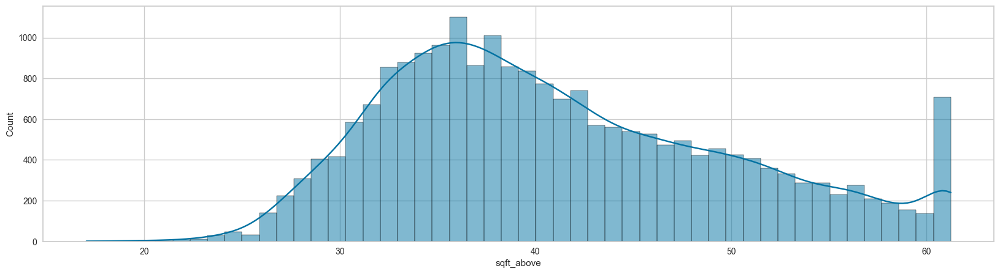

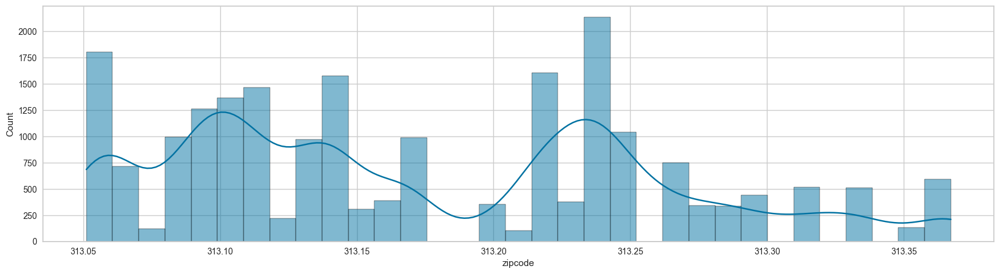

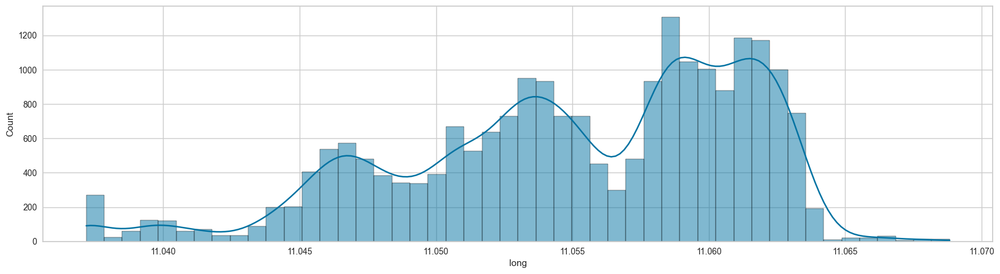

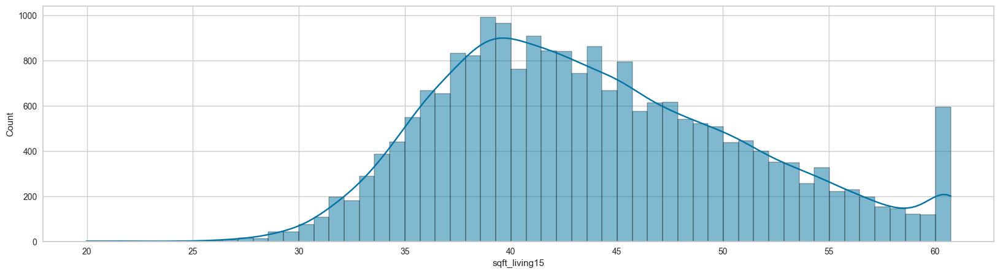

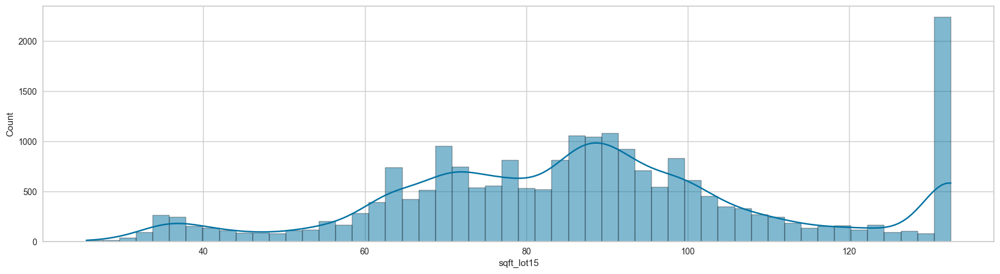

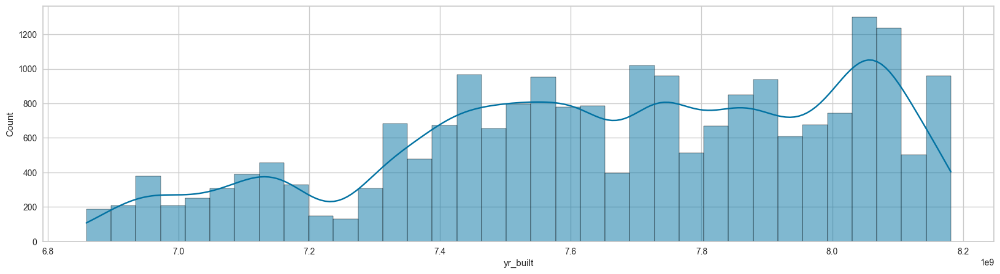

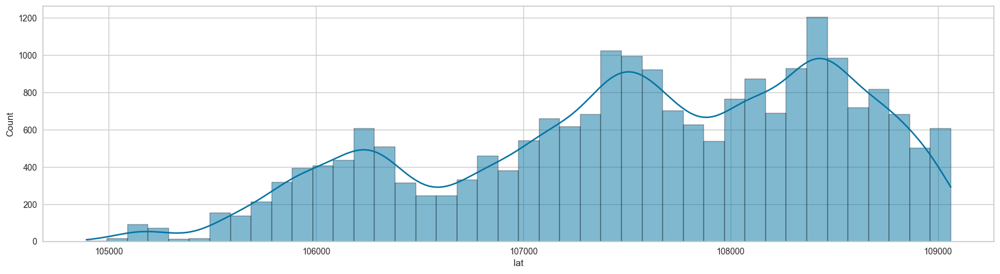

In [32]:
# Check histplots for the transformed values
for field in identified_columns:
    draw_histplots(df5, field)

### 1.2.3 Applying Suitable Feature Encoding Techniques

##### Common Techniques for Feature Coding
**• One Hot Encoding**: Use some variables to predict unknown values of other variables.\
**• Label Encoding**: Find human-readable patterns that describe the data.\
**• Ordinal Encoding**: Ordinal encoding is used when the categories in a variable have a natural ordering.

Since the `waterfront` and `view` variables are label encoded for the boolean values, we can simply concatenate them to the current data frame.

Therefore, our data frame contains only <span style='background-color: #FFFF6E;'>numerical values(according to `df.info()` function)</span>and, we do not need to do feature encodings.

In [33]:
# Concatenate the label_frame to the transformed data frame
df5 = pd.concat([df5, label_frame], join='outer', axis=1).reset_index(drop=True)

# Check whether the concatenation is being done properly
df5.head()

,sqft_living,sqft_lot,sqft_above,zipcode,long,sqft_living15,sqft_lot15,yr_built,lat,bedrooms,bathrooms,condition,grade,sqft_basement,floors,waterfront,view
0,34.351128,75.166482,34.351128,313.333688,11.056989,36.606010,75.166482,7.472059e+09,107247.702877,3.0,1.00,3.0,7.0,0.0,1.0,0,0
1,50.695167,85.099941,46.583259,313.249102,11.059792,41.109610,87.401373,7.426288e+09,108674.739386,3.0,2.25,3.0,7.0,400.0,2.0,0,0
2,27.748874,100.000000,27.748874,313.094235,11.055903,52.153619,89.788641,7.222633e+09,108790.239078,2.0,1.00,3.0,6.0,0.0,1.0,0,0
3,44.271887,70.710678,32.403703,313.266660,11.063137,36.878178,70.710678,7.587307e+09,107312.726660,4.0,3.00,5.0,7.0,910.0,1.0,0,0
4,40.987803,89.888820,40.987803,313.167687,11.047398,42.426407,86.619859,7.845012e+09,107964.410613,3.0,2.00,3.0,8.0,0.0,1.0,0,0


### 1.2.4 Scale/Standardize Data

Feature Scaling, also known as data normalization, is a technique used to standardize the range of independent variables of features of data. There are a few ways to scale or standardize data.

- Min/Max Scaling(Normalization) → Rescales features to a range between 0 and 1. 
$$X_{norm} = \frac{X - X_{min}}{X_{max} - X_{min}}$$
- Standardization(Z-score Normalization) → Centers the data around 0 with a standard deviation of 1.
$$X_{std} = \frac{X - mean(X)}{std(X)}$$
- Robust Scaling → Similar to standardization but uses the median and the inter-quartile range.
$$X_{robust} = \frac{X - median(X)}{Q_3(X) - Q_1(X)}$$

In this case, we are using the `Min-Max Scaling` to rescale features to a range between 0 and 1, since it <span style='background-color: #FFFF6E;'>helps more in the regression process</span>. The code snippet used to scale the data is shown below.

In [34]:
# Create the scaler object
scaler = MinMaxScaler()

# Copy the data frame
df_scaled = df5.copy()
df_scaled[df_scaled.columns] = scaler.fit_transform(df_scaled[df_scaled.columns])

# Check data
df_scaled.head()

,sqft_living,sqft_lot,sqft_above,zipcode,long,sqft_living15,sqft_lot15,yr_built,lat,bedrooms,bathrooms,condition,grade,sqft_basement,floors,waterfront,view
0,0.360801,0.452462,0.391825,0.893987,0.625916,0.407919,0.463813,0.463612,0.564991,0.375,0.125000,0.428571,0.375,0.000000,0.0,0.0,0.0
1,0.701238,0.538296,0.668521,0.626381,0.714476,0.518382,0.578103,0.428999,0.907170,0.375,0.541667,0.428571,0.375,0.285714,0.4,0.0,0.0
2,0.223280,0.667045,0.242479,0.136423,0.591629,0.789265,0.600403,0.274989,0.934865,0.125,0.125000,0.428571,0.125,0.000000,0.0,0.0,0.0
3,0.567445,0.413960,0.347773,0.681928,0.820147,0.414595,0.422190,0.550766,0.580583,0.625,0.791667,1.000000,0.375,0.650000,0.0,0.0,0.0
4,0.499039,0.579676,0.541949,0.368804,0.322928,0.550680,0.570802,0.745649,0.736845,0.375,0.458333,0.428571,0.625,0.000000,0.0,0.0,0.0


To check whether the scaling has been done, we can check the graphs of some of the columns. In this case, we are checking `sqft_living`, `sqft_lot`, `sqft_above`.

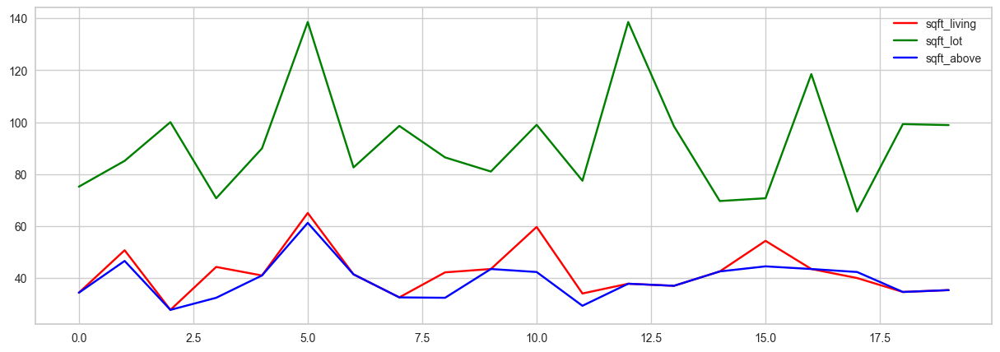

In [35]:
# Visualizing the before and after scaling graphs for features, sqft_living, sqft_lot, sqft_above
# Before
plt.figure(figsize=(15,5))
plt.plot(df5.sqft_living[:20], color='red', label='sqft_living')
plt.plot(df5.sqft_lot[:20], color='green', label='sqft_lot')
plt.plot(df5.sqft_above[:20], color='blue', label='sqft_above')
plt.legend(loc='best')
plt.show()

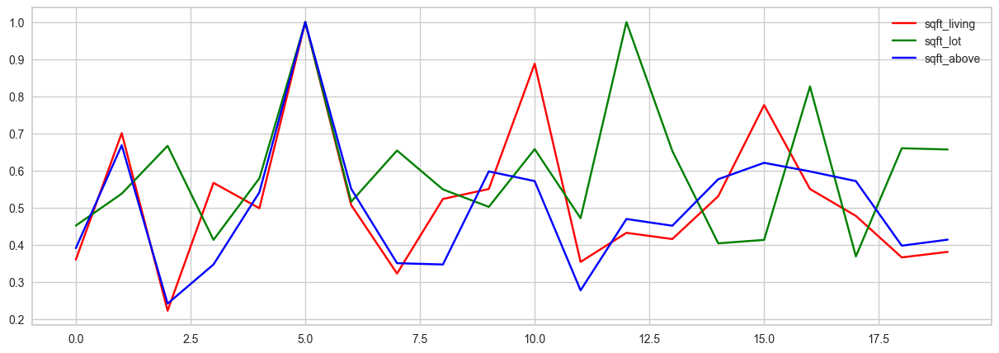

In [36]:
# After
plt.figure(figsize=(15,5))
plt.plot(df_scaled.sqft_living[:20], color='red', label='sqft_living')
plt.plot(df_scaled.sqft_lot[:20], color='green', label='sqft_lot')
plt.plot(df_scaled.sqft_above[:20], color='blue', label='sqft_above')
plt.legend(loc='best')
plt.show()

As you can see, the feature values have been scaled between 0 and 1, since we have used the Min-Max Scaling.

### 1.2.5 Data Discretization
Feature discretization, also known as binning or discretization, is the process of transforming continuous numerical features into discrete intervals or bins. This helps to handle continuous data more effectively, simplify models, and improve their interpretability. Typically, this is not used in regression tasks, but let's check whether it is enhancing our model or not.
- Equal-Width Binning(Fixed Width) → Divides the range of values into equally sized bins.
- Equal-Frequency Binning(Fixed Frequency) → Divides the data into bins with approximately the same number of data points in each bin.
- Custom Binning → Bins are defined based on domain knowledge or specific requirements.
- Quantile Binning → Bins are created based on quantiles of the data.
- Cluster-Based Binning → Uses clustering algorithms to group similar data points into
bins.
In our case, we will be using `KBinsDiscretizer` for data discretization.

In [37]:
# Copy the data frame
df_discretization = df_scaled.copy()

# Create KBinsDiscretizer
kbins = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='uniform')
df_discretization[df_discretization.columns] = kbins.fit_transform(df_discretization[df_discretization.columns])

# Check data
df_discretization.head()

,sqft_living,sqft_lot,sqft_above,zipcode,long,sqft_living15,sqft_lot15,yr_built,lat,bedrooms,bathrooms,condition,grade,sqft_basement,floors,waterfront,view
0,3.0,4.0,3.0,8.0,6.0,4.0,4.0,4.0,5.0,3.0,1.0,4.0,3.0,0.0,0.0,0.0,0.0
1,7.0,5.0,6.0,6.0,7.0,5.0,5.0,4.0,9.0,3.0,5.0,4.0,3.0,2.0,4.0,0.0,0.0
2,2.0,6.0,2.0,1.0,5.0,7.0,6.0,2.0,9.0,1.0,1.0,4.0,1.0,0.0,0.0,0.0,0.0
3,5.0,4.0,3.0,6.0,8.0,4.0,4.0,5.0,5.0,6.0,7.0,9.0,3.0,6.0,0.0,0.0,0.0
4,4.0,5.0,5.0,3.0,3.0,5.0,5.0,7.0,7.0,3.0,4.0,4.0,6.0,0.0,0.0,0.0,0.0


To check whether the discretization has been done, we can check the graphs of some of the columns. In this case, we are checking `sqft_living`, `sqft_lot`, `sqft_above`.

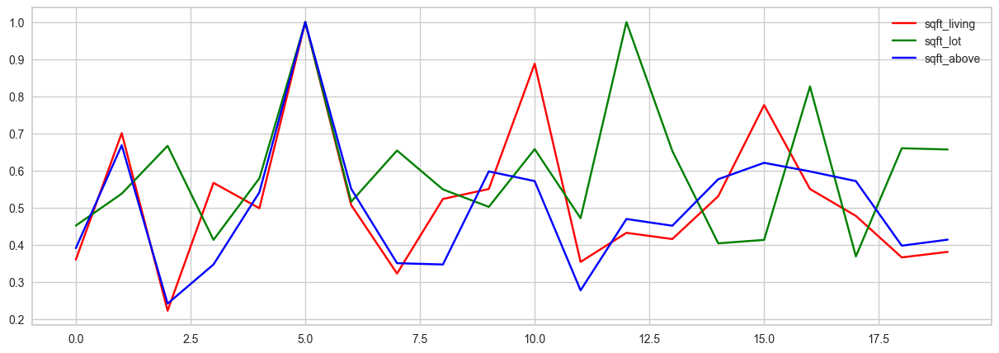

In [38]:
# Visualizing the before and after discretization graphs for features, sqft_living, sqft_lot, sqft_above
# Before
plt.figure(figsize=(15,5))
plt.plot(df_scaled.sqft_living[:20], color='red', label='sqft_living')
plt.plot(df_scaled.sqft_lot[:20], color='green', label='sqft_lot')
plt.plot(df_scaled.sqft_above[:20], color='blue', label='sqft_above')
plt.legend(loc='best')
plt.show()

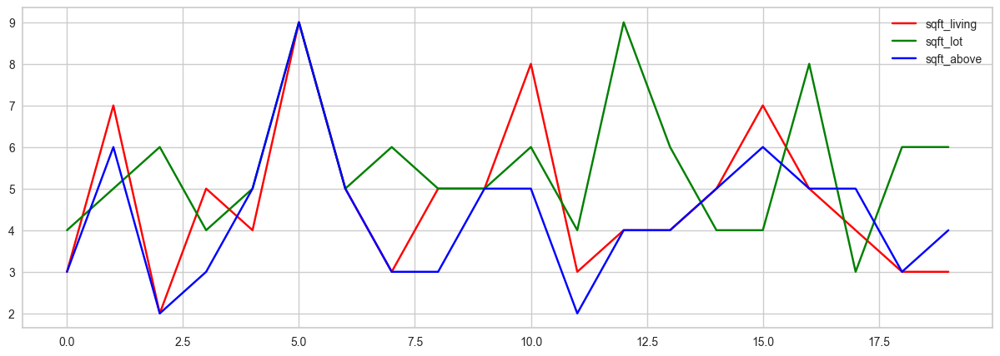

In [39]:
# After
plt.figure(figsize=(15,5))
plt.plot(df_discretization.sqft_living[:20], color='red', label='sqft_living')
plt.plot(df_discretization.sqft_lot[:20], color='green', label='sqft_lot')
plt.plot(df_discretization.sqft_above[:20], color='blue', label='sqft_above')
plt.legend(loc='best')
plt.show()

## 1.3 Perform Feature Engineering
1. Identify significant and independent features using appropriate techniques.
2. Show how you selected the features using suitable graphs.

### 1.3.1 Identifying Significant and Independent Variables

We can identify the significant features in the dataset by performing feature engineering. We are using the following feature engineering methods on our dataset.

1. PCA(Principal Component Analysis) → PCA is used for dimension reduction in the dataset. It is useful when dealing with dealing with datasets that have many highly correlating variables.
2. SVD(Single Value Decomposition) → SVD is a matrix factorization technique that decomposes a matrix into three simple matrices, $\cup$, $\vee$, and $\sum$. This also allows us to reduce dimensionality.

#### Step 1 - PCA(Principal Component Analysis)
PCA is used for dimension reduction in the dataset. It is useful when dealing with dealing with datasets that have many highly correlating variables.

The following code is used to perform PCA.

In [40]:
# Copy data frame
df_pca_scaled = df_discretization.copy()

# Create a PCA object
pca = PCA()

# Apply the transform to the dataset
df_pca_scaled[df_pca_scaled.columns] = pca.fit_transform(df_pca_scaled[df_pca_scaled.columns])

# Shape of the df_pca_scaled
df_pca_scaled.shape

(21423, 17)

In [41]:
df_pca_scaled.head()

,sqft_living,sqft_lot,sqft_above,zipcode,long,sqft_living15,sqft_lot15,yr_built,lat,bedrooms,bathrooms,condition,grade,sqft_basement,floors,waterfront,view
0,-6.823747,1.117510,0.214979,1.623933,2.051390,-0.876585,-1.635202,0.422315,-0.730413,0.753750,-2.114116,0.009727,-0.267212,-0.137146,0.101227,0.139775,-0.040077
1,-1.069678,1.267707,3.140378,2.808250,-0.894067,0.154478,-1.171782,0.474568,0.151983,1.009553,2.931554,0.051032,1.543677,1.220256,-0.078980,-0.233644,-0.634162
2,-6.137180,-2.092381,-3.510175,1.709763,-4.232691,-0.741925,1.318847,1.952079,-1.338189,0.228997,1.176765,-0.577473,1.760522,-2.534955,-0.032992,0.397191,0.001911
3,-2.425581,-2.053753,5.189700,-3.730111,1.600061,1.511895,-1.330250,-2.596062,2.351840,-1.194973,0.120411,-1.629998,-0.177959,-0.427992,0.076853,0.149365,-0.015298
4,-0.086395,1.226343,-2.251682,0.668793,-1.795358,-1.743467,-0.338685,-0.067790,-0.452138,0.298379,-2.213838,-1.228791,-1.078461,0.426743,0.113829,0.086477,0.527079


#### Step 2 - SVD(Single Value Decomposition)
SVD is a matrix factorization technique that decomposes a matrix into three simple matrices, $\cup$, $\vee$, and $\sum$. This also allows us to reduce dimensionality.

The following code is used to perform SVD. First, we get the optimal number of components and perform the SVD using them.

In [42]:
# Copy the data frame
df_svd_tmp = df_discretization.copy()

# Make the sparse matrix
X_sparse = csr_matrix(df_svd_tmp)

# Use the TruncatedSVD
tsvd = TruncatedSVD(n_components=X_sparse.shape[1])
X_tsvd = tsvd.fit(df_svd_tmp)

# Get the explained variance ratios
tsvd_var_ratios = tsvd.explained_variance_ratio_

def select_component_count(var_ratio, goal_variance:float)->int:
    # Set the initial variance
    total_variance = 0.0

    # Set the initial number of features
    n_components = 0

    # Run for every feature 
    for explained_variance in var_ratio:
        # Add the explained variance to the total
        total_variance += explained_variance
        n_components += 1
        #if we reach our goal level of explained variance
        if total_variance >= goal_variance:
            break
            
    # Return the number of components
    return n_components


# Get the number of components based on variance
number_of_components = select_component_count(tsvd_var_ratios, 0.95)
print(f'Number of components: {number_of_components}')

Number of components: 12


In [43]:
# Copy the data frame
df_for_svd = df_pca_scaled.copy()

svd = TruncatedSVD(n_components=number_of_components)
svd.fit(df_for_svd)

# Appy transform
trnsf = svd.transform(df_for_svd)

# Get the df
df_svd = pd.DataFrame(trnsf)

# View Data
df_svd.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,-6.823747,1.117510,0.214979,1.623933,2.051390,-0.876585,-1.635202,0.422315,-0.730413,0.753750,-2.114116,0.009727
1,-1.069678,1.267707,3.140378,2.808250,-0.894067,0.154478,-1.171782,0.474568,0.151983,1.009553,2.931554,0.051032
2,-6.137180,-2.092381,-3.510175,1.709763,-4.232691,-0.741925,1.318847,1.952079,-1.338189,0.228997,1.176765,-0.577473
3,-2.425581,-2.053753,5.189700,-3.730111,1.600061,1.511895,-1.330250,-2.596062,2.351840,-1.194973,0.120411,-1.629998
4,-0.086395,1.226343,-2.251682,0.668793,-1.795358,-1.743467,-0.338685,-0.067790,-0.452138,0.298379,-2.213838,-1.228791


#### Step 3 - Correlation Values
Next, we need to check for the correlation values. Because the lower the correlation values are, we can separate the data into unique clusters. The following code shows how you can get the correlation values.

In [44]:
# Add price column for correlation
df_for_svd['price']=target_frame

# Get all the correlations
df_for_svd.corr()

,sqft_living,sqft_lot,sqft_above,zipcode,long,sqft_living15,sqft_lot15,yr_built,lat,bedrooms,bathrooms,condition,grade,sqft_basement,floors,waterfront,view,price
sqft_living,1.000000e+00,9.987062e-15,-7.820457e-15,1.461884e-15,6.734550e-16,-3.678457e-15,-6.022779e-16,-3.302850e-16,2.779719e-15,-2.933915e-15,-2.381561e-15,-8.711602e-16,-5.352624e-15,-7.580929e-15,3.564423e-17,4.433280e-16,6.306147e-15,0.574760
sqft_lot,9.987062e-15,1.000000e+00,-1.261172e-14,1.059693e-14,2.312424e-15,-3.076275e-15,-3.348024e-15,-1.779508e-15,1.661453e-15,-1.813787e-15,2.568537e-15,-1.203835e-16,-2.228339e-15,-3.226871e-17,-1.371976e-15,5.824736e-15,2.213287e-15,-0.084507
sqft_above,-7.820457e-15,-1.261172e-14,1.000000e+00,-3.359727e-15,-4.541463e-15,-3.913163e-15,1.012736e-15,2.027258e-16,-1.033849e-16,-4.964394e-15,2.954376e-15,9.727352e-16,-4.711038e-15,-4.954554e-15,-1.077931e-15,3.707229e-15,1.231753e-15,0.441765
zipcode,1.461884e-15,1.059693e-14,-3.359727e-15,1.000000e+00,-6.176405e-15,4.043288e-15,6.479327e-15,1.337976e-15,-3.278181e-15,-1.413390e-15,-8.992090e-16,-7.393430e-16,5.122512e-16,3.168622e-16,6.362977e-16,-3.222836e-15,-7.057589e-17,0.277030
long,6.734550e-16,2.312424e-15,-4.541463e-15,-6.176405e-15,1.000000e+00,1.482742e-15,2.595755e-15,4.394503e-16,-2.060856e-15,-1.171876e-15,2.605144e-16,-4.112454e-16,-1.747678e-17,-3.578804e-16,-3.289093e-16,-9.668491e-16,-1.120205e-16,-0.202730
sqft_living15,-3.678457e-15,-3.076275e-15,-3.913163e-15,4.043288e-15,1.482742e-15,1.000000e+00,-2.281883e-15,1.341939e-15,1.000574e-15,-9.256245e-16,6.449242e-17,-8.346490e-16,-6.796213e-16,-1.299599e-15,3.286987e-16,1.363151e-15,2.084791e-15,0.055017
sqft_lot15,-6.022779e-16,-3.348024e-15,1.012736e-15,6.479327e-15,2.595755e-15,-2.281883e-15,1.000000e+00,-1.825439e-15,-1.013729e-15,7.858779e-16,-1.586216e-16,-3.979399e-16,-1.880617e-15,2.300731e-16,-1.646887e-15,1.141526e-15,8.255459e-16,0.264383
yr_built,-3.302850e-16,-1.779508e-15,2.027258e-16,1.337976e-15,4.394503e-16,1.341939e-15,-1.825439e-15,1.000000e+00,1.692571e-15,8.622861e-17,-5.275638e-16,-2.142436e-16,1.867240e-15,-8.127808e-17,-1.474083e-15,1.293706e-16,7.555791e-16,-0.008962
lat,2.779719e-15,1.661453e-15,-1.033849e-16,-3.278181e-15,-2.060856e-15,1.000574e-15,-1.013729e-15,1.692571e-15,1.000000e+00,9.716914e-16,8.088137e-16,-1.560558e-15,2.625409e-15,9.144441e-16,-7.930081e-16,-9.667827e-16,-6.592562e-16,-0.081135
bedrooms,-2.933915e-15,-1.813787e-15,-4.964394e-15,-1.413390e-15,-1.171876e-15,-9.256245e-16,7.858779e-16,8.622861e-17,9.716914e-16,1.000000e+00,9.542490e-17,-9.463894e-16,-4.294551e-16,-6.882931e-16,6.569796e-16,5.745581e-16,8.116283e-16,0.013448


<Axes: >

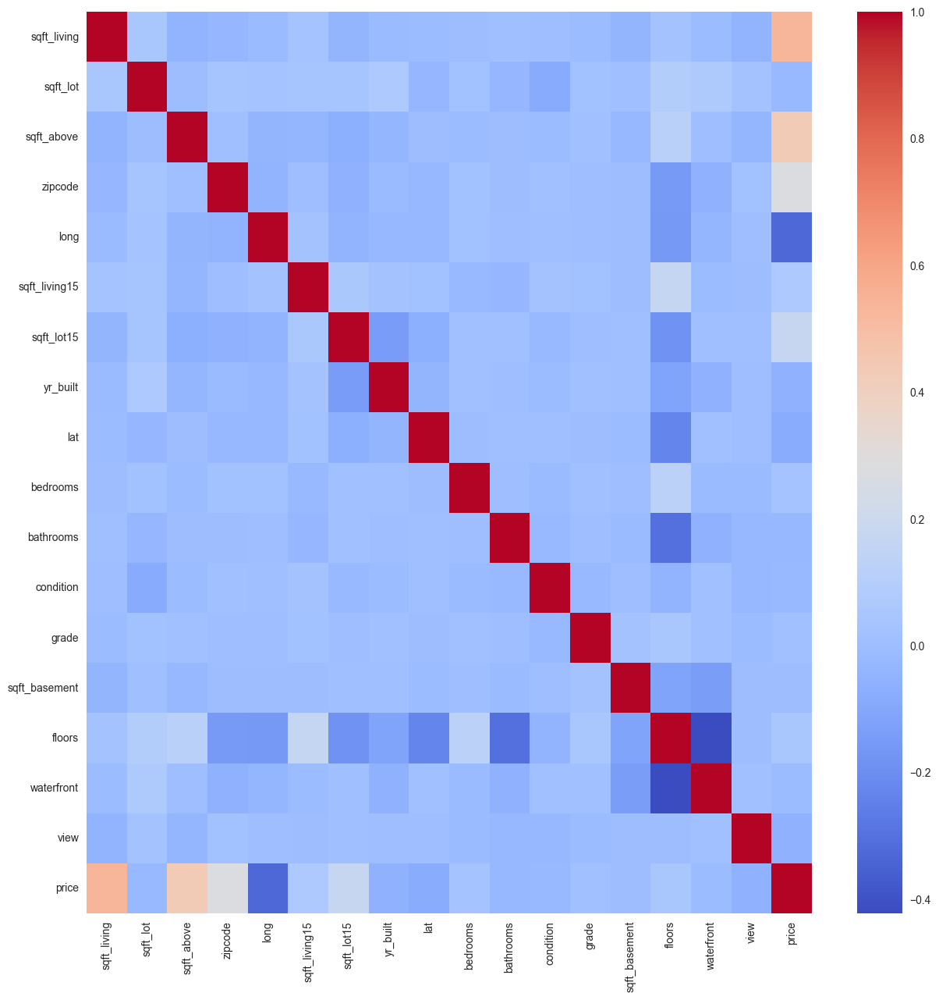

In [45]:
# Create heatmap
f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(df_for_svd.corr(method='spearman'), annot=False, cmap='coolwarm')

Since all the features in the dataset have low correlation values with each other, we can determine all of the features are independent variables and they can be used for the clustering algorithms. But to determine the significant features we can use sorting. Since the variables that have highly correlated values with `price` are the most significant variables. This is highly important for regression algorithms.

In [46]:
# Select most significant variables in descending order
correlation_matrix = df_for_svd.corr()

# Get them in descending order
correlation_with_price = correlation_matrix['price'].abs().sort_values(ascending=False)

# Print the values
print(correlation_with_price)

price            1.000000
sqft_living      0.574760
sqft_above       0.441765
zipcode          0.277030
sqft_lot15       0.264383
long             0.202730
sqft_lot         0.084507
lat              0.081135
sqft_living15    0.055017
floors           0.033032
sqft_basement    0.032807
condition        0.026355
bedrooms         0.013448
bathrooms        0.011759
yr_built         0.008962
grade            0.005706
waterfront       0.005326
view             0.002410
Name: price, dtype: float64


With that result, we can select the most significant values as the features with correlation values that are greater than 0.21.
- `sqft_living`
- `sqft_above`
- `zipcode`
- `sqft_lot15`

## 1.4 Regression
1. Perform the following regression techniques on the data set to predict the value of a response variable.
    - Linear regression with cross-validation(K=10)
    - Lasso regression with cross-validation(K=10)
    - Ridge regression with cross-validation(K=10)
2. Using suitable evaluation matrices, compare the applicability of different regression algorithms on the given dataset.
3. Relates regression modeling results to the original problem and provides actionable insights.

### 1.4.1 Regression
Regression is a type of supervised learning technique in Machine Learning that can be used to predict continuous values. Although we can use it with discretized values, sometimes it may not perform well. We will check whether it is giving better results with discretized values or not in this notebook as well. Regression is particularly useful if we want to predict the outcome of a variable that depends on one or many independent variables.

As you have noted so far, we need to predict the `price` of houses, when someone provides the other variables presented in the dataset(e.g. `bedrooms`, `sqft_living`). If we assume the `price` of the houses depends on a `sqft_living` only, then we can have a simple equation like this.

$$y_i = f(x_i) + \epsilon_i$$

In here,\
• $x$ - This is the input variable or the independent variable. (`sqft_living`)\
• $y$ - This is the output variable or the dependent variable. (`price`)\
• $\epsilon$ - This is the error term. This is because you can have two houses with the same `sqft_living` value but sold for different prices due to the seasons/time they were sold.\
• $i$ - This is the iteration of our input, output, and error terms.

Let's say we have our training data and test data split out from our dataset. Then what we can do to determine the `price` of the houses using the `sqft_living` is create a function to predict the  prices. And, the _quality metric_ will tell us our performance(whether the `price` we estimated using the estimated function is correct or not). It is possible that there can be some errors in our estimated values. Therefore, there will be a machine learning model to minimize the errors we make in estimated values. Consider the following variables.

• $\hat{y}$ - The estimated/predicted house price.\
• $\hat{f}$ - The estimated function.\
• $y$ - Actual house price.\

<img src='./images/regression/2.png' alt="Simple Regression ML Model" style='width:500px;height:auto;display:block;margin-left:auto;margin-right:auto'/>


With this, let's check how we can create a simple linear regression model with a train test split 0.8 to 0.2 ratio. The training data will be used to train the model and the testing set will be used to check the accuracy of the model.

#### Step 1 - Simple Linear Regression 

##### Cross-Validation ❌
##### Discretized Data ✅ 
##### Polynomial ❌

Create a data frame containing discretized values and the target value.

In [47]:
# Let's get the relationships between features and target
# We need to have a data frame with price value in it. Therefore, let's create a combined data frame for that.
combined_df_discretized = pd.concat([df_discretization, target_frame], join='outer', axis=1)

Use `sns.pairplot()` to visualize the relationship between the variables.

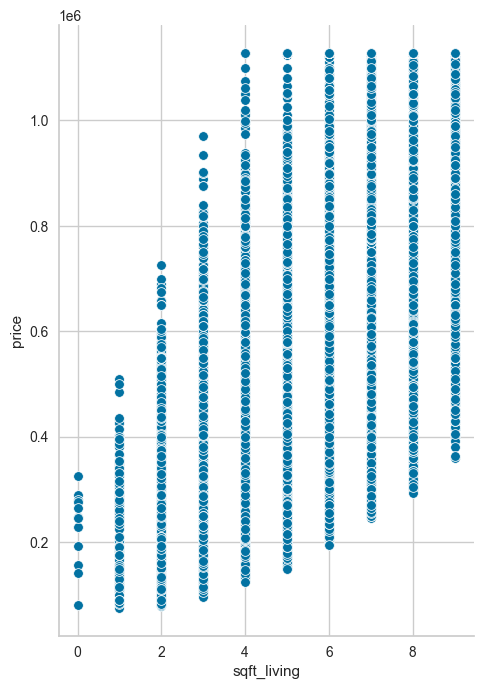

In [48]:
# Visualize the relationship
sns.pairplot(combined_df_discretized, x_vars=['sqft_living'], y_vars='price', height=7, aspect=0.7)

The below code uses the linear regression with `LinearRegression()` model instantiation. The code snippet and the output plots are shown below.

Mean Squared Error for the Linear Regression Model: 33514229396.28577
Mean R-squared Score for the Linear Regression Model: 0.46436623664078314
Residual Sum of Squares (RSS) for the Linear Regression Model: 143608472963084.53
Coefficient of the Linear Regression Model: [('sqft_living', array([88883.18694282]))]
Intercept of the Linear Regression Model: [50137.1311421]


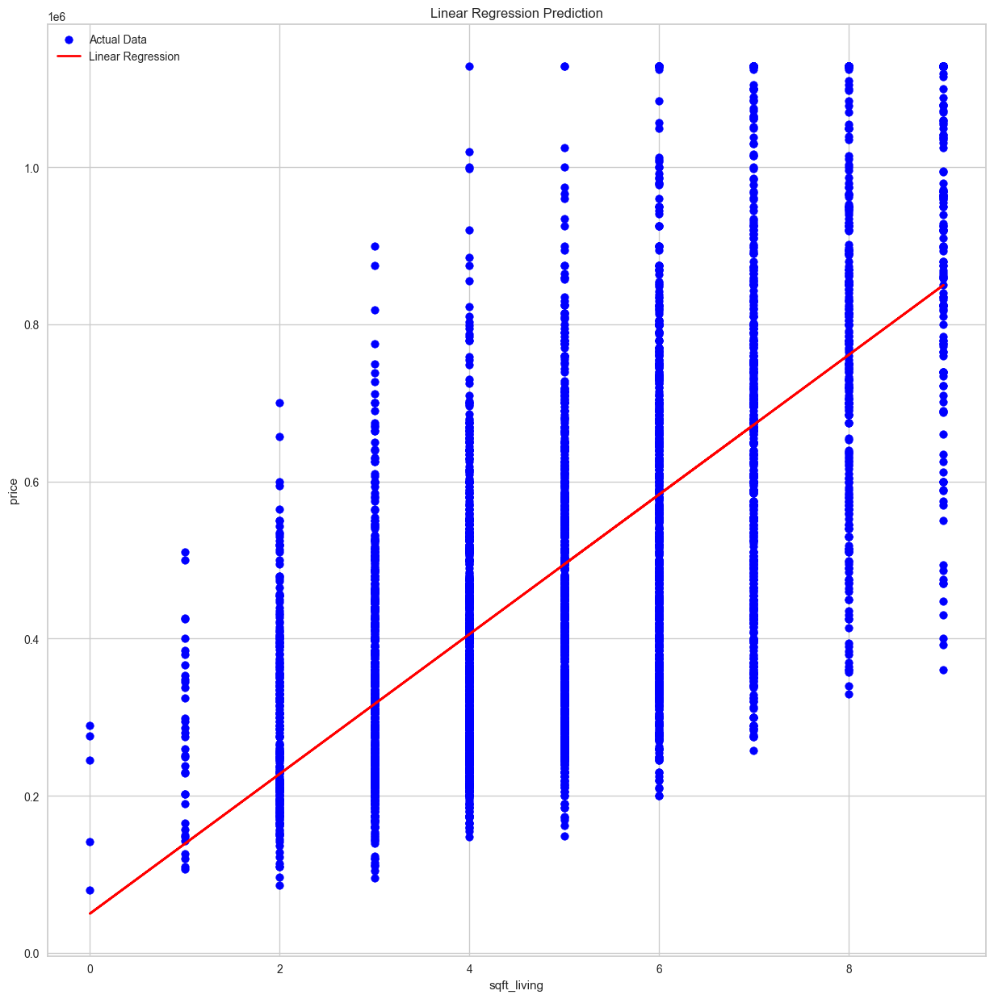

In [49]:
# Using the discretized data

# Copy the Data Frame
df_simple_regression = combined_df_discretized.copy()

# Let's try to create a simple regression model where sqft_living is used to determine the house price.
feature_cols = ['sqft_living']
X = df_simple_regression[feature_cols]
y = df_simple_regression[['price']]

# Make train test split with 0.8/0.2
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Create the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate the mean squared error(MSE), R-squared score and RSS
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rss = np.sum((y_test-y_pred)**2)

# Print the MSE, R-squared score, and RSS
print("Mean Squared Error for the Linear Regression Model:", mse)
print("Mean R-squared Score for the Linear Regression Model:", r2)
# Since rss is a Pandas Series we need to use series.values[0] to get the RSS value
print("Residual Sum of Squares (RSS) for the Linear Regression Model:", rss.values[0])
# Coefficients of the Regression Model
print(f"Coefficient of the Linear Regression Model: {list(zip(feature_cols, model.coef_))}")
# Intercept of the Regression Model
print(f'Intercept of the Linear Regression Model: {model.intercept_}')

# Visualize the data to check whether the regression was done correctly
plt.figure(figsize=(15,15))
plt.scatter(X_test, y_test, color='blue', label='Actual Data')
plt.plot(X_test, y_pred, color='red', linewidth=2, label = 'Linear Regression')
plt.title('Linear Regression Prediction')
plt.xlabel('sqft_living')
plt.ylabel('price')
plt.legend()
plt.show()

Predictions and residual values.

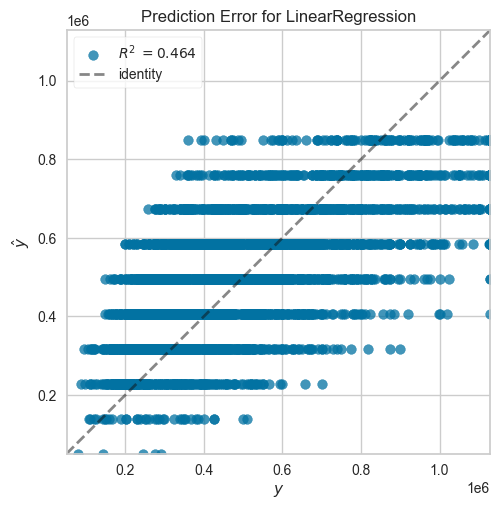

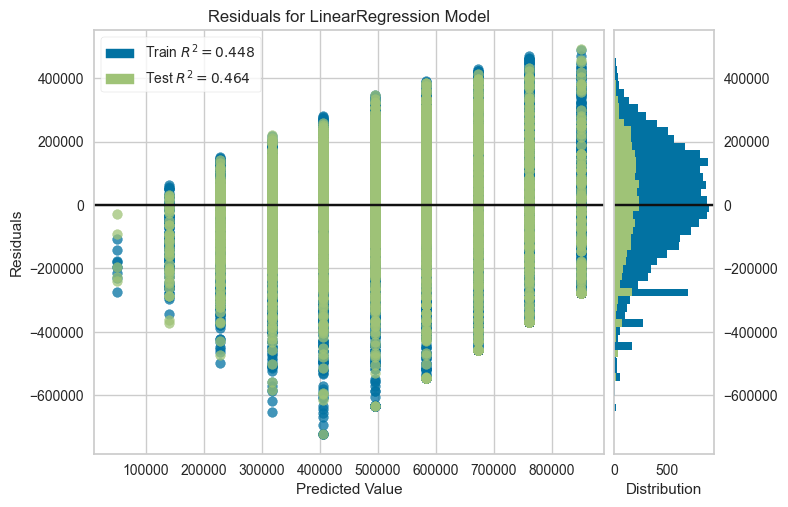

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [50]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

The reason we are seeing the data like this is due to the data discretization. Let's run the model one more time with the data frame we had before data discretization.

##### Cross-Validation ❌
##### Discretized Data ❌
##### Polynomial ❌

Create a data frame containing non-discretized values and the target value.

In [51]:
# Let's get the relationships between features and target
# We need to have a data frame with price value in it. Therefore, let's create a combined data frame for that.
combined_df_non_discretized = pd.concat([df_scaled, target_frame], join='outer', axis=1)

Use `sns.pairplot()` to visualize the relationship between the variables.

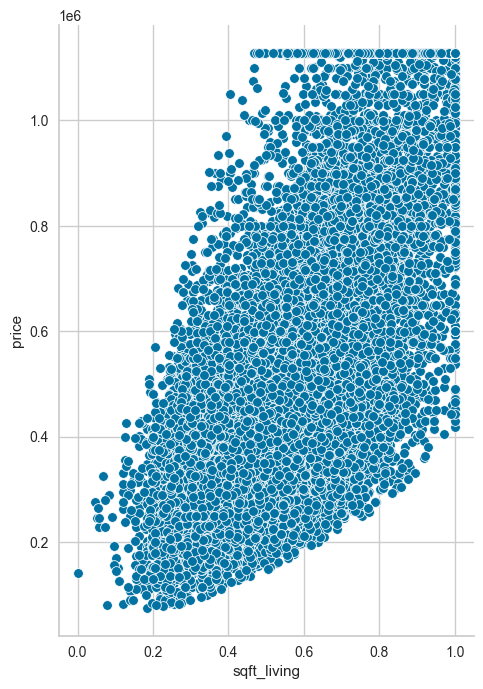

In [52]:
# Visualize the relationship
sns.pairplot(combined_df_non_discretized, x_vars=['sqft_living'], y_vars='price', height=7, aspect=0.7)

The below code uses the linear regression with `LinearRegression()` model instantiation. The code snippet and the output plots are shown below.

Mean Squared Error for the Linear Regression Model: 32495946879.390976
Mean R-squared Score for the Linear Regression Model: 0.4806407118864441
Residual Sum of Squares (RSS) for the Linear Regression Model: 139245132378190.33
Coefficient of the Linear Regression Model: [('sqft_living', array([899826.67842286]))]
Intercept of the Linear Regression Model: [-2236.63573972]


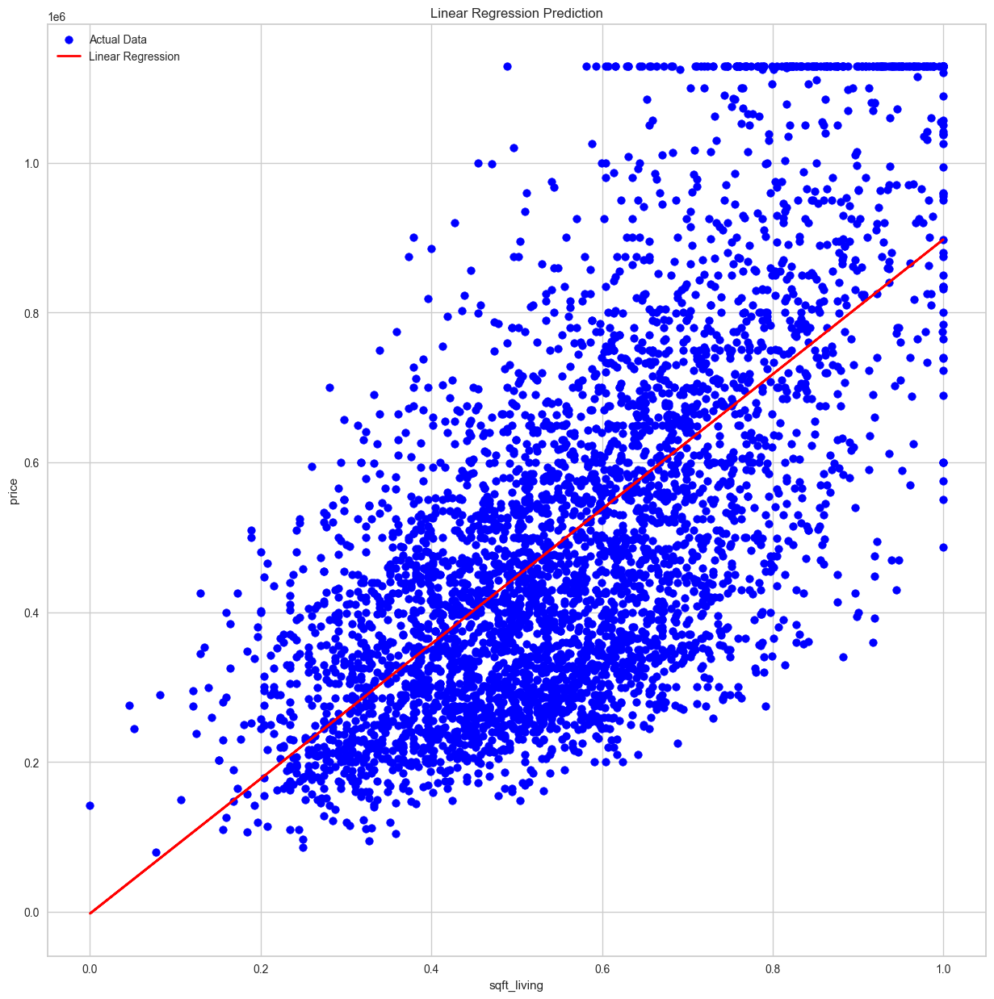

In [53]:
# Using the non-discretized data

# Copy the Data Frame
df_simple_regression = combined_df_non_discretized.copy()

# Let's try to create a simple regression model where sqft_living is used to determine the house price.
feature_cols = ['sqft_living']
X = df_simple_regression[feature_cols]
y = df_simple_regression[['price']]

# Make train test split with 0.8/0.2
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Create the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate the mean squared error(MSE), R-squared score and RSS
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rss = np.sum((y_test-y_pred)**2)

# Print the MSE, R-squared score, and RSS
print("Mean Squared Error for the Linear Regression Model:", mse)
print("Mean R-squared Score for the Linear Regression Model:", r2)
# Since rss is a Pandas Series we need to use series.values[0] to get the RSS value
print("Residual Sum of Squares (RSS) for the Linear Regression Model:", rss.values[0])
# Coefficients of the Regression Model
print(f"Coefficient of the Linear Regression Model: {list(zip(feature_cols, model.coef_))}")
# Intercept of the Regression Model
print(f'Intercept of the Linear Regression Model: {model.intercept_}')

# Visualize the data to check whether the regression was done correctly
plt.figure(figsize=(15,15))
plt.scatter(X_test, y_test, color='blue', label='Actual Data')
plt.plot(X_test, y_pred, color='red', linewidth=2, label = 'Linear Regression')
plt.title('Linear Regression Prediction')
plt.xlabel('sqft_living')
plt.ylabel('price')
plt.legend()
plt.show()

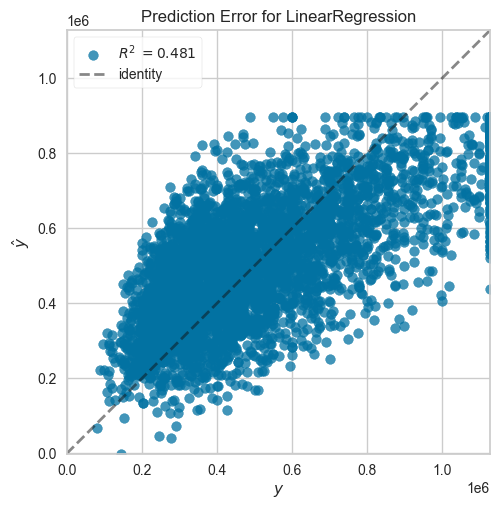

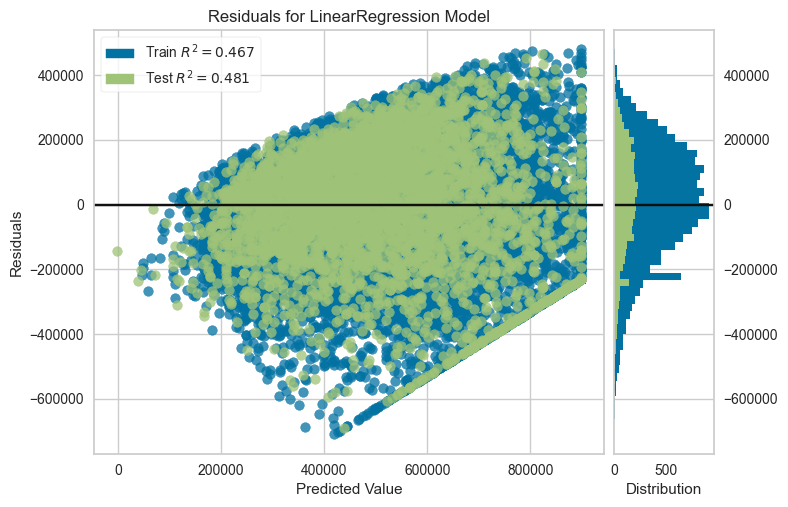

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [54]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

If there is a nonlinear relationship between independent and dependent variables, we can use something called polynomial regression.

##### Cross-Validation ❌
##### Discretized Data ✅ 
##### Polynomial ✅ 

Using polynomial regression in simple linear regression.

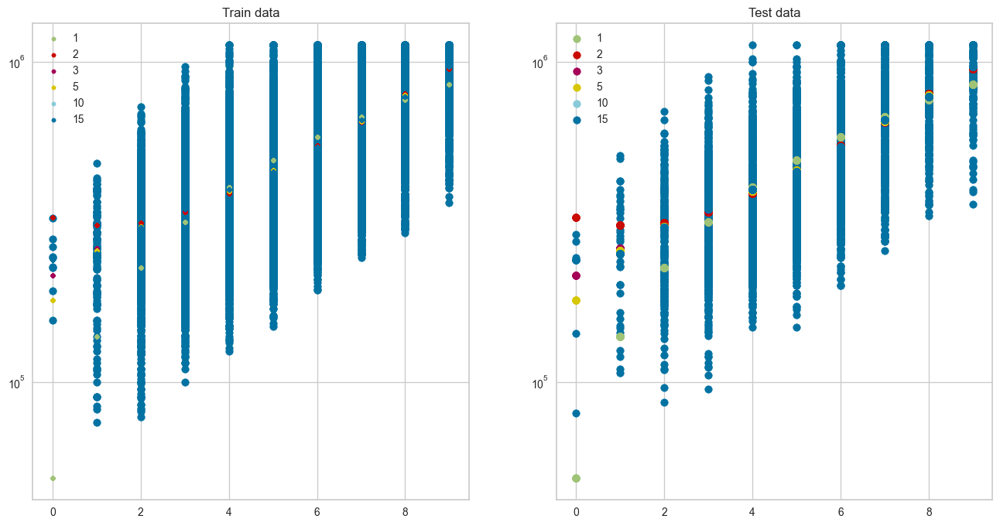

In [55]:
# Using the discretized data

# Copy the Data Frame
df_simple_regression = combined_df_discretized.copy()

# Let's try to create a simple regression model where sqft_living is used to determine the house price.
feature_cols = ['sqft_living']
X = df_simple_regression[feature_cols[0]].values.reshape(-1,1)
y = df_simple_regression['price'].values

# Make train test split with 0.8/0.2
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Fit multiple polynomial features
degrees = [1, 2, 3, 5, 10, 15]

# y_train_pred and y_test_pred to store train and test predictions
y_train_pred = np.zeros((len(X_train), len(degrees)))
y_test_pred = np.zeros((len(X_test), len(degrees)))

# Make pipeline and create features
for i, degree in enumerate(degrees):
    # create pipeline
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    model.fit(X_train, y_train)

    # predict on test and train data
    y_train_pred[:,i] = model.predict(X_train)
    y_test_pred[:,i] = model.predict(X_test)

# Visualize and test predictions
# train data
plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.scatter(X_train, y_train)
plt.yscale('log')
plt.title("Train data")
for i, degree in enumerate(degrees):    
    plt.scatter(X_train, y_train_pred[:, i], s=15, label=str(degree))
    plt.legend(loc='best')
    
# test data
plt.subplot(122)
plt.scatter(X_test, y_test)
plt.yscale('log')
plt.title("Test data")
for i, degree in enumerate(degrees):    
    plt.scatter(X_test, y_test_pred[:, i], label=str(degree))
    plt.legend(loc='upper left')

In [56]:
print("R-squared values for Discretized Data: \n")

for i, degree in enumerate(degrees):
    train_r2 = round(r2_score(y_train, y_train_pred[:, i]), 2)
    test_r2 = round(r2_score(y_test, y_test_pred[:, i]), 2)
    print("Polynomial degree {0}: train score={1}, test score={2}".format(degree, 
                                                                         train_r2, 
                                                                         test_r2))

R-squared values for Discretized Data: 

Polynomial degree 1: train score=0.45, test score=0.46
Polynomial degree 2: train score=0.48, test score=0.5
Polynomial degree 3: train score=0.48, test score=0.5
Polynomial degree 5: train score=0.48, test score=0.5
Polynomial degree 10: train score=0.48, test score=0.5
Polynomial degree 15: train score=0.48, test score=0.5


##### Cross-Validation ❌
##### Discretized Data ❌
##### Polynomial ✅ 

Using polynomial regression in simple linear regression.

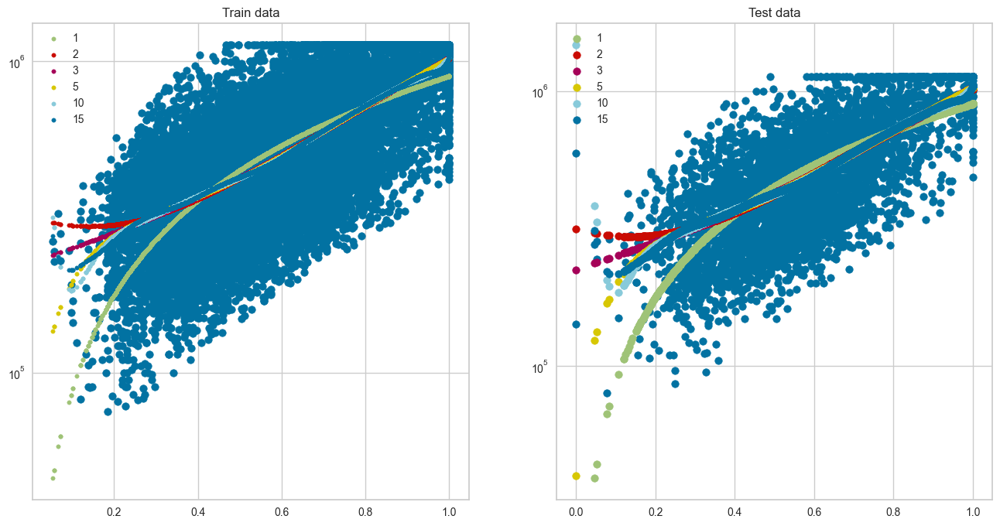

In [57]:
# Using the non-discretized data

# Copy the Data Frame
df_simple_regression = combined_df_non_discretized.copy()

# Let's try to create a simple regression model where sqft_living is used to determine the house price.
feature_cols = ['sqft_living']
X = df_simple_regression[feature_cols[0]].values.reshape(-1,1)
y = df_simple_regression['price'].values

# Make train test split with 0.8/0.2
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Fit multiple polynomial features
degrees = [1, 2, 3, 5, 10, 15]

# y_train_pred and y_test_pred to store train and test predictions
y_train_pred = np.zeros((len(X_train), len(degrees)))
y_test_pred = np.zeros((len(X_test), len(degrees)))

# Make pipeline and create features
for i, degree in enumerate(degrees):
    # create pipeline
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    model.fit(X_train, y_train)

    # predict on test and train data
    y_train_pred[:,i] = model.predict(X_train)
    y_test_pred[:,i] = model.predict(X_test)

# Visualize and test predictions
# train data
plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.scatter(X_train, y_train)
plt.yscale('log')
plt.title("Train data")
for i, degree in enumerate(degrees):    
    plt.scatter(X_train, y_train_pred[:, i], s=15, label=str(degree))
    plt.legend(loc='best')
    
# test data
plt.subplot(122)
plt.scatter(X_test, y_test)
plt.yscale('log')
plt.title("Test data")
for i, degree in enumerate(degrees):    
    plt.scatter(X_test, y_test_pred[:, i], label=str(degree))
    plt.legend(loc='upper left')

In [58]:
print("R-squared values for Non-Discretized Data: \n")

for i, degree in enumerate(degrees):
    train_r2 = round(r2_score(y_train, y_train_pred[:, i]), 2)
    test_r2 = round(r2_score(y_test, y_test_pred[:, i]), 2)
    print("Polynomial degree {0}: train score={1}, test score={2}".format(degree, 
                                                                         train_r2, 
                                                                         test_r2))

R-squared values for Non-Discretized Data: 

Polynomial degree 1: train score=0.47, test score=0.48
Polynomial degree 2: train score=0.5, test score=0.51
Polynomial degree 3: train score=0.5, test score=0.51
Polynomial degree 5: train score=0.5, test score=0.51
Polynomial degree 10: train score=0.5, test score=0.51
Polynomial degree 15: train score=0.5, test score=0.51


One of the biggest issues with the `train_test_split` is not having a validation set. Cross-validation helps you to overcome that issue by splitting the data set into a train and a test set, and train multiple models by sampling the train set. There are two ways to use cross-validation.\
• Using `cross_val_score` method\
• Using `KFold` object\
We will check how to use both of them in this notebook.

##### Cross-Validation ✅ 
##### Discretized Data ✅ 
##### Polynomial ❌

Cross validated scores: [0.45217349 0.45735807 0.42213295 0.4455866  0.41259711 0.46499744
 0.45402714 0.45387326 0.45798845 0.46783262]
Mean Squared Error for the Linear Regression Model: 34302803194.432186
Mean R-squared Score for the Linear Regression Model: 0.4514497669265375
Mean RSS Score for the Linear Regression Model: 734868952834320.8


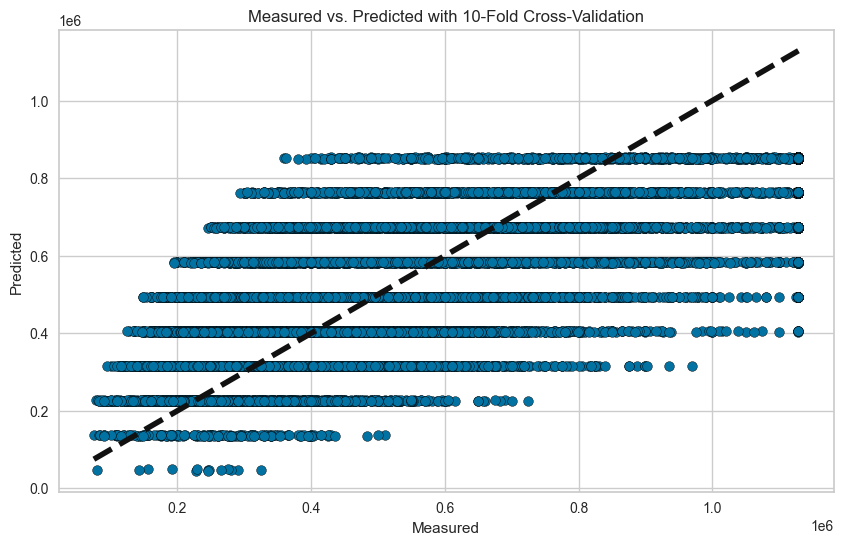

In [59]:
# Using the discretized data

# Copy the Data Frame
df_simple_regression = combined_df_discretized.copy()

# Let's try to create a simple regression model where sqft_living is used to determine the house price.
feature_cols = ['sqft_living']
X = df_simple_regression[feature_cols[0]].values.reshape(-1,1)
y = df_simple_regression['price'].values

# Create the linear regression model
model = LinearRegression()

# Perform 10-fold cross-validation
scores = cross_val_score(model, X, y, cv=10)
print(f'Cross validated scores: {scores}')

# Perform 10-fold cross-validation
predicted = cross_val_predict(model, X, y, cv=10)

# Calculate Residual Sum of Squares(RSS)
residuals = y - predicted
rss = np.sum(residuals ** 2)

# Calculate Mean Squared Error(MSE)
mse = mean_squared_error(y, predicted)

# Calculate R2 Score
r2 = r2_score(y, predicted)

print("Mean Squared Error for the Linear Regression Model:", mse)
print("Mean R-squared Score for the Linear Regression Model:", r2)
print("Mean RSS Score for the Linear Regression Model:", rss)

# Plot the results
plt.figure(figsize=(10, 6))
plt.scatter(y, predicted, edgecolors=(0, 0, 0))
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title('Measured vs. Predicted with 10-Fold Cross-Validation')
plt.show()

##### Cross-Validation ✅ 
##### Discretized Data ❌
##### Polynomial ❌

Cross validated scores: [0.47038278 0.4716692  0.43908122 0.46084083 0.42500167 0.485747
 0.47598304 0.47310272 0.47342348 0.49564992]
Mean Squared Error for the Linear Regression Model: 33164940312.440857
Mean R-squared Score for the Linear Regression Model: 0.46964580022399405
Mean RSS Score for the Linear Regression Model: 710492516313420.5


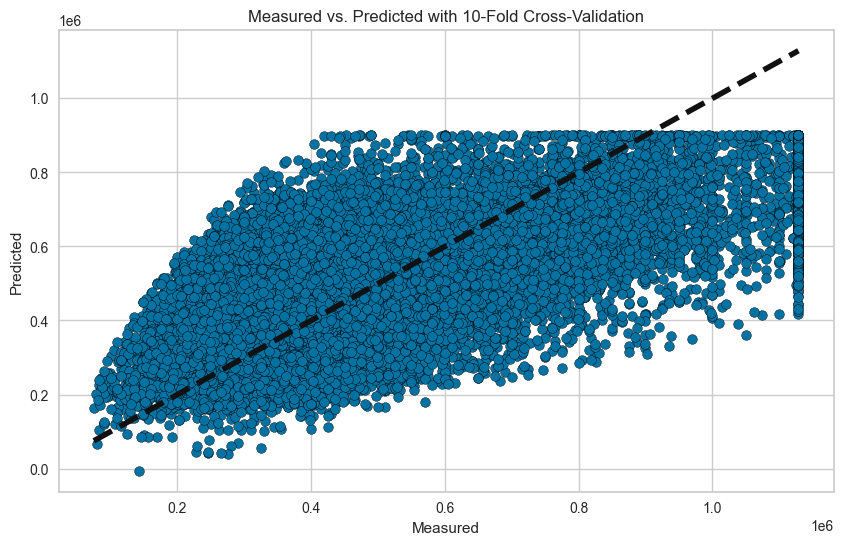

In [60]:
# Using the non-discretized data

# Copy the Data Frame
df_simple_regression = combined_df_non_discretized.copy()

# Let's try to create a simple regression model where sqft_living is used to determine the house price.
X = df_simple_regression['sqft_living'].values.reshape(-1,1)
y = df_simple_regression['price'].values

# Create the linear regression model
model = LinearRegression()

# Perform 10-fold cross-validation
scores = cross_val_score(model, X, y, cv=10)
print(f'Cross validated scores: {scores}')

# Perform 10-fold cross-validation
predicted = cross_val_predict(model, X, y, cv=10)

# Calculate Residual Sum of Squares(RSS)
residuals = y - predicted
rss = np.sum(residuals ** 2)

# Calculate Mean Squared Error(MSE)
mse = mean_squared_error(y, predicted)

# Calculate R2 Score
r2 = r2_score(y, predicted)

print("Mean Squared Error for the Linear Regression Model:", mse)
print("Mean R-squared Score for the Linear Regression Model:", r2)
print("Mean RSS Score for the Linear Regression Model:", rss)

# Plot the results
plt.figure(figsize=(10, 6))
plt.scatter(y, predicted, edgecolors=(0, 0, 0))
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title('Measured vs. Predicted with 10-Fold Cross-Validation')
plt.show()

Similar to cross-validation, we can create K-Fold validation to determine the model accuracy as well. It's a subset of cross-validation which we can use. The following code shows how you can use the K-Fold validation.

##### Cross-Validation ✅ (with K-Fold)
##### Discretized Data ✅ 
##### Polynomial ❌

Mean Squared Error for the Linear Regression Model: 34299910261.79118
Mean R-squared Score for the Linear Regression Model: 0.45117968837126776
Mean RSS Score for the Linear Regression Model: 73480694034077.06


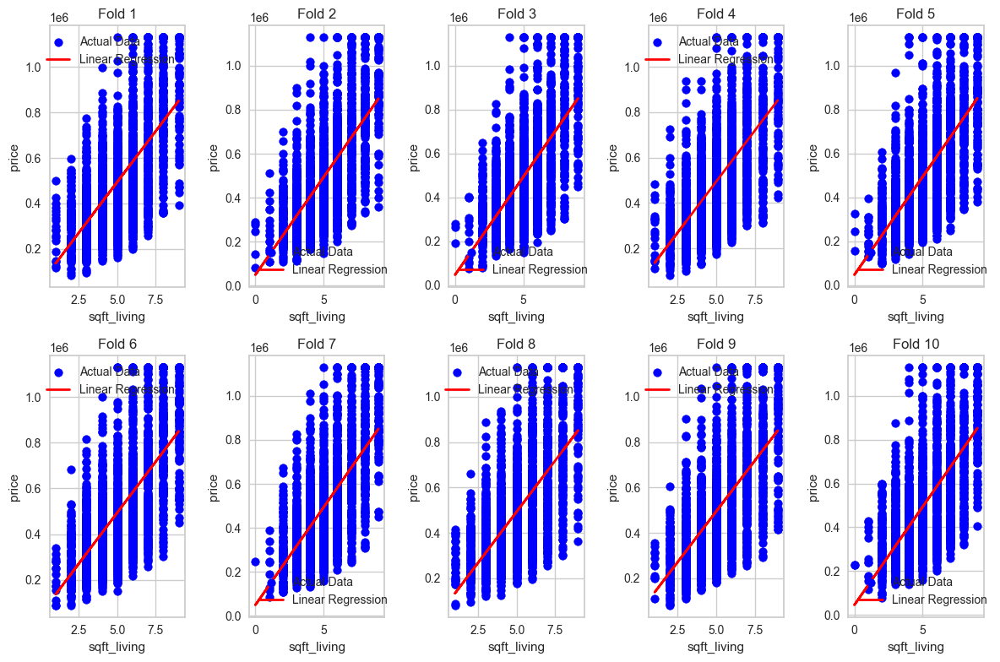

In [61]:
# Using the discretized data

# Copy the data frame
df_simple_regression = combined_df_discretized.copy()

# Let's try to create a simple regression model where sqft_living is used to determine the house price.
X = df_simple_regression[['sqft_living']]
y = df_simple_regression[['price']]

# Initialize the KFold with 10 splits
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Create lists to store the MSE, RSS, and R2 values for each fold
mse_values = []
rss_values = []
r2_values = []

# Create a figure for plotting
plt.figure(figsize=(12, 8))

# Loop through each fold
for i, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Creating the Linear Regression model
    model = LinearRegression()
    
    # Training the model on the training data
    model.fit(X_train, y_train)
    
    # Making predictions on the testing data
    y_pred = model.predict(X_test)
    
    # Calculating the Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, y_pred)
    mse_values.append(mse)
    
    # Calculating the Residual Sum of Squares (RSS)
    rss = np.sum((y_test - y_pred) ** 2)
    rss_values.append(rss)

    # Calculating the R2 score
    r2 = r2_score(y_test, y_pred)
    r2_values.append(r2)
    
    # Plotting the data and the linear regression line for each fold
    plt.subplot(2, 5, i + 1)
    plt.scatter(X_test, y_test, color='blue', label='Actual Data')
    plt.plot(X_test, y_pred, color='red', linewidth=2, label='Linear Regression')
    plt.title(f'Fold {i+1}')
    plt.xlabel('sqft_living')
    plt.ylabel('price')
    plt.legend()
    
# Calculate the average MSE, R2-squared, and RSS
avg_mse = np.mean(mse_values)
avg_r2 = np.mean(r2_values)
avg_rss = np.mean(rss_values)

# Print the average MSE, R2-squared, and RSS
print("Mean Squared Error for the Linear Regression Model:", avg_mse)
print("Mean R-squared Score for the Linear Regression Model:", avg_r2)
print("Mean RSS Score for the Linear Regression Model:", avg_rss)

# Show the plot
plt.tight_layout()
plt.show()

##### Cross-Validation ✅ (with K-Fold)
##### Discretized Data ❌
##### Polynomial ❌

Mean Squared Error for the Linear Regression Model: 33161607191.25811
Mean R-squared Score for the Linear Regression Model: 0.469440172086121
Mean RSS Score for the Linear Regression Model: 71042090636369.53


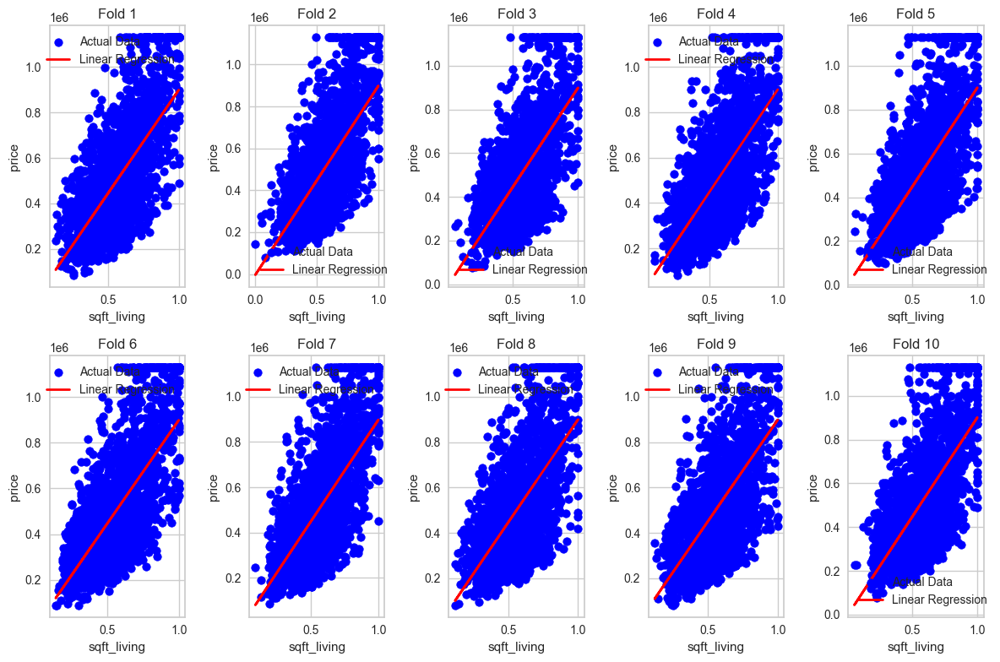

In [62]:
# Using the non-discretized data

# Copy the data frame
df_simple_regression = combined_df_non_discretized.copy()

# Let's try to create a simple regression model where sqft_living is used to determine the house price.
X = df_simple_regression[['sqft_living']]
y = df_simple_regression[['price']]

# Initialize the KFold with 10 splits
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Create lists to store the MSE, RSS, and R2 values for each fold
mse_values = []
rss_values = []
r2_values = []

# Create a figure for plotting
plt.figure(figsize=(12, 8))

# Loop through each fold
for i, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Creating the Linear Regression model
    model = LinearRegression()
    
    # Training the model on the training data
    model.fit(X_train, y_train)
    
    # Making predictions on the testing data
    y_pred = model.predict(X_test)
    
    # Calculating the Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, y_pred)
    mse_values.append(mse)
    
    # Calculating the Residual Sum of Squares (RSS)
    rss = np.sum((y_test - y_pred) ** 2)
    rss_values.append(rss)

    # Calculating the R2 score
    r2 = r2_score(y_test, y_pred)
    r2_values.append(r2)
    
    # Plotting the data and the linear regression line for each fold
    plt.subplot(2, 5, i + 1)
    plt.scatter(X_test, y_test, color='blue', label='Actual Data')
    plt.plot(X_test, y_pred, color='red', linewidth=2, label='Linear Regression')
    plt.title(f'Fold {i+1}')
    plt.xlabel('sqft_living')
    plt.ylabel('price')
    plt.legend()
    
# Calculate the average MSE, R-squared, and RSS
avg_mse = np.mean(mse_values)
avg_rss = np.mean(rss_values)
avg_r2 = np.mean(r2_values)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Linear Regression Model:", avg_mse)
print("Mean R-squared Score for the Linear Regression Model:", avg_r2)
print("Mean RSS Score for the Linear Regression Model:", avg_rss)

# Show the plot
plt.tight_layout()
plt.show()

You can see that, whatever the feature, the accuracy given by Simple Linear Regression is low. Therefore, we need to use multiple features with the **Multiple Regression**.

#### Step 2 - Multiple Regression
When we discussed the Simple Linear Regression, we were only talking about one input(`sqft_living`) in our dataset. But, often a `price` is determined by multiple variables. To address those cases, we need to create a linear regression model which supports multiple features. To support this model, we cannot simply use the function we used for a line, we need to use a **polynomial** to address this. A polynomial will be of this form.
$$f(x) = w_0 + w_1x+ w_2x^2 + ... +w_px^p$$

Now we have powers of $x$ in this function. Therefore, in contrast to our simple linear regression model, we can consider these powers as features.
$$feature_1 =1$$
$$feature_2 = x$$
$$feature_3 = x^2$$

And we can determine the values of the coefficients of these powers of $x$ and determine the best fit. Let's plug this polynomial into our model function, $y_i = f(x_i) + \epsilon_i$. Then we get,

$$y_i = w_0 + w_1x_i + w_2x_i^2 + ... + w_px_i^p + \epsilon_i$$

But if you consider a detrending time series, the function won't always have the powers of a variable. It can be something like this,
$$y_i = w_0 + w_1t_i + w_2 sin(\frac{2 \pi t_i}{12} - \phi) + \epsilon_i$$
Therefore, it doesn't necessarily mean, the function will look like this, $y_i = w_0 + w_1x_i + w_2x_i^2 + ... + w_px_i^p + \epsilon_i$. Therefore, we can generalize it with another function named $h(x)$.

$$y_i = w_0h_0(x_i) + w_1h_1(x_i) + ... + w_Dh_D(x_i) + \epsilon_i$$
$$y_i = \sum_{j=0}^{D}w_jh_j(x_i) + \epsilon_i$$

Now, the features would be,
$$feature_1 =h_0(x)$$
$$feature_2 = h_1(x)$$
$$feature_3 = h_2(x)$$

We will check the **Multiple Regression** first with `train_test_split` method, cross-validation method and K-fold validation methods.

##### Cross-Validation ❌
##### Discretized Data ✅ 
##### Polynomial ❌

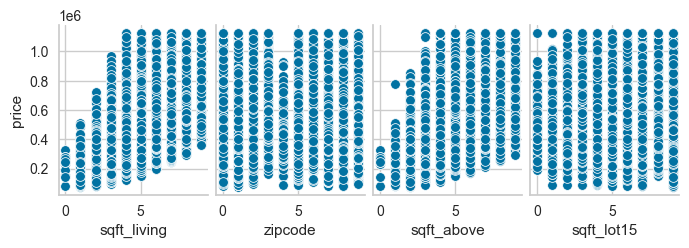

In [63]:
# First, let's get the relationships between features and target
sns.pairplot(combined_df_discretized, x_vars=['sqft_living','zipcode','sqft_above', 'sqft_lot15'], y_vars='price', aspect=0.7)

In [64]:
# Using the discretized data

# Copy the Data Frame
df_multiple_regression = combined_df_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_multiple_regression[feature_cols]
y = df_multiple_regression[['price']]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the regression model
model = LinearRegression()
model.fit(X, y)

# Predict on the test set
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Multiple Regression Model:", mse)
print("Mean R-squared Score for the Multiple Regression Model:", r2)
print("Mean RSS Score for the Multiple Regression Model:", rss.values[0])

# Coefficients of the Regression Model
print(f"\nCoefficients of the Regression Model")
for i in range(len(feature_cols)):
    print(f'{feature_cols[i]} :{model.coef_[0][i]}')
# Intercept of the Regression Model
print(f'\nIntercept of the Regression Model: {model.intercept_}')

Mean Squared Error for the Multiple Regression Model: 32602876884.453697
Mean R-squared Score for the Multiple Regression Model: 0.4789317267162789
Mean RSS Score for the Multiple Regression Model: 139703327449884.1

Coefficients of the Regression Model
sqft_living :82836.1028952882
zipcode :9633.25775164186
sqft_above :13319.79673151848
sqft_lot15 :-5804.887893708661

Intercept of the Regression Model: [13581.38890463]


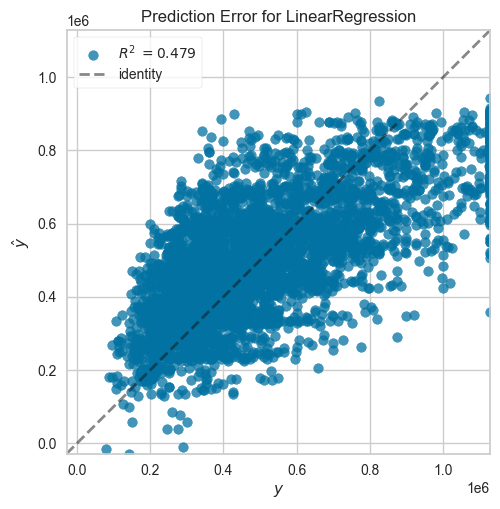

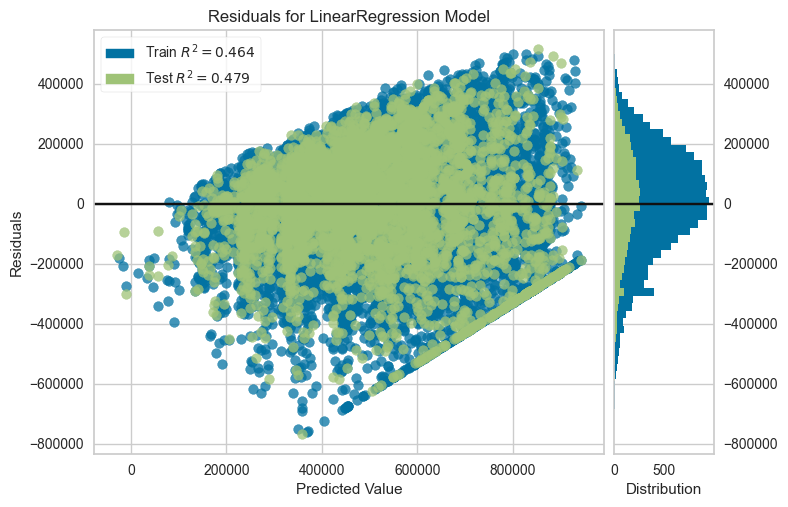

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [65]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

##### Cross-Validation ❌
##### Discretized Data ❌
##### Polynomial ❌

In [66]:
# Using the non-discretized data

# Copy the Data Frame
df_multiple_regression = combined_df_non_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_multiple_regression[feature_cols]
y = df_multiple_regression[['price']]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the regression model
model = LinearRegression()
model.fit(X, y)

# Predict on the test set
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Multiple Regression Model:", mse)
print("Mean R-squared Score for the Multiple Regression Model:", r2)
print("Mean RSS Score for the Multiple Regression Model:", rss.values[0])

# Coefficients of the Regression Model
print(f"\nCoefficients of the Regression Model")
for i in range(len(feature_cols)):
    print(f'{feature_cols[i]} :{model.coef_[0][i]}')
# Intercept of the Regression Model
print(f'\nIntercept of the Regression Model: {model.intercept_}')

Mean Squared Error for the Multiple Regression Model: 31556936103.855614
Mean R-squared Score for the Multiple Regression Model: 0.4956482440480102
Mean RSS Score for the Multiple Regression Model: 135221471205021.31

Coefficients of the Regression Model
sqft_living :906277.684028525
zipcode :92860.68748574676
sqft_above :57212.792798844304
sqft_lot15 :-65068.85019228959

Intercept of the Regression Model: [-35586.91726085]


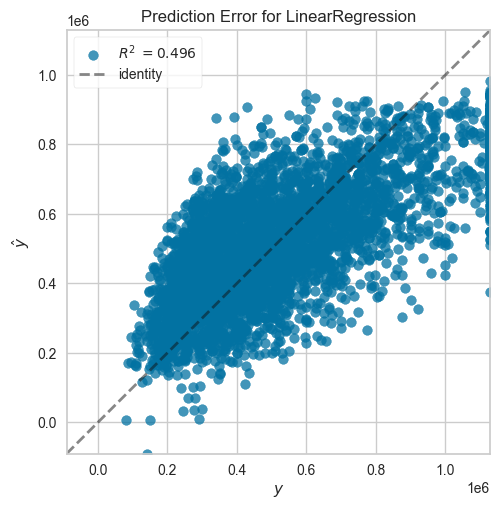

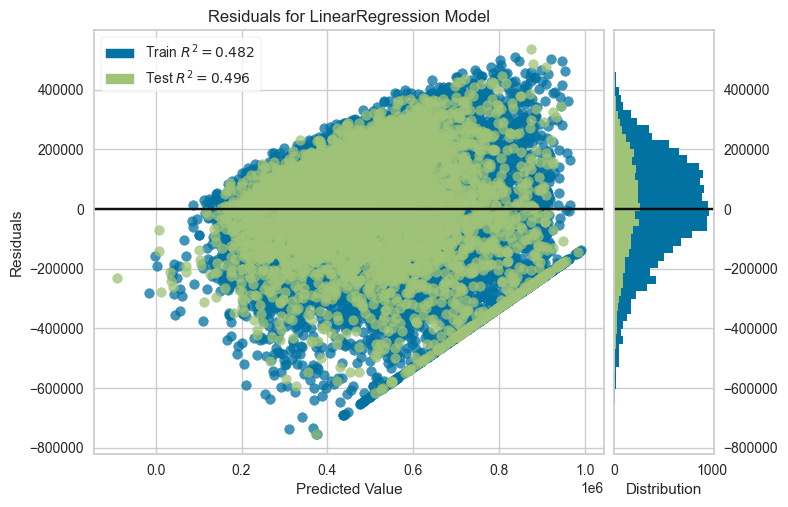

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [67]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

Now, let's check how you can use the K-Fold Cross-validation with Multiple Regression. Here, we won't check both ways to use the cross-validation, since we already looked at them.

##### Cross-Validation ✅
##### Discretized Data ✅ 
##### Polynomial ❌

In [68]:
# Using the discretized data

# Copy the Data Frame
df_multiple_regression = combined_df_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_multiple_regression[feature_cols]
y = df_multiple_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Create linear regeression model
model = LinearRegression()

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Get the cross-validation scores
scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
print(f'Cross Validation R-squared Scores: {scores}')

scores = cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=kf)
print(f'Cross Validation N-MSE Scores: {scores}')

Cross Validation R-squared Scores: [0.46554773 0.46116219 0.46507382 0.43485542 0.48371104 0.46309947
 0.46725994 0.46917346 0.47341385 0.44566612]
Cross Validation N-MSE Scores: [-3.39155264e+10 -3.43014318e+10 -3.25053680e+10 -3.47194839e+10
 -3.27021509e+10 -3.42725913e+10 -3.29985819e+10 -3.48678168e+10
 -3.32136281e+10 -3.19865436e+10]


In [69]:
# Hyperparameter tuning using grid-search cross-validation
# Specify hyperparameters
hyper_params = [{'n_features_to_select':list(range(1, len(X_train.columns)+1))}]

# Perform grid-search
model = LinearRegression()
model.fit(X_train, y_train)
rfe = RFE(model)

# call GridSearchCV
gscv = GridSearchCV(estimator=rfe, param_grid=hyper_params, scoring='r2', cv=kf, verbose=1,return_train_score=True)

# Fit the model
gscv.fit(X_train, y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [70]:
# GridSearchCV results
res = pd.DataFrame(gscv.cv_results_)
res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.003381,0.000336,0.000811,0.000107,1,{'n_features_to_select': 1},0.445803,0.445448,0.443976,0.419699,...,0.448842,0.451435,0.446492,0.447078,0.447987,0.446926,0.447802,0.449864,0.448373,0.001406
1,0.003694,0.001596,0.001169,0.000647,2,{'n_features_to_select': 2},0.446938,0.447454,0.444533,0.421051,...,0.450498,0.453007,0.447826,0.448596,0.449562,0.448612,0.449249,0.451509,0.449927,0.001449
2,0.002887,0.001173,0.000885,0.000404,3,{'n_features_to_select': 3},0.463048,0.460271,0.460479,0.433282,...,0.461550,0.464464,0.459102,0.461221,0.460966,0.460756,0.460399,0.463366,0.461462,0.001421
3,0.002932,0.001588,0.001109,0.000592,4,{'n_features_to_select': 4},0.465548,0.461162,0.465074,0.434855,...,0.463564,0.466812,0.461442,0.463671,0.463302,0.463047,0.462615,0.465439,0.463736,0.001403


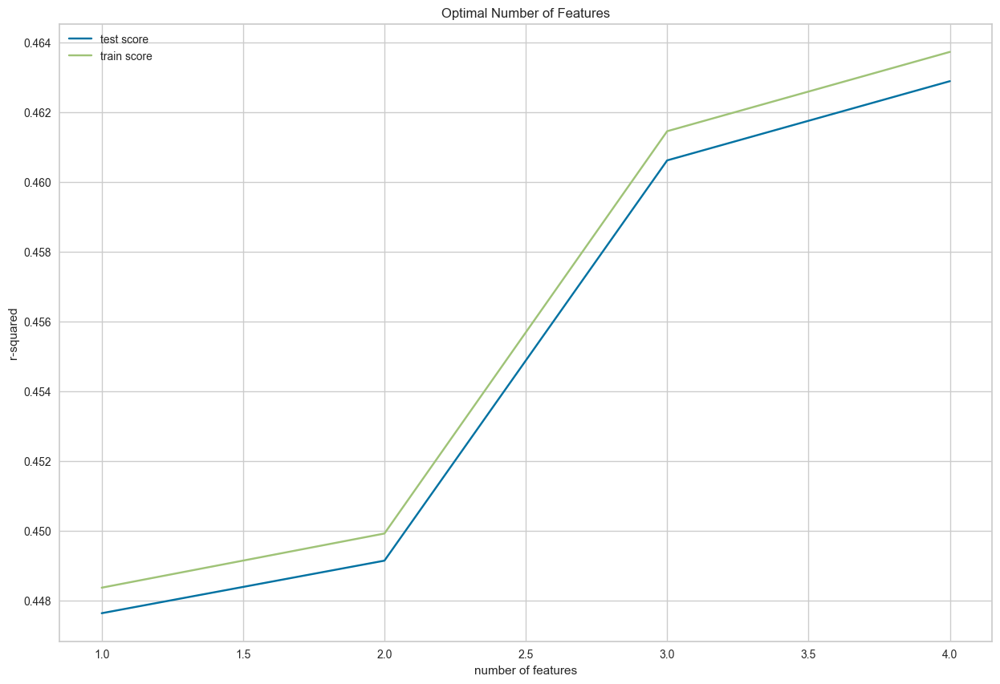

In [71]:
# Plotting the GridSearchCV results
plt.figure(figsize=(15,10))
plt.plot(res["param_n_features_to_select"], res["mean_test_score"])
plt.plot(res["param_n_features_to_select"], res["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='best')

As you can see the best value for R-squared is obtained when the number of features is equal to 5. Therefore, the optimal number of features is 5.

In [72]:
# Now we can choose the optimal value number of features and build a model
n_features_optimal = 4

# Create a LinearRegression object
model = LinearRegression()
model.fit(X_train, y_train)

rfe = RFE(model, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Multiple Regression Model:", mse)
print("Mean R-squared Score for the Multiple Regression Model:", r2)
print("Mean RSS Score for the Multiple Regression Model:", rss.values[0])

Mean Squared Error for the Multiple Regression Model: 32625033322.878036
Mean R-squared Score for the Multiple Regression Model: 0.478577616336609
Mean RSS Score for the Multiple Regression Model: 139798267788532.39


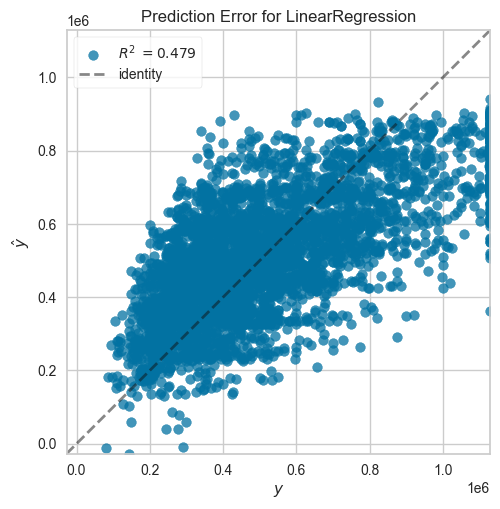

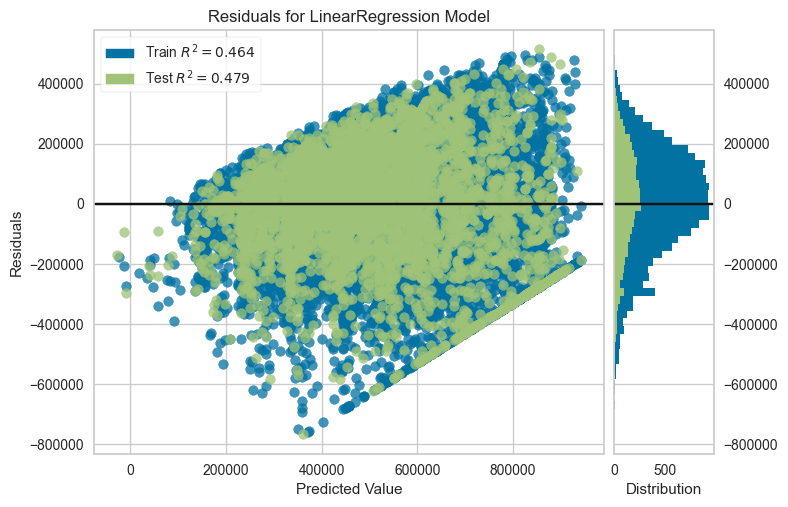

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [73]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

##### Cross-Validation ✅
##### Discretized Data ❌ 
##### Polynomial ❌

In [74]:
# Using the non-discretized data

# Copy the Data Frame
df_multiple_regression = combined_df_non_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_multiple_regression[feature_cols]
y = df_multiple_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Create linear regeression model
model = LinearRegression()

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Get the cross-validation scores
scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
print(f'Cross Validation R-squared Scores: {scores}')

scores = cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=kf)
print(f'Cross Validation N-MSE Scores: {scores}')

Cross Validation R-squared Scores: [0.48955403 0.47825862 0.4823656  0.45282809 0.50444787 0.48196721
 0.48917331 0.47981202 0.491005   0.46279841]
Cross Validation N-MSE Scores: [-3.23921237e+10 -3.32131040e+10 -3.14546144e+10 -3.36153387e+10
 -3.13886636e+10 -3.30681850e+10 -3.16412405e+10 -3.41690131e+10
 -3.21040931e+10 -3.09979649e+10]


In [75]:
# Hyperparameter tuning using grid-search cross-validation
# Specify hyperparameters
hyper_params = [{'n_features_to_select':list(range(1, len(X_train.columns)+1))}]

# Perform grid-search
model = LinearRegression()
model.fit(X_train, y_train)
rfe = RFE(model)

# call GridSearchCV
gscv = GridSearchCV(estimator=rfe, param_grid=hyper_params, scoring='r2', cv=kf, verbose=1,return_train_score=True)

# Fit the model
gscv.fit(X_train, y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [76]:
# GridSearchCV results
res = pd.DataFrame(gscv.cv_results_)
res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.003363,0.000305,0.000812,0.000094,1,{'n_features_to_select': 1},0.469691,0.462652,0.460857,0.436981,...,0.467723,0.470278,0.464756,0.465651,0.466258,0.466395,0.466480,0.468803,0.467061,0.001511
1,0.002750,0.000014,0.000772,0.000092,2,{'n_features_to_select': 2},0.485871,0.475465,0.476523,0.449580,...,0.478626,0.481515,0.475878,0.478081,0.477485,0.478473,0.477560,0.480446,0.478435,0.001507
2,0.002303,0.000069,0.000755,0.000027,3,{'n_features_to_select': 3},0.486081,0.476721,0.476868,0.451865,...,0.479334,0.484533,0.478911,0.478812,0.478179,0.479217,0.478193,0.481183,0.479850,0.001956
3,0.002225,0.000833,0.001157,0.000843,4,{'n_features_to_select': 4},0.489554,0.478259,0.482366,0.452828,...,0.481981,0.485158,0.479477,0.481917,0.481213,0.482253,0.481002,0.483868,0.482043,0.001495


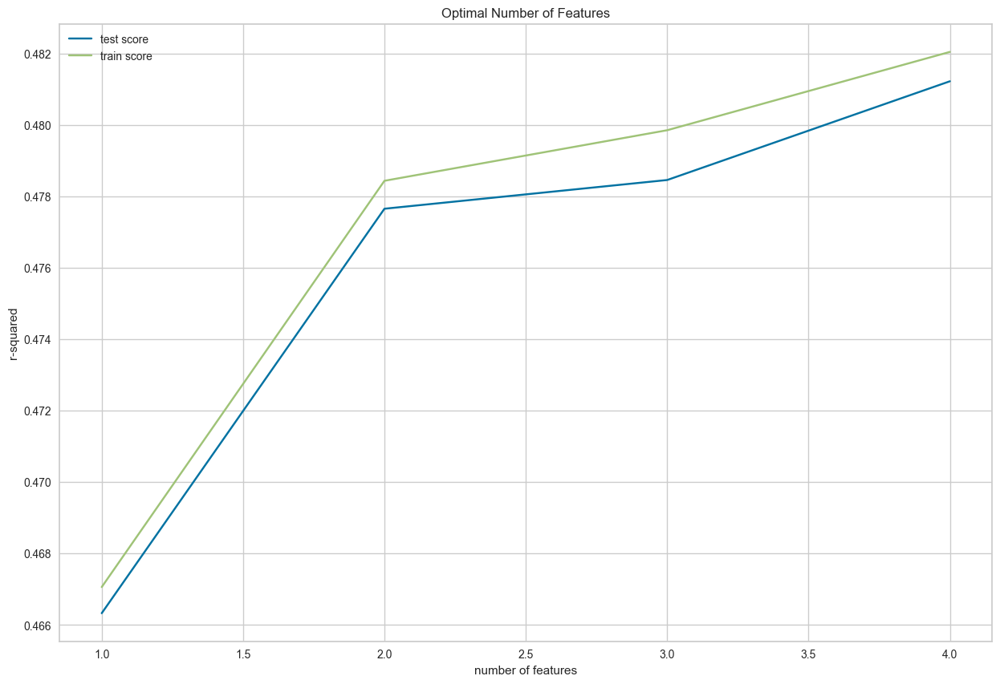

In [77]:
# Plotting the GridSearchCV results
plt.figure(figsize=(15,10))
plt.plot(res["param_n_features_to_select"], res["mean_test_score"])
plt.plot(res["param_n_features_to_select"], res["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='best')

As you can see the best value for R-squared is obtained when the number of features is equal to 5. Therefore, the optimal number of features is 5.

In [78]:
# Now we can choose the optimal value number of features and build a model
n_features_optimal = 4

# Create a LinearRegression object
model = LinearRegression()
model.fit(X_train, y_train)

rfe = RFE(model, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Multiple Regression Model:", mse)
print("Mean R-squared Score for the Multiple Regression Model:", r2)
print("Mean RSS Score for the Multiple Regression Model:", rss.values[0])

Mean Squared Error for the Multiple Regression Model: 31569438861.01811
Mean R-squared Score for the Multiple Regression Model: 0.49544842149526325
Mean RSS Score for the Multiple Regression Model: 135275045519462.6


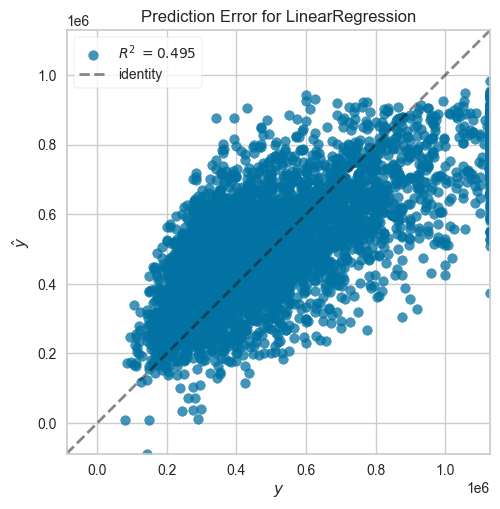

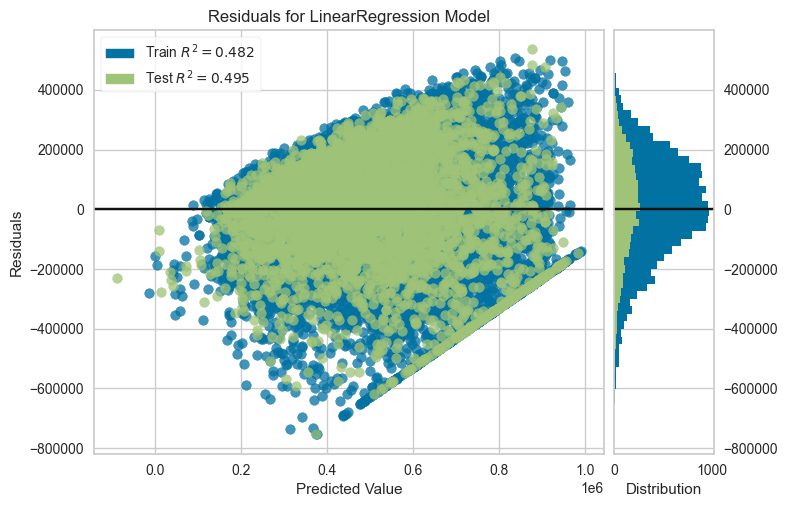

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [79]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

##### Cross-Validation ✅
##### Discretized Data ✅ 
##### Polynomial ✅

In [80]:
# Using the discretized data

# Copy the Data Frame
df_multiple_regression = combined_df_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_multiple_regression[feature_cols]
y = df_multiple_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

degrees = range(1,7)
r2_scores_mean = []

# Enumerate and find the best polynomial degree with the Linear Regression
for i, degree in enumerate(degrees):
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    # Get the cross-validation scores
    scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
    print(f'Cross Validation R-squared Scores for Polynomial Degree {degree}: {scores}')
    r2_scores_mean.append((degree, np.mean(scores)))

# Find the best degree
best_degree = sorted(r2_scores_mean, key=lambda x:x[1], reverse=True)[0][0]
print(f'Best polynomial degree: {best_degree}')

Cross Validation R-squared Scores for Polynomial Degree 1: [0.46554773 0.46116219 0.46507382 0.43485542 0.48371104 0.46309947
 0.46725994 0.46917346 0.47341385 0.44566612]
Cross Validation R-squared Scores for Polynomial Degree 2: [0.52865698 0.51686709 0.52134739 0.48748729 0.53877634 0.52935376
 0.54552015 0.51985385 0.52662297 0.50732591]
Cross Validation R-squared Scores for Polynomial Degree 3: [0.5571381  0.53722249 0.54650016 0.51227003 0.56132646 0.54493318
 0.55042386 0.55092452 0.5495102  0.52674211]
Cross Validation R-squared Scores for Polynomial Degree 4: [0.57440637 0.57158715 0.57596733 0.54169458 0.58616741 0.56663809
 0.58397982 0.57205429 0.57039118 0.56080171]
Cross Validation R-squared Scores for Polynomial Degree 5: [0.58806333 0.5897707  0.58572078 0.55835279 0.60431147 0.56669195
 0.59412978 0.59106978 0.5834521  0.56603039]
Cross Validation R-squared Scores for Polynomial Degree 6: [0.5964757  0.58971361 0.59539429 0.56419793 0.61049313 0.57279481
 0.58950596 0.

In [81]:
# Hyperparameter tuning using grid-search cross-validation
# Specify hyperparameters
hyper_params = [{'n_features_to_select':list(range(1, len(X_train.columns)+1))}]

# Perform grid-search
poly = PolynomialFeatures(degree=4)
X_poly_train = poly.fit_transform(X_train)
X_poly_test = poly.transform(X_test)

model = LinearRegression()
model.fit(X_poly_train, y_train)
rfe = RFE(model)

# call GridSearchCV
gscv = GridSearchCV(estimator=rfe, param_grid=hyper_params, scoring='r2', cv=kf, verbose=1,return_train_score=True)

# Fit the model
gscv.fit(X_poly_train, y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [82]:
# GridSearchCV results
res = pd.DataFrame(gscv.cv_results_)
res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.685763,0.044303,0.000786,0.000303,1,{'n_features_to_select': 1},0.445803,0.445448,0.443976,0.419699,...,0.448842,0.451435,0.446492,0.447078,0.447987,0.446926,0.447802,0.449864,0.448373,0.001406
1,0.913106,0.083351,0.000680,0.000009,2,{'n_features_to_select': 2},0.446938,0.477801,0.471952,0.445935,...,0.480467,0.483255,0.459425,0.448596,0.478320,0.448612,0.478550,0.459540,0.466682,0.013928
2,0.917262,0.022671,0.000729,0.000117,3,{'n_features_to_select': 3},0.463048,0.482991,0.483661,0.452382,...,0.487651,0.491014,0.479003,0.454371,0.485927,0.460756,0.485939,0.461659,0.475528,0.013510
3,0.935540,0.024761,0.000798,0.000309,4,{'n_features_to_select': 4},0.465548,0.483636,0.489901,0.452584,...,0.491820,0.491610,0.486235,0.474256,0.486505,0.463047,0.490138,0.477837,0.481320,0.010517


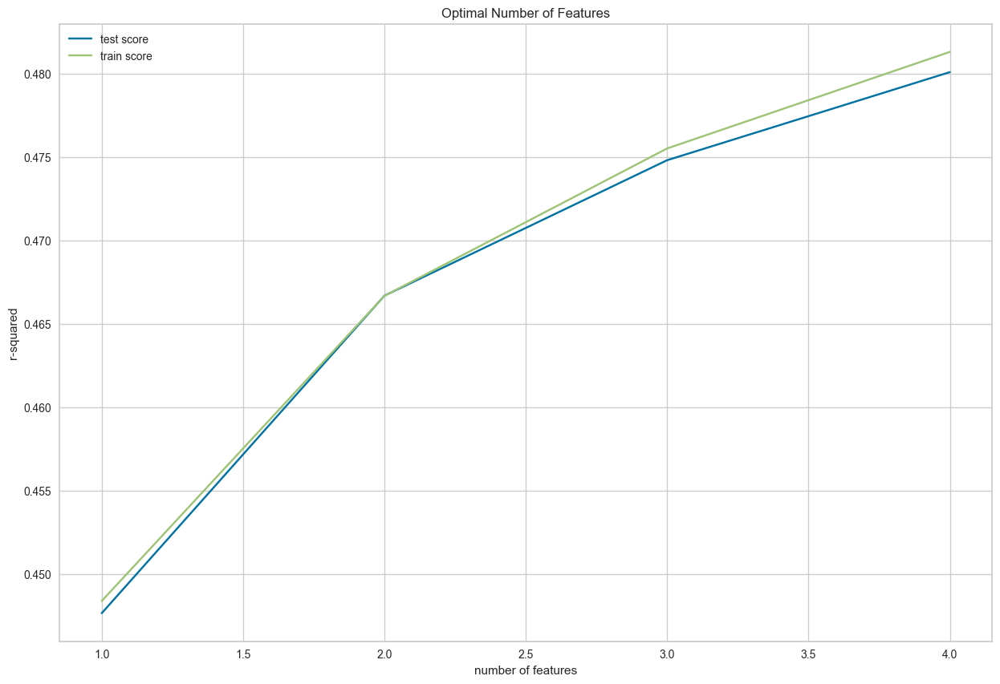

In [83]:
# Plotting the GridSearchCV results
plt.figure(figsize=(15,10))
plt.plot(res["param_n_features_to_select"], res["mean_test_score"])
plt.plot(res["param_n_features_to_select"], res["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='best')

As you can see the best value for R-squared is obtained when the number of features is equal to 5. Therefore,the optimal number of features is 5.

In [84]:
# Now we can choose the optimal value number of features and build a model
n_features_optimal = 4

# Create a pipeline
model = make_pipeline(PolynomialFeatures(degree=4),LinearRegression())
model.fit(X_train, y_train)

rfe = RFE(model, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Polynomial Regression Model:", mse)
print("Mean R-squared Score for the Polynomial Regression Model:", r2)
print("Mean RSS Score for the Polynomial Regression Model:", rss.values[0])

Mean Squared Error for the Polynomial Regression Model: 25171921059.061794
Mean R-squared Score for the Polynomial Regression Model: 0.597695335661197
Mean RSS Score for the Polynomial Regression Model: 107861681738079.78


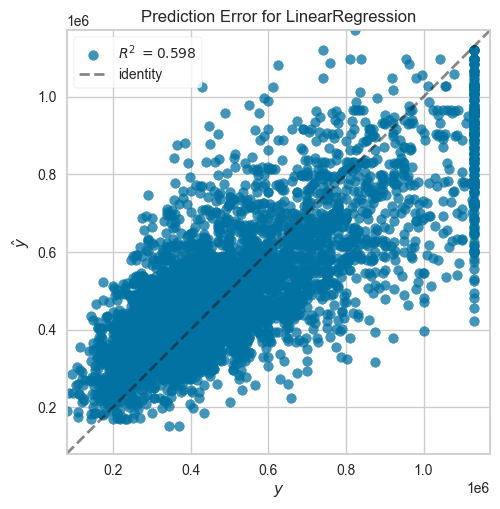

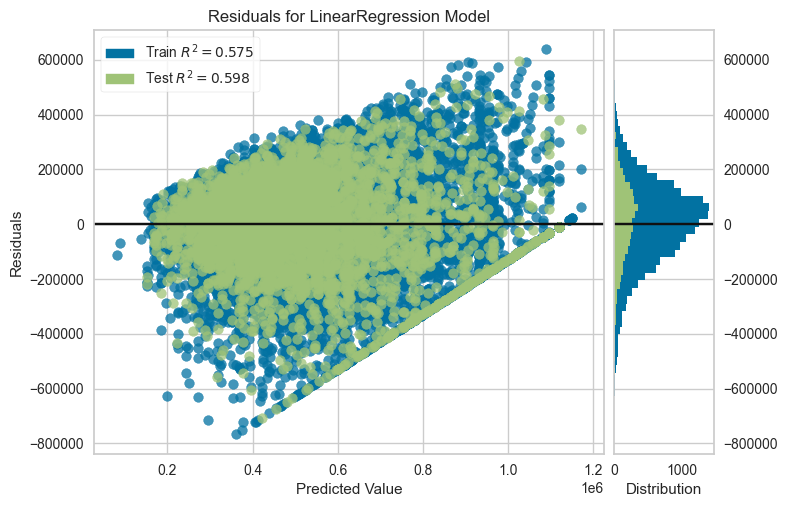

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [85]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

##### Cross-Validation ✅
##### Discretized Data ❌ 
##### Polynomial ✅

In [86]:
# Using the non-discretized data

# Copy the Data Frame
df_multiple_regression = combined_df_non_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_multiple_regression[feature_cols]
y = df_multiple_regression[['price']]


# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

degrees = range(1,7)
r2_scores_mean = []

for i, degree in enumerate(degrees):
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    # Get the cross-validation scores
    scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
    print(f'Cross Validation R-squared Scores for Polynomial Degree {degree}: {scores}')
    r2_scores_mean.append((degree, np.mean(scores)))

# Find the best degree
best_degree = sorted(r2_scores_mean, key=lambda x:x[1], reverse=True)[0][0]
print(f'Best polynomial degree: {best_degree}')

Cross Validation R-squared Scores for Polynomial Degree 1: [0.48955403 0.47825862 0.4823656  0.45282809 0.50444787 0.48196721
 0.48917331 0.47981202 0.491005   0.46279841]
Cross Validation R-squared Scores for Polynomial Degree 2: [0.55557828 0.53471877 0.5434771  0.51088956 0.55092292 0.54541441
 0.5715171  0.53513376 0.54717596 0.52506302]
Cross Validation R-squared Scores for Polynomial Degree 3: [0.56753352 0.54658467 0.55669923 0.52691097 0.5677854  0.55520528
 0.57697967 0.55280058 0.56363476 0.53840265]
Cross Validation R-squared Scores for Polynomial Degree 4: [0.58490574 0.58457223 0.59609541 0.56281957 0.59390692 0.58511856
 0.61106388 0.57535443 0.58186378 0.57632828]
Cross Validation R-squared Scores for Polynomial Degree 5: [0.59663471 0.59810928 0.6019521  0.57223465 0.60149044 0.58428813
 0.62217781 0.5881031  0.59081038 0.58459273]
Cross Validation R-squared Scores for Polynomial Degree 6: [0.59796073 0.59224148 0.60961916 0.58270248 0.61151721 0.60101837
 0.62740646 0.

We need to tune the hyper-parameters using `GridSearchCV` for this. The below code explaisn how you can do that.

In [87]:
# Hyperparameter tuning using grid-search cross-validation
# Specify hyperparameters
hyper_params = [{'n_features_to_select':list(range(1, len(X_train.columns)+1))}]

# Perform grid-search
poly = PolynomialFeatures(degree=4)
X_poly_train = poly.fit_transform(X_train)
X_poly_test = poly.transform(X_test)

model = LinearRegression()
model.fit(X_poly_train, y_train)
rfe = RFE(model)

# call GridSearchCV
gscv = GridSearchCV(estimator=rfe, param_grid=hyper_params, scoring='r2', cv=kf, verbose=1,return_train_score=True)

# Fit the model
gscv.fit(X_poly_train, y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [88]:
# GridSearchCV results
res = pd.DataFrame(gscv.cv_results_)
res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.677205,0.024429,0.000690,0.000007,1,{'n_features_to_select': 1},0.406048,0.430351,0.237324,0.382337,...,0.239936,0.425426,0.412122,0.413523,0.414112,0.415418,0.238273,0.416308,0.380384,0.070728
1,0.906089,0.075976,0.000896,0.000401,2,{'n_features_to_select': 2},0.496018,0.492576,0.254354,0.436163,...,0.255276,0.473317,0.493537,0.493463,0.491905,0.494606,0.253199,0.496498,0.444102,0.095140
2,0.920322,0.019675,0.000795,0.000307,3,{'n_features_to_select': 3},0.501496,0.499192,0.259498,0.438366,...,0.258346,0.476613,0.501469,0.501695,0.499757,0.502239,0.256334,0.504447,0.450633,0.096949
3,0.937541,0.023139,0.000751,0.000174,4,{'n_features_to_select': 4},0.500842,0.501417,0.259498,0.439139,...,0.258623,0.477128,0.503276,0.503666,0.501364,0.505261,0.475939,0.505790,0.473964,0.072602


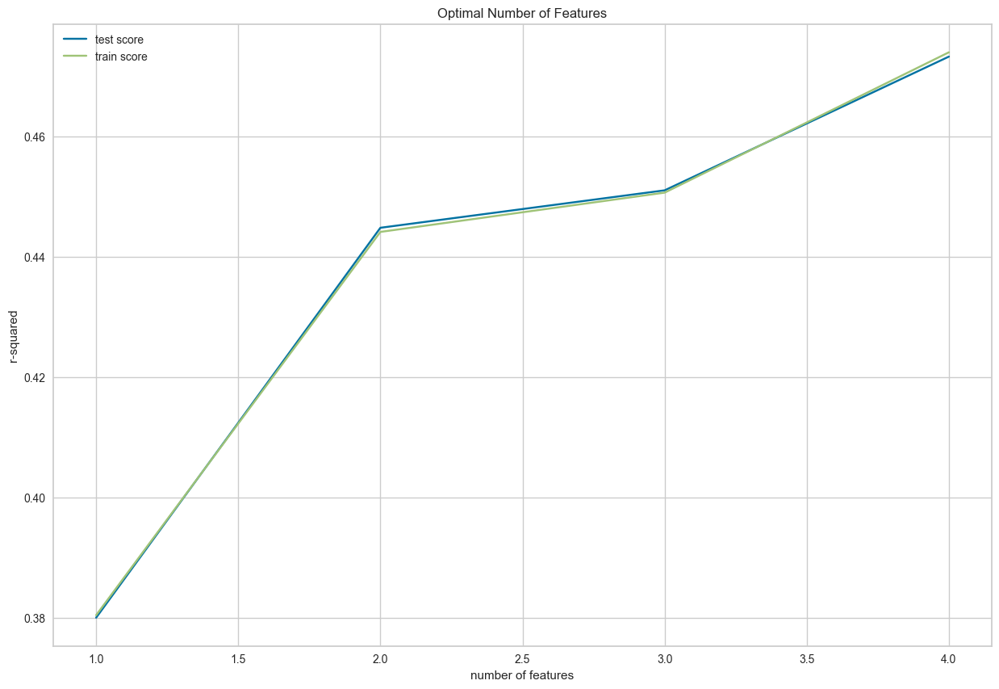

In [89]:
# Plotting the GridSearchCV results
plt.figure(figsize=(15,10))
plt.plot(res["param_n_features_to_select"], res["mean_test_score"])
plt.plot(res["param_n_features_to_select"], res["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='best')

As you can see the best value for R-squared is obtained when the number of features is equal to 5. Therefore,the optimal number of features is 5.

In [90]:
# Now we can choose the optimal value number of features and build a model
n_features_optimal = 4

# Create a pipeline
model = make_pipeline(PolynomialFeatures(degree=5),LinearRegression())
model.fit(X_train, y_train)

rfe = RFE(model, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Polynomial Regression Model:", mse)
print("Mean R-squared Score for the Polynomial Regression Model:", r2)
print("Mean RSS Score for the Polynomial Regression Model:", rss.values[0])

Mean Squared Error for the Polynomial Regression Model: 24015100994.811413
Mean R-squared Score for the Polynomial Regression Model: 0.616183956635205
Mean RSS Score for the Polynomial Regression Model: 102904707762766.9


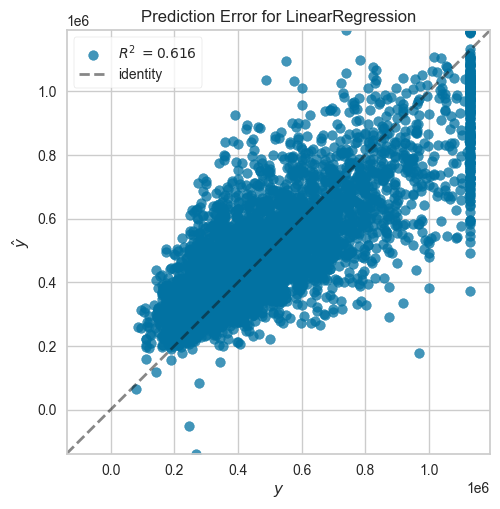

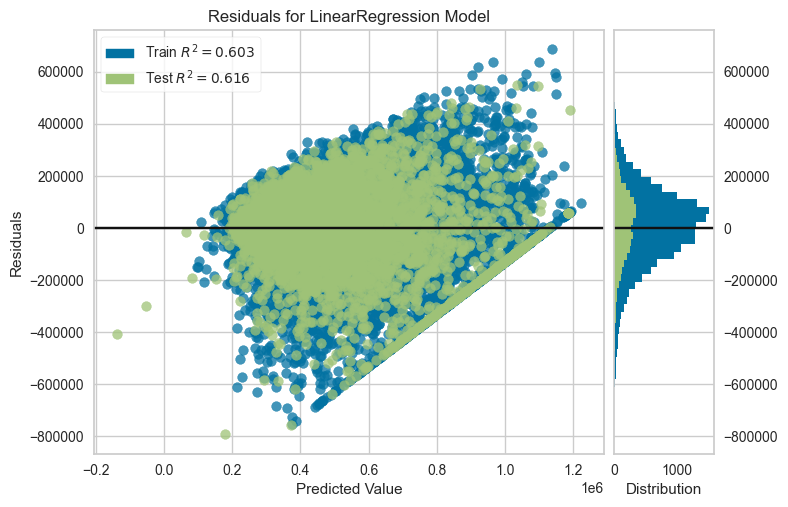

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [91]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

#### Step 3 - Ridge Regression
As shown above, the Multiple Regression models can have more accuracy than the simple regression models. Now, let's the **Ridge Regression**. Ridge Regression is a type of linear regression that is used to deal with multicollinearity and overfitting in the data. It is an extension of the Ordinary Least Squares(OLS) regression where a penalty term is added to the loss function. This penalty term is known as the L2 regularization term, or the ridge penalty.

The objective of the ridge regression can be represented as,
$$min(\sum_{i=1}^{n}(y_i - \hat{y_i})^2+\lambda\sum_{j=1}^{p}w_j^2)$$
where,
- $y_i$ - The observed value for the $i$th observation.
- $\hat{y_i}$ - The predicted value for the $i$th observation.
- $w_j$ - The coefficient of the $j$th predictor variable.
- $\lambda$ - The regularization parameter that controls the strength of the penalty.

##### Cross-Validation ✅
##### Discretized Data ✅
##### Polynomial ❌

In [92]:
# Using the discretized data

# Copy the Data Frame
df_ridge_regression = combined_df_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_ridge_regression[feature_cols]
y = df_ridge_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

r2_scores_mean = []
delta = []

for i in range(1, 500):
    # Create a ridge regression model
    model = Ridge(alpha = i * 0.1)
    model.fit(X_train, y_train)
    # Get the cross-validation scores
    scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
    print(f'Cross Validation R-squared Scores for i value {i}: {scores}')
    r2_scores_mean.append((i, np.mean(scores)))
    delta.append(i * 0.1)

# Find the best iteration and degree
best_i = sorted(r2_scores_mean, key=lambda x:x[1], reverse=True)[0][0]
print(f'Best i value: {best_i}')

Cross Validation R-squared Scores for i value 1: [0.46554771 0.46116224 0.46507378 0.43485546 0.48371107 0.4630995
 0.46725993 0.46917337 0.47341387 0.44566613]
Cross Validation R-squared Scores for i value 2: [0.46554768 0.46116229 0.46507373 0.4348555  0.48371109 0.46309953
 0.46725993 0.46917329 0.47341389 0.44566614]
Cross Validation R-squared Scores for i value 3: [0.46554765 0.46116234 0.46507368 0.43485554 0.48371112 0.46309956
 0.46725993 0.46917321 0.4734139  0.44566614]
Cross Validation R-squared Scores for i value 4: [0.46554762 0.46116238 0.46507364 0.43485558 0.48371115 0.46309959
 0.46725992 0.46917313 0.47341392 0.44566615]
Cross Validation R-squared Scores for i value 5: [0.46554759 0.46116243 0.46507359 0.43485562 0.48371118 0.46309962
 0.46725992 0.46917304 0.47341394 0.44566615]
Cross Validation R-squared Scores for i value 6: [0.46554756 0.46116248 0.46507354 0.43485566 0.4837112  0.46309965
 0.46725992 0.46917296 0.47341396 0.44566616]
Cross Validation R-squared Sc

In [93]:
# Build the Ridge Regression Model
model = Ridge(alpha = 0.1 * best_i)
model.fit(X_train, y_train)

# Evaluating the Ridge Regression Model
# predict prices of X_test
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Ridge Regression Model:", mse)
print("Mean R-squared Score for the Ridge Regression Model:", r2)
print("Mean RSS Score for the Ridge Regression Model:", rss.values[0])

Mean Squared Error for the Ridge Regression Model: 32625644395.168446
Mean R-squared Score for the Ridge Regression Model: 0.47856785000879865
Mean RSS Score for the Ridge Regression Model: 139800886233296.78


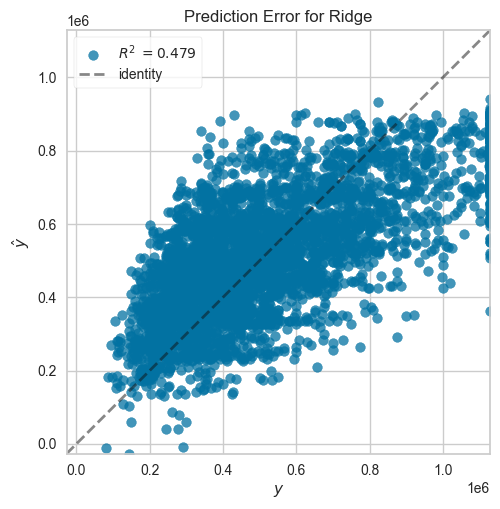

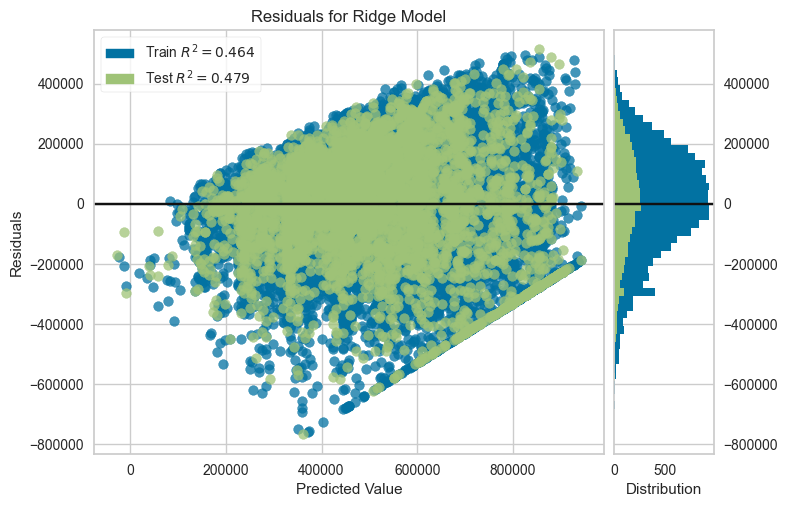

<Axes: title={'center': 'Residuals for Ridge Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [94]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

##### Cross-Validation ✅
##### Discretized Data ❌
##### Polynomial ❌

In [95]:
# Using the discretized data

# Copy the Data Frame
df_ridge_regression = combined_df_non_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_ridge_regression[feature_cols]
y = df_ridge_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

r2_scores_mean = []
delta = []

for i in range(1, 500):
    # Create a ridge regression model
    model = Ridge(alpha = i * 0.1)
    model.fit(X_train, y_train)
    # Get the cross-validation scores
    scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
    print(f'Cross Validation R-squared Scores for i value {i}: {scores}')
    r2_scores_mean.append((i, np.mean(scores)))
    delta.append(i * 0.1)

# Find the best iteration
best_i = sorted(r2_scores_mean, key=lambda x:x[1], reverse=True)[0][0]
print(f'Best i value: {best_i}')

Cross Validation R-squared Scores for i value 1: [0.48954388 0.47827079 0.48236081 0.45283521 0.50444871 0.4819686
 0.48917189 0.47980654 0.49100477 0.46279929]
Cross Validation R-squared Scores for i value 2: [0.48953365 0.47828282 0.48235591 0.45284219 0.50444943 0.48196988
 0.48917036 0.47980096 0.49100442 0.46280006]
Cross Validation R-squared Scores for i value 3: [0.48952334 0.47829472 0.48235093 0.45284905 0.50445002 0.48197105
 0.48916872 0.47979531 0.49100396 0.46280073]
Cross Validation R-squared Scores for i value 4: [0.48951294 0.47830648 0.48234585 0.45285577 0.5044505  0.48197212
 0.48916697 0.47978957 0.49100339 0.46280128]
Cross Validation R-squared Scores for i value 5: [0.48950246 0.47831811 0.48234067 0.45286237 0.50445086 0.48197309
 0.48916511 0.47978374 0.49100271 0.46280174]
Cross Validation R-squared Scores for i value 6: [0.48949189 0.4783296  0.4823354  0.45286884 0.5044511  0.48197395
 0.48916314 0.47977784 0.49100191 0.46280208]
Cross Validation R-squared Sc

In [96]:
# Build the Ridge Regression Model
model = Ridge(alpha = 0.1 * best_i)
model.fit(X_train, y_train)

# Evaluating the Ridge Regression Model
# predict prices of X_test
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Ridge Regression Model:", mse)
print("Mean R-squared Score for the Ridge Regression Model:", r2)
print("Mean RSS Score for the Ridge Regression Model:", rss.values[0])

Mean Squared Error for the Ridge Regression Model: 31570021723.33043
Mean R-squared Score for the Ridge Regression Model: 0.4954391060271921
Mean RSS Score for the Ridge Regression Model: 135277543084470.89


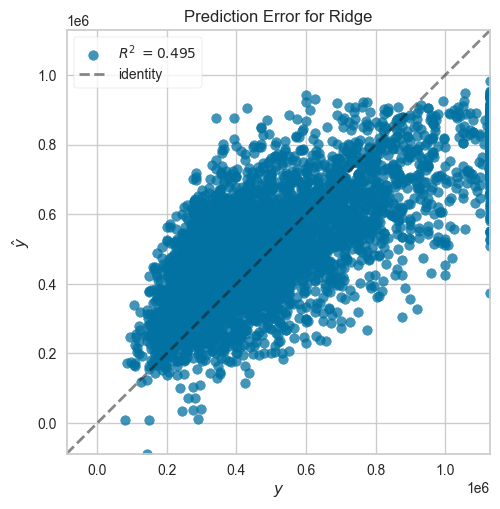

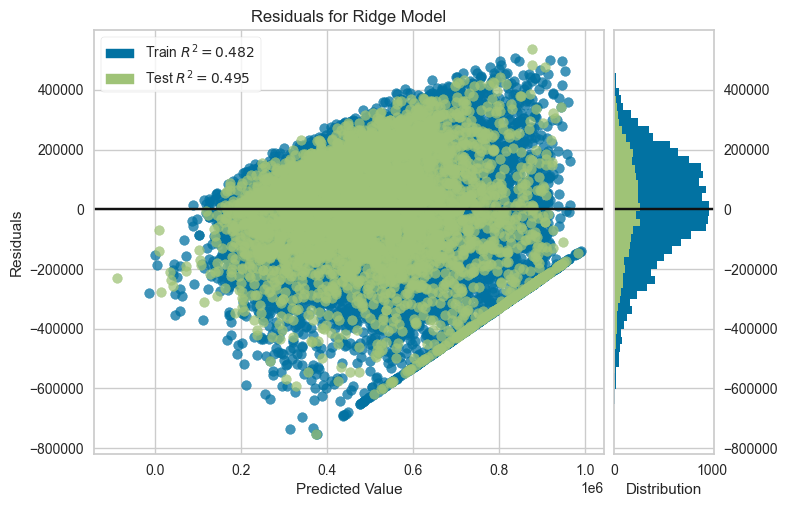

<Axes: title={'center': 'Residuals for Ridge Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [97]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

##### Cross-Validation ✅
##### Discretized Data ✅
##### Polynomial ✅

In [98]:
# Using the discretized data

# Copy the Data Frame
df_ridge_regression = combined_df_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_ridge_regression[feature_cols]
y = df_ridge_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

r2_scores_mean = []
delta = []
degrees = range(1,7)

for degree in degrees:
    for i in range(30, 50):
        # Create a ridge regression model
        model = make_pipeline(PolynomialFeatures(degree=degree), Ridge(alpha = i * 0.1))
        model.fit(X_train, y_train)
        # Get the cross-validation scores
        scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
        print(f'Cross Validation R-squared Scores for i value {i}: {scores}')
        r2_scores_mean.append((i,degree, np.mean(scores)))
        delta.append(i * 0.1)

# Find the best iteration and degree
best_i = sorted(r2_scores_mean, key=lambda x:x[2], reverse=True)[0][0]
best_degree = sorted(r2_scores_mean, key=lambda x:x[2], reverse=True)[0][1]
print(f'Best i value: {best_i}')
print(f'Best degree value: {best_degree}')

Cross Validation R-squared Scores for i value 30: [0.46554686 0.46116365 0.46507243 0.43485661 0.48371187 0.46310034
 0.46725984 0.46917097 0.47341436 0.4456663 ]
Cross Validation R-squared Scores for i value 31: [0.46554683 0.46116369 0.46507239 0.43485665 0.4837119  0.46310037
 0.46725984 0.46917089 0.47341438 0.44566631]
Cross Validation R-squared Scores for i value 32: [0.4655468  0.46116374 0.46507234 0.43485669 0.48371192 0.4631004
 0.46725983 0.46917081 0.4734144  0.44566631]
Cross Validation R-squared Scores for i value 33: [0.46554677 0.46116379 0.46507229 0.43485673 0.48371195 0.46310043
 0.46725983 0.46917073 0.47341441 0.44566632]
Cross Validation R-squared Scores for i value 34: [0.46554674 0.46116384 0.46507225 0.43485677 0.48371198 0.46310046
 0.46725983 0.46917064 0.47341443 0.44566632]
Cross Validation R-squared Scores for i value 35: [0.46554671 0.46116389 0.4650722  0.43485681 0.48371201 0.46310049
 0.46725982 0.46917056 0.47341445 0.44566633]
Cross Validation R-squa

In [99]:
# Hyperparameter tuning using grid-search cross-validation
# Specify hyperparameters
hyper_params = [{'n_features_to_select':list(range(1, len(X_train.columns)+1))}]

# Perform grid-search
poly = PolynomialFeatures(degree=best_degree)
X_poly_train = poly.fit_transform(X_train)
X_poly_test = poly.transform(X_test)

model = Ridge(alpha = 0.1 * best_i)
model.fit(X_poly_train, y_train)
rfe = RFE(model)

# call GridSearchCV
gscv = GridSearchCV(estimator=rfe, param_grid=hyper_params, scoring='r2', cv=kf, verbose=1, return_train_score=True)

# Fit the model
gscv.fit(X_poly_train, y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RFE(estimator=Ridge(alpha=3.0)),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [100]:
# GridSearchCV results
res = pd.DataFrame(gscv.cv_results_)
res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,59.979487,0.476136,0.000968,0.000401,1,{'n_features_to_select': 1},0.030406,0.027687,0.443976,0.419701,...,0.448842,0.451435,0.446492,0.447078,0.021266,0.446926,0.447802,0.449864,0.320093,0.195919
1,60.349186,0.362722,0.000936,0.000366,2,{'n_features_to_select': 2},0.438633,0.448621,0.471953,0.430740,...,0.480467,0.465120,0.477603,0.478129,0.484329,0.479102,0.478550,0.481208,0.471577,0.013812
2,61.180798,0.874423,0.000752,0.000020,3,{'n_features_to_select': 3},0.482785,0.484879,0.483662,0.445791,...,0.487651,0.484332,0.485034,0.486445,0.489203,0.487009,0.485939,0.481655,0.486253,0.002038
3,62.599695,0.617914,0.000895,0.000445,4,{'n_features_to_select': 4},0.490709,0.491622,0.489902,0.451985,...,0.491820,0.491663,0.486390,0.493659,0.490233,0.494855,0.486455,0.490501,0.491161,0.002714


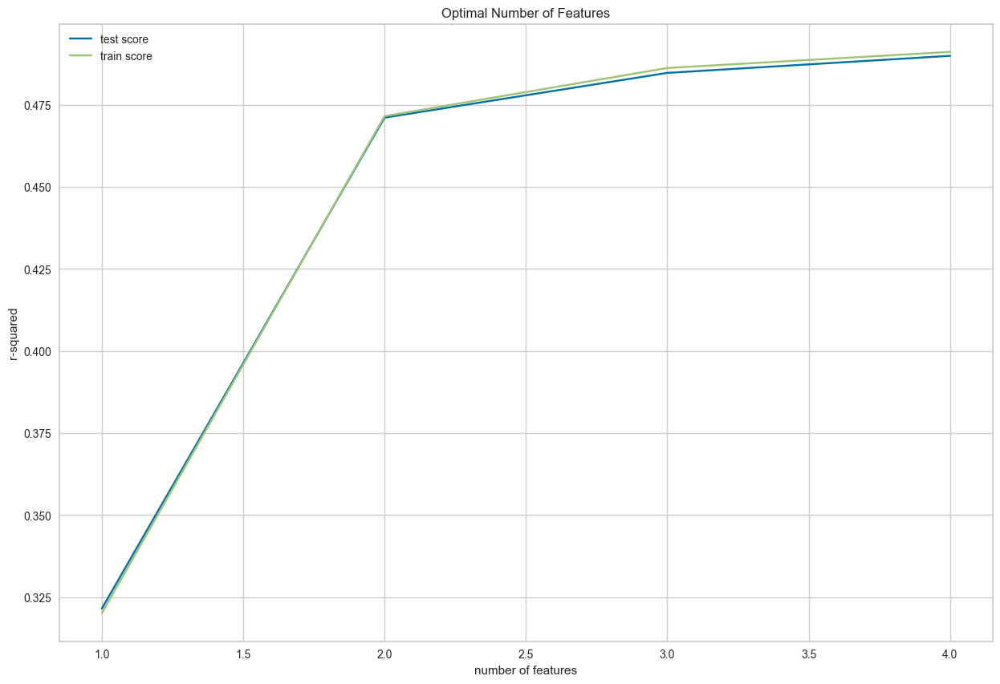

In [101]:
# Plotting the GridSearchCV results
plt.figure(figsize=(15,10))
plt.plot(res["param_n_features_to_select"], res["mean_test_score"])
plt.plot(res["param_n_features_to_select"], res["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='best')

As you can see the best value for R-squared is obtained when the number of features is equal to 5. Therefore,the optimal number of features is 5.

In [102]:
# Now we can choose the optimal value number of features and build a model
n_features_optimal = 4

# Create a pipeline
model = make_pipeline(PolynomialFeatures(degree=best_degree),Ridge(alpha=0.1 * best_i))
model.fit(X_train, y_train)

rfe = RFE(model, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Polynomial Regression Model:", mse)
print("Mean R-squared Score for the Polynomial Regression Model:", r2)
print("Mean RSS Score for the Polynomial Regression Model:", rss.values[0])

Mean Squared Error for the Polynomial Regression Model: 23995614042.694077
Mean R-squared Score for the Polynomial Regression Model: 0.6164954025400351
Mean RSS Score for the Polynomial Regression Model: 102821206172944.12


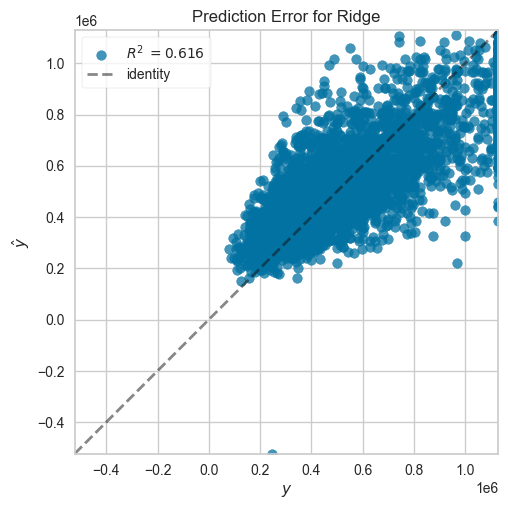

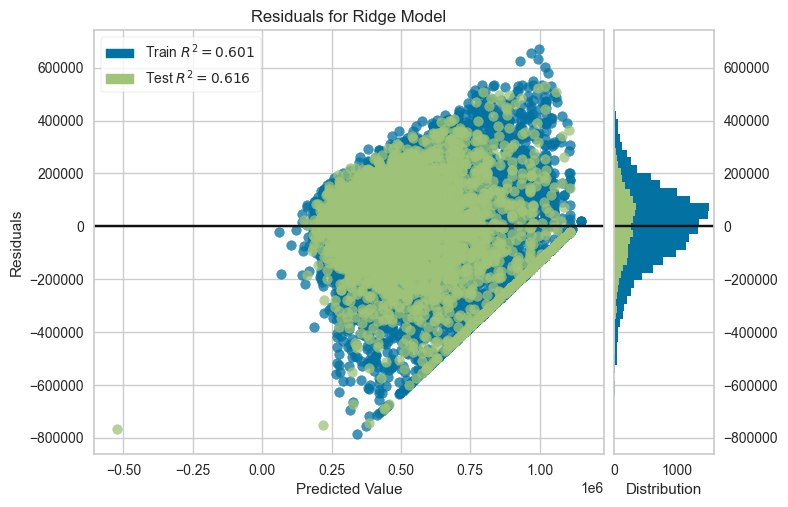

<Axes: title={'center': 'Residuals for Ridge Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [103]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

##### Cross-Validation ✅
##### Discretized Data ❌
##### Polynomial ✅

In [104]:
# Using the non-discretized data

# Copy the Data Frame
df_ridge_regression = combined_df_non_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_ridge_regression[feature_cols]
y = df_ridge_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

r2_scores_mean = []
delta = []
degrees = range(1,7)

for degree in degrees:
    for i in range(30, 50):
        # Create a ridge regression model
        model = make_pipeline(PolynomialFeatures(degree=degree), Ridge(alpha = i * 0.1))
        model.fit(X_train, y_train)
        # Get the cross-validation scores
        scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
        print(f'Cross Validation R-squared Scores for i value {i}: {scores}')
        r2_scores_mean.append((i,degree, np.mean(scores)))
        delta.append(i * 0.1)

# Find the best iteration and degree
best_i = sorted(r2_scores_mean, key=lambda x:x[2], reverse=True)[0][0]
best_degree = sorted(r2_scores_mean, key=lambda x:x[2], reverse=True)[0][1]
print(f'Best i value: {best_i}')
print(f'Best degree value: {best_degree}')

Cross Validation R-squared Scores for i value 30: [0.48921473 0.47856765 0.48218256 0.45298842 0.50442326 0.48196552
 0.48908543 0.47961279 0.49095127 0.46278101]
Cross Validation R-squared Scores for i value 31: [0.48920227 0.47857607 0.48217517 0.45299199 0.50442078 0.48196403
 0.48908101 0.47960501 0.49094792 0.46277898]
Cross Validation R-squared Scores for i value 32: [0.48918974 0.47858439 0.48216769 0.45299547 0.50441821 0.48196245
 0.48907649 0.47959715 0.49094448 0.46277686]
Cross Validation R-squared Scores for i value 33: [0.48917714 0.47859259 0.48216014 0.45299884 0.50441553 0.48196079
 0.48907188 0.47958923 0.49094095 0.46277467]
Cross Validation R-squared Scores for i value 34: [0.48916448 0.47860069 0.48215252 0.4530021  0.50441276 0.48195905
 0.48906719 0.47958125 0.49093733 0.46277238]
Cross Validation R-squared Scores for i value 35: [0.48915175 0.47860867 0.48214482 0.45300526 0.50440989 0.48195722
 0.4890624  0.47957319 0.49093361 0.46277001]
Cross Validation R-squ

In [105]:
# Hyperparameter tuning using grid-search cross-validation
# Specify hyperparameters
hyper_params = [{'n_features_to_select':list(range(1, len(X_train.columns)+1))}]

# Perform grid-search
poly = PolynomialFeatures(degree=best_degree)
X_poly_train = poly.fit_transform(X_train)
X_poly_test = poly.transform(X_test)

model = Ridge(alpha = 0.1 * best_i)
model.fit(X_poly_train, y_train)
rfe = RFE(model)

# call GridSearchCV
gscv = GridSearchCV(estimator=rfe, param_grid=hyper_params, scoring='r2', cv=kf, verbose=1, return_train_score=True)

# Fit the model
gscv.fit(X_poly_train, y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RFE(estimator=Ridge(alpha=3.0)),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [106]:
# GridSearchCV results
res = pd.DataFrame(gscv.cv_results_)
res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,62.004302,0.486196,0.000841,0.000282,1,{'n_features_to_select': 1},0.497257,0.491285,0.485651,0.462228,...,0.495464,0.497979,0.492376,0.492874,0.492762,0.494426,0.493728,0.496473,0.494510,0.001671
1,62.491218,0.366883,0.000939,0.000376,2,{'n_features_to_select': 2},0.499128,0.491289,0.486049,0.462753,...,0.496755,0.499258,0.493604,0.493925,0.493908,0.495604,0.495079,0.497556,0.495717,0.001695
2,61.922750,0.425121,0.000962,0.000426,3,{'n_features_to_select': 3},0.498935,0.491269,0.486059,0.462760,...,0.496755,0.499258,0.493616,0.493926,0.493913,0.495607,0.495093,0.497558,0.495723,0.001692
3,61.858214,0.403450,0.000858,0.000294,4,{'n_features_to_select': 4},0.527911,0.513935,0.514050,0.488390,...,0.519040,0.521824,0.516805,0.517952,0.516704,0.518598,0.518197,0.520514,0.518625,0.001521


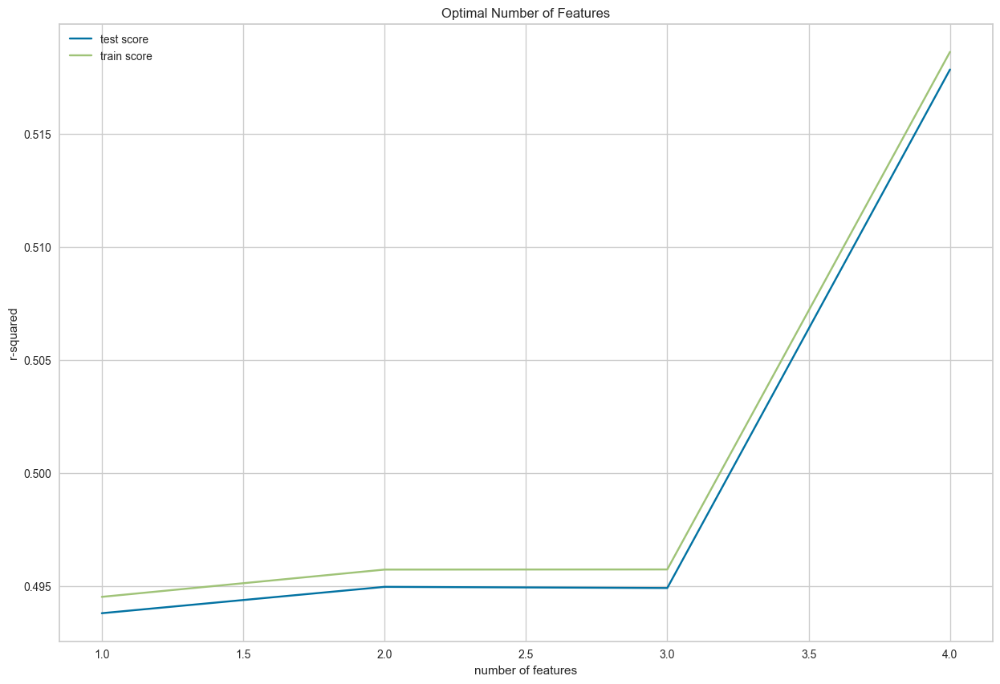

In [107]:
# Plotting the GridSearchCV results
plt.figure(figsize=(15,10))
plt.plot(res["param_n_features_to_select"], res["mean_test_score"])
plt.plot(res["param_n_features_to_select"], res["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='best')

As you can see the best value for R-squared is obtained when the number of features is equal to 5. Therefore,the optimal number of features is 5.

In [108]:
# Now we can choose the optimal value number of features and build a model
n_features_optimal = 4

# Create a pipeline
model = make_pipeline(PolynomialFeatures(degree=best_degree),Ridge(alpha=0.1 * best_i))
model.fit(X_train, y_train)

rfe = RFE(model, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = model.predict(X_test)

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Polynomial Regression Model:", mse)
print("Mean R-squared Score for the Polynomial Regression Model:", r2)
print("Mean RSS Score for the Polynomial Regression Model:", rss.values[0])

Mean Squared Error for the Polynomial Regression Model: 25585817675.42738
Mean R-squared Score for the Polynomial Regression Model: 0.5910803244776155
Mean RSS Score for the Polynomial Regression Model: 109635228739206.33


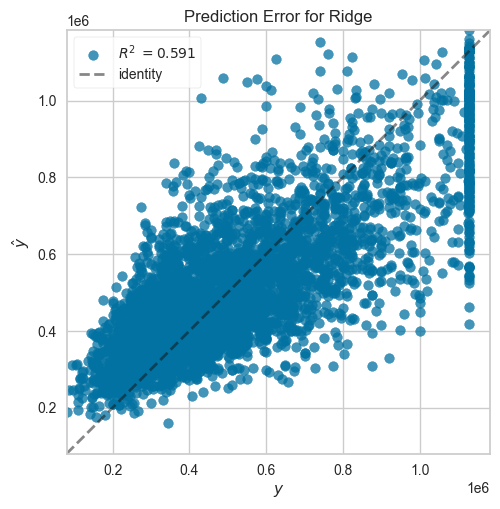

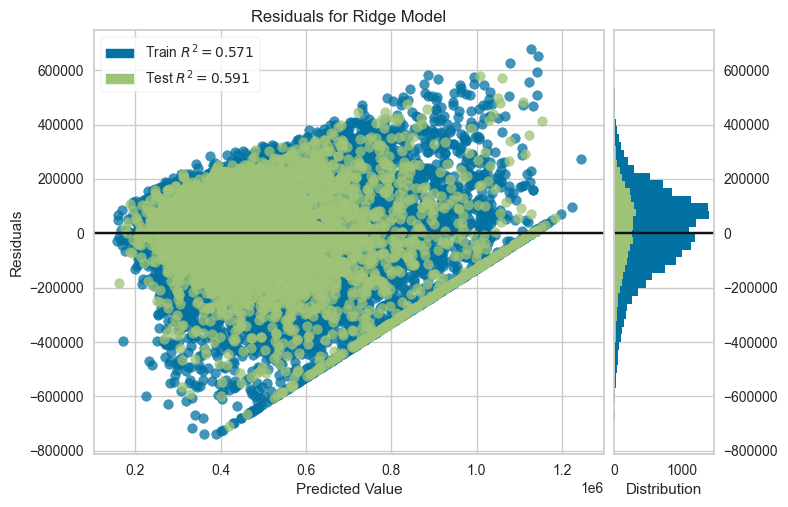

<Axes: title={'center': 'Residuals for Ridge Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [109]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.poof()

#### Step 4 - Lasso Regression
Lasso regression, also known as Least Absolute Shrinkage and Selection Operator, is a type of linear regression that adds a regularization term to the ordinary least squares(OLS). Similar to Ridge regression, Lasso regression is used to mitigate the problem of overfitting and improve the model's ability to generalize to new data.

The objective function of Lasso regression is,
$$min(RSS + \alpha\sum_{j=1}^{p}\left| w_j\right|)$$

where,
- $RSS$ - Residual Sum of Squares.
- $\alpha$ - This is the regularization parameter that controls the strength of the penalty.
- $w_j$ - The coefficients of the features.

##### Cross-Validation ✅
##### Discretized Data ❌
##### Polynomial ❌

In [110]:
# Using the non-discretized data

# Copy the Data Frame
df_lasso_regression = combined_df_non_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_lasso_regression[feature_cols]
y = df_lasso_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

r2_scores_mean = []
delta = []

for i in range(1, 500):
    # Create a Lasso regression model
    model = Lasso(alpha = i * 0.1)
    model.fit(X_train, y_train)
    # Get the cross-validation scores
    scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
    print(f'Cross Validation R-squared Scores for i value {i}: {scores}')
    r2_scores_mean.append((i, np.mean(scores)))
    delta.append(i * 0.1)

# Find the best iteration
best_i = sorted(r2_scores_mean, key=lambda x:x[1], reverse=True)[0][0]
print(f'Best i value: {best_i}')

Cross Validation R-squared Scores for i value 1: [0.48955383 0.47825867 0.48236544 0.45282817 0.50444773 0.48196748
 0.48917334 0.47981211 0.49100487 0.46279853]
Cross Validation R-squared Scores for i value 2: [0.48955363 0.47825871 0.48236529 0.45282825 0.50444759 0.48196774
 0.48917337 0.4798122  0.49100474 0.46279864]
Cross Validation R-squared Scores for i value 3: [0.48955344 0.47825876 0.48236513 0.45282833 0.50444745 0.48196801
 0.4891734  0.47981228 0.49100462 0.46279876]
Cross Validation R-squared Scores for i value 4: [0.48955324 0.4782588  0.48236498 0.4528284  0.50444731 0.48196827
 0.48917343 0.47981237 0.49100449 0.46279887]
Cross Validation R-squared Scores for i value 5: [0.48955305 0.47825884 0.48236483 0.45282848 0.50444717 0.48196854
 0.48917346 0.47981246 0.49100436 0.46279899]
Cross Validation R-squared Scores for i value 6: [0.48955285 0.4782589  0.48236467 0.45282856 0.50444703 0.4819688
 0.48917349 0.47981255 0.49100424 0.46279911]
Cross Validation R-squared Sc

In [139]:
# Build the Lasso Regression Model
model = Lasso(alpha = 0.1 * best_i)
model.fit(X_train, y_train)

# Evaluating the Lasso Regression Model
# predict prices of X_test
y_pred = model.predict(X_test)
y_test_ = y_test.to_numpy()

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test_-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Lasso Regression Model:", mse)
print("Mean R-squared Score for the Lasso Regression Model:", r2)
print("Mean RSS Score for the Lasso Regression Model:", rss)

Mean Squared Error for the Lasso Regression Model: 31569472047.12531
Mean R-squared Score for the Lasso Regression Model: 0.49544789110564036
Mean RSS Score for the Lasso Regression Model: 1.6967113375356577e+18


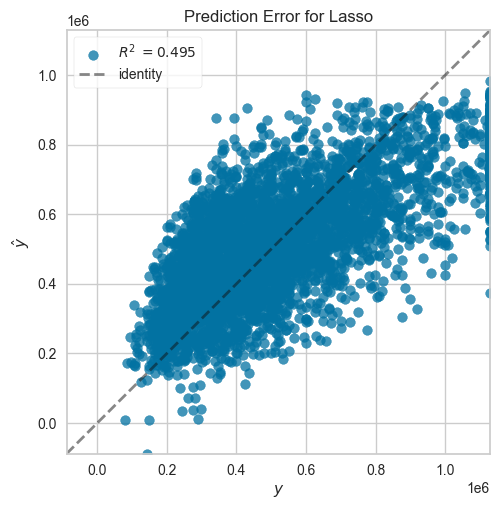

<Axes: title={'center': 'Prediction Error for Lasso'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [137]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

##### Cross-Validation ✅
##### Discretized Data ✅
##### Polynomial ❌

In [140]:
# Using the discretized data

# Copy the Data Frame
df_lasso_regression = combined_df_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_lasso_regression[feature_cols]
y = df_lasso_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

r2_scores_mean = []
delta = []

for i in range(1, 500):
    # Create a Lasso regression model
    model = Lasso(alpha = i * 0.1)
    model.fit(X_train, y_train)
    # Get the cross-validation scores
    scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
    print(f'Cross Validation R-squared Scores for i value {i}: {scores}')
    r2_scores_mean.append((i, np.mean(scores)))
    delta.append(i * 0.1)

# Find the best iteration
best_i = sorted(r2_scores_mean, key=lambda x:x[1], reverse=True)[0][0]
print(f'Best i value: {best_i}')

Cross Validation R-squared Scores for i value 1: [0.46554772 0.46116219 0.4650738  0.43485544 0.48371102 0.4630995
 0.46725994 0.46917346 0.47341384 0.44566614]
Cross Validation R-squared Scores for i value 2: [0.4655477  0.4611622  0.46507378 0.43485545 0.48371101 0.46309953
 0.46725994 0.46917346 0.47341383 0.44566615]
Cross Validation R-squared Scores for i value 3: [0.46554768 0.46116221 0.46507376 0.43485546 0.483711   0.46309956
 0.46725994 0.46917346 0.47341382 0.44566616]
Cross Validation R-squared Scores for i value 4: [0.46554766 0.46116221 0.46507375 0.43485547 0.48371098 0.46309959
 0.46725994 0.46917347 0.4734138  0.44566618]
Cross Validation R-squared Scores for i value 5: [0.46554765 0.46116222 0.46507373 0.43485548 0.48371097 0.46309961
 0.46725995 0.46917347 0.47341379 0.44566619]
Cross Validation R-squared Scores for i value 6: [0.46554763 0.46116222 0.46507371 0.43485549 0.48371096 0.46309964
 0.46725995 0.46917347 0.47341378 0.4456662 ]
Cross Validation R-squared Sc

In [142]:
# Build the Lasso Regression Model
model = Lasso(alpha = 0.1 * best_i)
model.fit(X_train, y_train)

# Evaluating the Lasso Regression Model
# predict prices of X_test
y_pred = model.predict(X_test)
y_test_ = y_test.to_numpy()

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test_-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Lasso Regression Model:", mse)
print("Mean R-squared Score for the Lasso Regression Model:", r2)
print("Mean RSS Score for the Lasso Regression Model:", rss)

Mean Squared Error for the Lasso Regression Model: 32625107277.54205
Mean R-squared Score for the Lasso Regression Model: 0.4785764343725383
Mean RSS Score for the Lasso Regression Model: 1.6747264887120338e+18


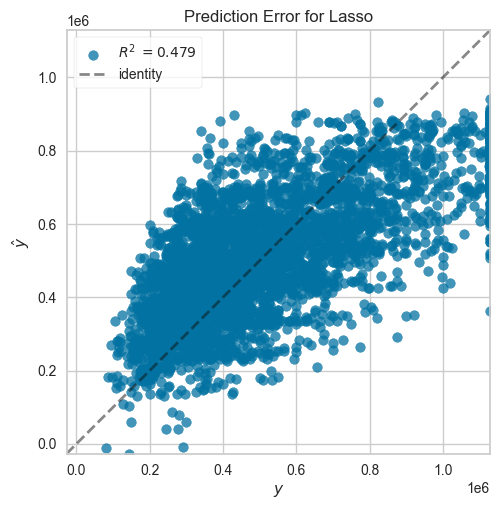

<Axes: title={'center': 'Prediction Error for Lasso'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [143]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

##### Cross-Validation ✅
##### Discretized Data ❌
##### Polynomial ✅

In [144]:
# Using the non-discretized data

# Copy the Data Frame
df_lasso_regression = combined_df_non_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_lasso_regression[feature_cols]
y = df_lasso_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

r2_scores_mean = []
delta = []
degrees = range(1,7)

for degree in degrees:
    for i in range(30, 50):
        # Create a lasso regression model
        model = make_pipeline(PolynomialFeatures(degree=degree), Lasso(alpha = i * 0.1))
        model.fit(X_train, y_train)
        # Get the cross-validation scores
        scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
        print(f'Cross Validation R-squared Scores for i value {i}: {scores}')
        r2_scores_mean.append((i,degree, np.mean(scores)))
        delta.append(i * 0.1)

# Find the best iteration and degree
best_i = sorted(r2_scores_mean, key=lambda x:x[2], reverse=True)[0][0]
best_degree = sorted(r2_scores_mean, key=lambda x:x[2], reverse=True)[0][1]
print(f'Best i value: {best_i}')
print(f'Best degree value: {best_degree}')

Cross Validation R-squared Scores for i value 30: [0.48954813 0.47825997 0.48236094 0.45283044 0.50444368 0.48197514
 0.4891742  0.47981462 0.49100117 0.46280188]
Cross Validation R-squared Scores for i value 31: [0.48954793 0.47826002 0.48236078 0.45283052 0.50444354 0.48197542
 0.48917423 0.4798147  0.49100104 0.46280199]
Cross Validation R-squared Scores for i value 32: [0.48954773 0.47826007 0.48236062 0.45283056 0.5044434  0.48197568
 0.48917426 0.47981483 0.49100091 0.46280211]
Cross Validation R-squared Scores for i value 33: [0.48954753 0.47826012 0.48236048 0.45283064 0.50444326 0.48197594
 0.48917429 0.47981491 0.49100079 0.46280222]
Cross Validation R-squared Scores for i value 34: [0.48954733 0.4782601  0.48236032 0.45283073 0.50444312 0.4819762
 0.48917432 0.47981499 0.49100066 0.46280233]
Cross Validation R-squared Scores for i value 35: [0.48954717 0.47826015 0.48236017 0.45283081 0.50444298 0.48197646
 0.48917435 0.47981507 0.49100053 0.46280246]
Cross Validation R-squa

In [145]:
# Hyperparameter tuning using grid-search cross-validation
# Specify hyperparameters
hyper_params = [{'n_features_to_select':list(range(1, len(X_train.columns)+1))}]

# Perform grid-search
poly = PolynomialFeatures(degree=best_degree)
X_poly_train = poly.fit_transform(X_train)
X_poly_test = poly.transform(X_test)

model = Lasso(alpha = 0.1 * best_i)
model.fit(X_poly_train, y_train)
rfe = RFE(model)

# call GridSearchCV
gscv = GridSearchCV(estimator=rfe, param_grid=hyper_params, scoring='r2', cv=kf, verbose=1,return_train_score=True)

# Fit the model
gscv.fit(X_poly_train, y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RFE(estimator=Lasso(alpha=3.0)),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [146]:
# GridSearchCV results
res = pd.DataFrame(gscv.cv_results_)
res

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,604.235311,231.495122,0.000956,0.000324,1,{'n_features_to_select': 1},0.269142,0.265563,0.258044,0.001800,...,0.270745,0.002283,0.168301,0.199200,0.268829,0.269719,0.070570,0.254306,0.201397,0.089709
1,505.019020,34.550120,0.001069,0.000654,2,{'n_features_to_select': 2},0.348541,0.310774,0.332891,0.033762,...,0.328978,0.035139,0.173310,0.201918,0.338432,0.330690,0.210177,0.337788,0.259568,0.096756
2,586.389014,246.812431,0.000898,0.000150,3,{'n_features_to_select': 3},0.349492,0.326735,0.359425,0.039507,...,0.344610,0.038298,0.391184,0.232746,0.348515,0.348335,0.213561,0.338743,0.291522,0.099068
3,549.580646,57.985768,0.002053,0.001954,4,{'n_features_to_select': 4},0.376943,0.339948,0.376900,0.308947,...,0.359298,0.310288,0.392785,0.306376,0.348941,0.367109,0.358114,0.356319,0.349992,0.024635


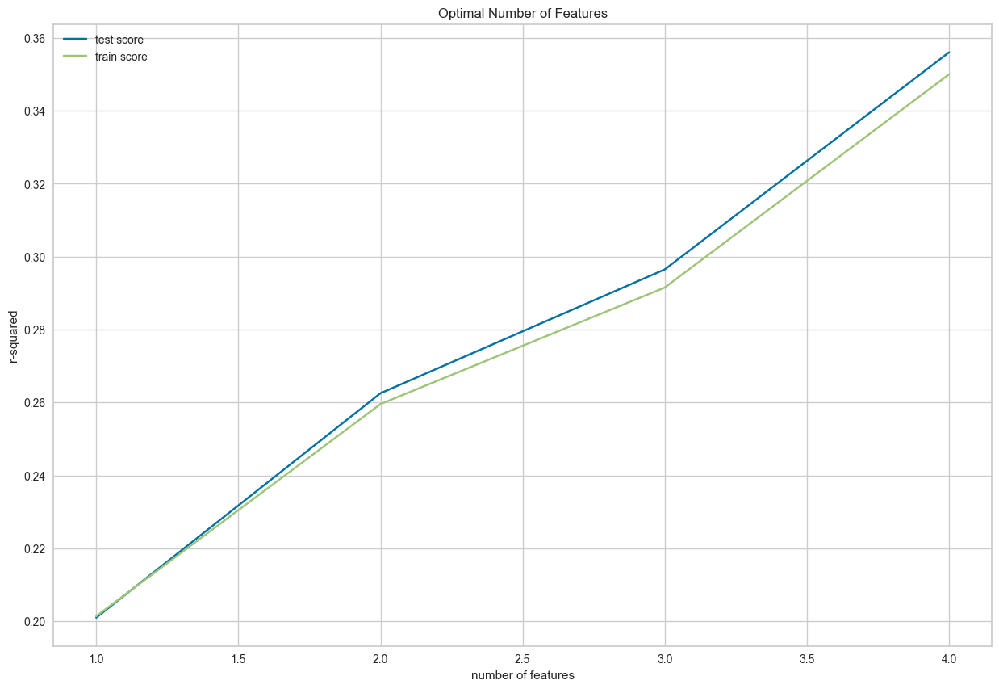

In [147]:
# Plotting the GridSearchCV results
plt.figure(figsize=(15,10))
plt.plot(res["param_n_features_to_select"], res["mean_test_score"])
plt.plot(res["param_n_features_to_select"], res["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='best')

As you can see the best value for R-squared is obtained when the number of features is equal to 5. Therefore,the optimal number of features is 5.

In [148]:
# Now we can choose the optimal value number of features and build a model
n_features_optimal = 4

# Create a pipeline
model = make_pipeline(PolynomialFeatures(degree=best_degree),Lasso(alpha=0.1 * best_i))
model.fit(X_train, y_train)

rfe = RFE(model, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = model.predict(X_test)
y_test_ = y_test.to_numpy()

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test_-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Polynomial Regression Model:", mse)
print("Mean R-squared Score for the Polynomial Regression Model:", r2)
print("Mean RSS Score for the Polynomial Regression Model:", rss)

Mean Squared Error for the Polynomial Regression Model: 24609148253.01257
Mean R-squared Score for the Polynomial Regression Model: 0.6066897276388857
Mean RSS Score for the Polynomial Regression Model: 1.795605392066946e+18


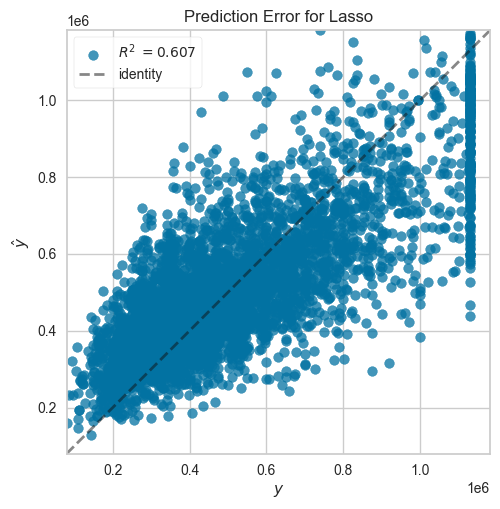

<Axes: title={'center': 'Prediction Error for Lasso'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [150]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

##### Cross-Validation ✅
##### Discretized Data ✅
##### Polynomial ✅

In [151]:
# Using the discretized data

# Copy the Data Frame
df_lasso_regression = combined_df_discretized.copy()

# We will use the significant features we have found for the Multiple Regression Model
feature_cols = ['sqft_living','zipcode','sqft_above', 'sqft_lot15']
X = df_lasso_regression[feature_cols]
y = df_lasso_regression[['price']]

# Use cross-validation fold with 10 splits
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

# Let's do a train_test_split first and then use cross-validation scores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

r2_scores_mean = []
delta = []
degrees = range(1,7)

for degree in degrees:
    for i in range(30, 50):
        # Create a ridge regression model
        model = make_pipeline(PolynomialFeatures(degree=degree), Ridge(alpha = i * 0.1))
        model.fit(X_train, y_train)
        # Get the cross-validation scores
        scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=kf)
        print(f'Cross Validation R-squared Scores for i value {i}: {scores}')
        r2_scores_mean.append((i,degree, np.mean(scores)))
        delta.append(i * 0.1)

# Find the best iteration and degree
best_i = sorted(r2_scores_mean, key=lambda x:x[2], reverse=True)[0][0]
best_degree = sorted(r2_scores_mean, key=lambda x:x[2], reverse=True)[0][1]
print(f'Best i value: {best_i}')
print(f'Best degree value: {best_degree}')

Cross Validation R-squared Scores for i value 30: [0.46554686 0.46116365 0.46507243 0.43485661 0.48371187 0.46310034
 0.46725984 0.46917097 0.47341436 0.4456663 ]
Cross Validation R-squared Scores for i value 31: [0.46554683 0.46116369 0.46507239 0.43485665 0.4837119  0.46310037
 0.46725984 0.46917089 0.47341438 0.44566631]
Cross Validation R-squared Scores for i value 32: [0.4655468  0.46116374 0.46507234 0.43485669 0.48371192 0.4631004
 0.46725983 0.46917081 0.4734144  0.44566631]
Cross Validation R-squared Scores for i value 33: [0.46554677 0.46116379 0.46507229 0.43485673 0.48371195 0.46310043
 0.46725983 0.46917073 0.47341441 0.44566632]
Cross Validation R-squared Scores for i value 34: [0.46554674 0.46116384 0.46507225 0.43485677 0.48371198 0.46310046
 0.46725983 0.46917064 0.47341443 0.44566632]
Cross Validation R-squared Scores for i value 35: [0.46554671 0.46116389 0.4650722  0.43485681 0.48371201 0.46310049
 0.46725982 0.46917056 0.47341445 0.44566633]
Cross Validation R-squa

In [152]:
# Hyperparameter tuning using grid-search cross-validation
# Specify hyperparameters
hyper_params = [{'n_features_to_select':list(range(1, len(X_train.columns)+1))}]

# Perform grid-search
poly = PolynomialFeatures(degree=best_degree)
X_poly_train = poly.fit_transform(X_train)
X_poly_test = poly.transform(X_test)

model = Lasso(alpha = 0.1 * best_i)
model.fit(X_poly_train, y_train)
rfe = RFE(model)

# call GridSearchCV
gscv = GridSearchCV(estimator=rfe, param_grid=hyper_params, scoring='r2', cv=kf, verbose=1,return_train_score=True)

# Fit the model
gscv.fit(X_poly_train, y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RFE(estimator=Lasso(alpha=3.0)),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [153]:
# GridSearchCV results
res = pd.DataFrame(gscv.cv_results_)
res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,569.772470,73.887011,0.001645,0.000933,1,{'n_features_to_select': 1},0.445803,0.445448,0.016966,0.022769,...,0.022014,0.021288,0.446492,0.447078,0.447987,0.446926,0.447802,0.449864,0.362676,0.170515
1,702.334426,280.069764,0.004003,0.001950,2,{'n_features_to_select': 2},0.446938,0.477801,0.450545,0.451611,...,0.451002,0.489098,0.477603,0.478129,0.478320,0.479102,0.478550,0.451509,0.471337,0.013727
2,519.423252,70.876307,0.001939,0.001343,3,{'n_features_to_select': 3},0.463048,0.478373,0.456116,0.451739,...,0.455231,0.489320,0.485034,0.486156,0.478760,0.486962,0.485939,0.456683,0.476554,0.012748
3,852.494741,178.009091,0.003819,0.001006,4,{'n_features_to_select': 4},0.472255,0.487436,0.463123,0.452857,...,0.463458,0.490856,0.486390,0.491108,0.487399,0.491582,0.490138,0.476690,0.484023,0.009020


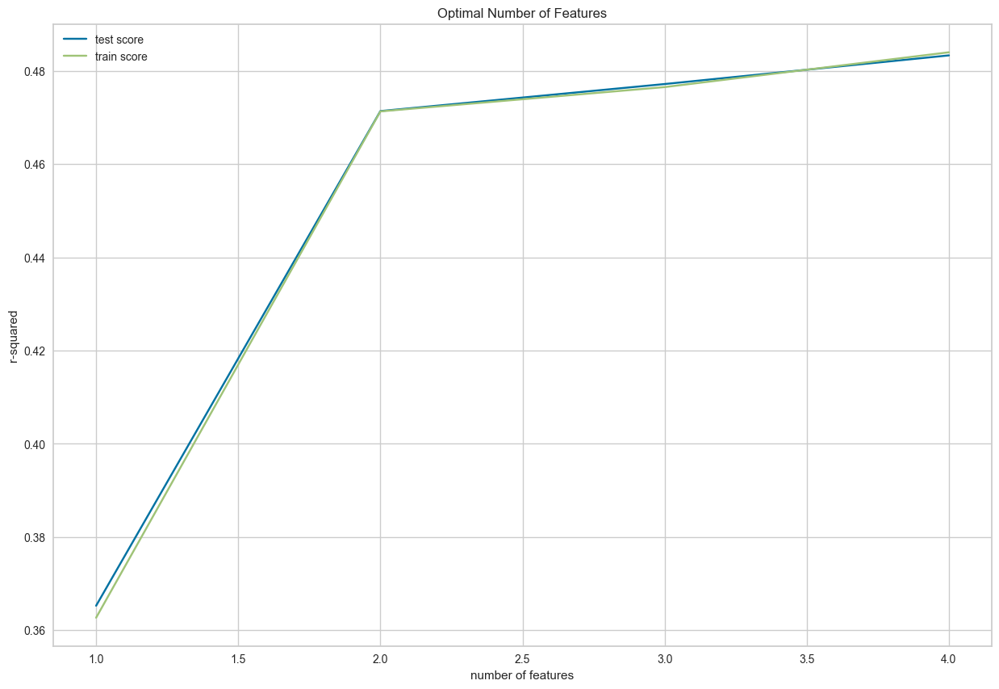

In [154]:
# Plotting the GridSearchCV results
plt.figure(figsize=(15,10))
plt.plot(res["param_n_features_to_select"], res["mean_test_score"])
plt.plot(res["param_n_features_to_select"], res["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='best')

As you can see the best value for R-squared is obtained when the number of features is equal to 5. Therefore,the optimal number of features is 5.

In [155]:
# Now we can choose the optimal value number of features and build a model
n_features_optimal = 4

# Create a pipeline
model = make_pipeline(PolynomialFeatures(degree=best_degree),Lasso(alpha=0.1 * best_i))
model.fit(X_train, y_train)

rfe = RFE(model, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = model.predict(X_test)
y_test_ = y_test.to_numpy()

# Calculate the Mean Squared Error(MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RSS
rss = np.sum((y_test_-y_pred)**2)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)

# Print the average MSE, R-squared, RSS
print("Mean Squared Error for the Polynomial Regression Model:", mse)
print("Mean R-squared Score for the Polynomial Regression Model:", r2)
print("Mean RSS Score for the Polynomial Regression Model:", rss)

Mean Squared Error for the Polynomial Regression Model: 25246587325.07409
Mean R-squared Score for the Polynomial Regression Model: 0.596501998568846
Mean RSS Score for the Polynomial Regression Model: 1.7877356678472207e+18


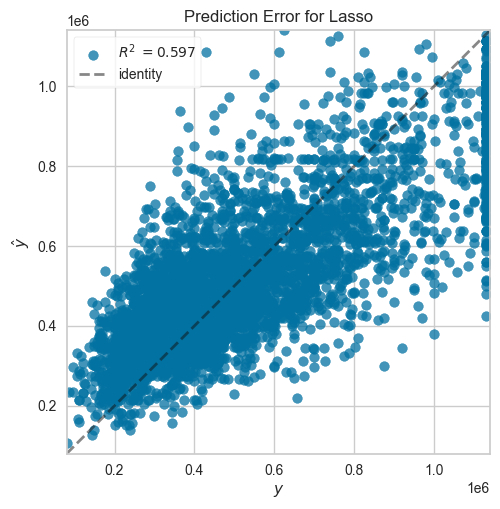

<Axes: title={'center': 'Prediction Error for Lasso'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [156]:
# Prediction error and residuals
visualizer = PredictionError(model, bestfit=False)
y_test_sq = y_test.squeeze()
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test_sq)  # Evaluate the model on the test data
visualizer.poof() 

#### 1.4.2 Comparing Regression Algorithms
We have already checked the Mean-squared value, R-squared score, and RSS(Residual Sum of Squares) value for the dataset for various regression algorithms. It is better to select an algorithm that has a lower Mean-squared value and RSS value. From the discussed algorithms, we can see that, the **replace** has the minimum Mean-squared value and R-squared value. Therefore, we can deduce that it is the optimal algorithm for the `price` prediction.

##### <u>Mean-squared Value</u>
The mean squared error (MSE) is a measure of the average squared difference between the actual and predicted values in a regression model. It provides a way to quantify the overall accuracy of the model's predictions, with lower values indicating better performance.

From the above values we can see that, the <span style='background-color: #FFFF6E;'>Polynomial Lasso Regression with Discretized data and Cross-Validation set</span> has the lowest Mean-squared values and <span style='background-color: #FFFF6E;'>Polynomial Lasso Regression with Non-Discretized data and Cross-Validation set</span> has the second lowest Mean-squared values.

##### <u>R-squared Value</u>
The R-squared value, also known as the coefficient of determination, represents the proportion of the variance in the dependent variable that is predictable from the independent variables. It is a measure of how well the regression model fits the observed data, with higher values indicating a better fit.

From the above values we can see that, the <span style='background-color: #FFFF6E;'><span style='background-color: #FFFF6E;'>Polynomial Lasso Regression with Non-Discretized data and Cross-Validation set</span></span> has the highest R-squared values.

Based on that, we can deduce that <span style='background-color: #FFFF6E;'><span style='background-color: #FFFF6E;'>Polynomial Lasso Regression with Non-Discretized data and Cross-Validation set</span></span> is the optimal regression algorithm for this dataset.

#### 1.4.3 Insights
As per the graphs and data analysis results we can see the following insights.

- The price of a house is mainly dependent on the number of square feet in living, lot, and above.
- The price also depends on the house grade as well.
- The price range varies although the house has several bedrooms and bathrooms and there can be houses with low price which has several bedrooms and bathrooms,
- There are some areas that were preferred by customers due to other reasons that were not mentioned in the dataset. That's why the zipcode value was a significant variable.
- Having a waterfront had a minimum effect on the prices of houses.
- Although the condition was considered in our models it has a direct effect on the grade of a house.
- The prices were mainly focused on the land size than other environmental variables like having a waterfront, etc.

# References
- Pandey (Ph.D.), A.K. (2024). Regression algorithms. [online] Medium. Available at: https://arunp77.medium.com/regression-algorithms-29f112797724 [Accessed 7 Apr. 2024].
- IBM (2023). About Linear Regression | IBM. [online] www.ibm.com. Available at: https://www.ibm.com/topics/linear-regression.
- Taylor, S. (2022). Multiple Linear Regression. [online] Corporate Finance Institute. Available at: https://corporatefinanceinstitute.com/resources/data-science/multiple-linear-regression/.
- Agrawal, R. (2021). Polynomial Regression | What is Polynomial Regression. [online] Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2021/07/all-you-need-to-know-about-polynomial-regression/.
- www.ibm.com. (n.d.). What is ridge regression? | IBM. [online] Available at: https://www.ibm.com/topics/ridge-regression.
- Team, G.L. (2021). A Complete understanding of LASSO Regression. [online] GreatLearning Blog: Free Resources what Matters to shape your Career! Available at: https://www.mygreatlearning.com/blog/understanding-of-lasso-regression.
- www.ibm.com. (n.d.). What is lasso regression? | IBM. [online] Available at: https://www.ibm.com/topics/lasso-regression.